In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
import math
#C.TulugKucukogut
#OzgeAkat

In [2]:
dataframe = pd.read_excel('/home/tulug/Downloads/rent.xlsx')
dataframe

,listing_id,type,sub_type,start_date,end_date,listing_type,building_age,total_floor_count,floor_no,room_count,size,student_avaliable,mortgage_avaliable,address,furnished,heating_type,price,currency
0,1.0,Konut,Daire,1/3/19,1/3/19,satılık,3,4,Kot 3,3+1,130.0,NaN,NaN,Kocaeli/Körfez/Fatih,Eşyasız,Kalorifer (Doğalgaz),NaN,NaN
1,2.0,Konut,Daire,1/2/19,1/2/19,satılık,0,5,1,4+1,175.0,NaN,NaN,Ankara/Yenimahalle/Burç,Eşyasız,Kombi (Doğalgaz),209500.0,TRY
2,3.0,Konut,Daire,1/2/19,1/2/19,satılık,0,3,1,3+1,125.0,NaN,NaN,Antalya/Kepez/Kütükçü,Eşyasız,Klima,210000.0,TRY
3,4.0,Konut,Daire,1/2/19,1/2/19,satılık,0,10,7,2+1,72.0,NaN,NaN,İstanbul/Esenler/Kazım Karabekir,Eşyasız,Klima,285000.0,TRY
4,5.0,Konut,Daire,1/2/19,1/2/19,satılık,0,4,3,1+1,75.0,NaN,NaN,İstanbul/Beylikdüzü/Yakuplu,Eşyasız,Kombi (Doğalgaz),139000.0,TRY
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199303,199304.0,Konut,Daire,2/9/18,11/18/18,satılık,0,5,3,3+1,130.0,NaN,NaN,Tekirdağ/Çorlu/Reşadiye,Eşyasız,Kombi (Doğalgaz),280000.0,TRY
199304,199305.0,Konut,Daire,2/9/18,12/3/18,satılık,6-10 arası,3,Kot 3,3+1,240.0,NaN,NaN,İzmir/Torbalı/Fevzi Çakmak,Eşyasız,Klima,295000.0,TRY
199305,199306.0,Konut,Daire,2/9/18,5/10/18,satılık,0,10-20 arası,7,3+1,170.0,NaN,NaN,Mersin/Yenişehir/50. Yıl,Eşyasız,Merkezi Sistem,600000.0,TRY
199306,199307.0,Konut,Daire,2/9/18,2/14/18,satılık,0,6,1,2+1,105.0,NaN,NaN,Tekirdağ/Çerkezköy/Kızılpınar,Eşyasız,Kombi (Doğalgaz),120500.0,TRY


In [3]:
dataframe.head()

,listing_id,type,sub_type,start_date,end_date,listing_type,building_age,total_floor_count,floor_no,room_count,size,student_avaliable,mortgage_avaliable,address,furnished,heating_type,price,currency
0,1.0,Konut,Daire,1/3/19,1/3/19,satılık,3,4,Kot 3,3+1,130.0,NaN,NaN,Kocaeli/Körfez/Fatih,Eşyasız,Kalorifer (Doğalgaz),NaN,NaN
1,2.0,Konut,Daire,1/2/19,1/2/19,satılık,0,5,1,4+1,175.0,NaN,NaN,Ankara/Yenimahalle/Burç,Eşyasız,Kombi (Doğalgaz),209500.0,TRY
2,3.0,Konut,Daire,1/2/19,1/2/19,satılık,0,3,1,3+1,125.0,NaN,NaN,Antalya/Kepez/Kütükçü,Eşyasız,Klima,210000.0,TRY
3,4.0,Konut,Daire,1/2/19,1/2/19,satılık,0,10,7,2+1,72.0,NaN,NaN,İstanbul/Esenler/Kazım Karabekir,Eşyasız,Klima,285000.0,TRY
4,5.0,Konut,Daire,1/2/19,1/2/19,satılık,0,4,3,1+1,75.0,NaN,NaN,İstanbul/Beylikdüzü/Yakuplu,Eşyasız,Kombi (Doğalgaz),139000.0,TRY


In [4]:
dataframe.tail()

,listing_id,type,sub_type,start_date,end_date,listing_type,building_age,total_floor_count,floor_no,room_count,size,student_avaliable,mortgage_avaliable,address,furnished,heating_type,price,currency
199303,199304.0,Konut,Daire,2/9/18,11/18/18,satılık,0,5,3,3+1,130.0,NaN,NaN,Tekirdağ/Çorlu/Reşadiye,Eşyasız,Kombi (Doğalgaz),280000.0,TRY
199304,199305.0,Konut,Daire,2/9/18,12/3/18,satılık,6-10 arası,3,Kot 3,3+1,240.0,NaN,NaN,İzmir/Torbalı/Fevzi Çakmak,Eşyasız,Klima,295000.0,TRY
199305,199306.0,Konut,Daire,2/9/18,5/10/18,satılık,0,10-20 arası,7,3+1,170.0,NaN,NaN,Mersin/Yenişehir/50. Yıl,Eşyasız,Merkezi Sistem,600000.0,TRY
199306,199307.0,Konut,Daire,2/9/18,2/14/18,satılık,0,6,1,2+1,105.0,NaN,NaN,Tekirdağ/Çerkezköy/Kızılpınar,Eşyasız,Kombi (Doğalgaz),120500.0,TRY
199307,199308.0,Konut,Daire,2/9/18,6/7/18,satılık,0,8,4,3+1,165.0,NaN,NaN,Mersin/Mezitli/Merkez,Eşyasız,Kombi (Doğalgaz),265000.0,TRY


In [5]:
dataframe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 199308 entries, 0 to 199307
Data columns (total 18 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   listing_id          199276 non-null  float64
 1   type                199276 non-null  object 
 2   sub_type            199276 non-null  object 
 3   start_date          199276 non-null  object 
 4   end_date            199276 non-null  object 
 5   listing_type        199276 non-null  object 
 6   building_age        199276 non-null  object 
 7   total_floor_count   199276 non-null  object 
 8   floor_no            199276 non-null  object 
 9   room_count          199276 non-null  object 
 10  size                199118 non-null  float64
 11  student_avaliable   0 non-null       float64
 12  mortgage_avaliable  0 non-null       float64
 13  address             199146 non-null  object 
 14  furnished           199276 non-null  object 
 15  heating_type        199276 non-nul

In [6]:
# #of the missing rows
dataframe.isnull().sum()

listing_id                32
type                      32
sub_type                  32
start_date                32
end_date                  32
listing_type              32
building_age              32
total_floor_count         32
floor_no                  32
room_count                32
size                     190
student_avaliable     199308
mortgage_avaliable    199308
address                  162
furnished                 32
heating_type              32
price                     53
currency                  53
dtype: int64

In [7]:
#row and column number of data
dataframe.shape

(199308, 18)

In [8]:
#correlation of data
dataframe.corr()

,listing_id,size,student_avaliable,mortgage_avaliable,price
listing_id,1.000000,-0.007963,NaN,NaN,-0.007535
size,-0.007963,1.000000,NaN,NaN,0.000270
student_avaliable,NaN,NaN,NaN,NaN,NaN
mortgage_avaliable,NaN,NaN,NaN,NaN,NaN
price,-0.007535,0.000270,NaN,NaN,1.000000


In [9]:
#features of data
columnNames = list(dataframe.columns.values)
columnNames

['listing_id',
 'type',
 'sub_type',
 'start_date',
 'end_date',
 'listing_type',
 'building_age',
 'total_floor_count',
 'floor_no',
 'room_count',
 'size',
 'student_avaliable',
 'mortgage_avaliable',
 'address',
 'furnished',
 'heating_type',
 'price',
 'currency']

In [10]:
dataframe["price"] #is dependent value

0              NaN
1         209500.0
2         210000.0
3         285000.0
4         139000.0
            ...   
199303    280000.0
199304    295000.0
199305    600000.0
199306    120500.0
199307    265000.0
Name: price, Length: 199308, dtype: float64

In [11]:
#student_avaliable     225737
#mortgage_avaliable    225737 should be removed from dataframe because of null values
dataframe.drop(columns=["student_avaliable", "mortgage_avaliable"], inplace=True)

In [12]:
#features of data
columnNames = list(dataframe.columns.values)
columnNames

['listing_id',
 'type',
 'sub_type',
 'start_date',
 'end_date',
 'listing_type',
 'building_age',
 'total_floor_count',
 'floor_no',
 'room_count',
 'size',
 'address',
 'furnished',
 'heating_type',
 'price',
 'currency']

In [13]:
dataframe

,listing_id,type,sub_type,start_date,end_date,listing_type,building_age,total_floor_count,floor_no,room_count,size,address,furnished,heating_type,price,currency
0,1.0,Konut,Daire,1/3/19,1/3/19,satılık,3,4,Kot 3,3+1,130.0,Kocaeli/Körfez/Fatih,Eşyasız,Kalorifer (Doğalgaz),NaN,NaN
1,2.0,Konut,Daire,1/2/19,1/2/19,satılık,0,5,1,4+1,175.0,Ankara/Yenimahalle/Burç,Eşyasız,Kombi (Doğalgaz),209500.0,TRY
2,3.0,Konut,Daire,1/2/19,1/2/19,satılık,0,3,1,3+1,125.0,Antalya/Kepez/Kütükçü,Eşyasız,Klima,210000.0,TRY
3,4.0,Konut,Daire,1/2/19,1/2/19,satılık,0,10,7,2+1,72.0,İstanbul/Esenler/Kazım Karabekir,Eşyasız,Klima,285000.0,TRY
4,5.0,Konut,Daire,1/2/19,1/2/19,satılık,0,4,3,1+1,75.0,İstanbul/Beylikdüzü/Yakuplu,Eşyasız,Kombi (Doğalgaz),139000.0,TRY
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199303,199304.0,Konut,Daire,2/9/18,11/18/18,satılık,0,5,3,3+1,130.0,Tekirdağ/Çorlu/Reşadiye,Eşyasız,Kombi (Doğalgaz),280000.0,TRY
199304,199305.0,Konut,Daire,2/9/18,12/3/18,satılık,6-10 arası,3,Kot 3,3+1,240.0,İzmir/Torbalı/Fevzi Çakmak,Eşyasız,Klima,295000.0,TRY
199305,199306.0,Konut,Daire,2/9/18,5/10/18,satılık,0,10-20 arası,7,3+1,170.0,Mersin/Yenişehir/50. Yıl,Eşyasız,Merkezi Sistem,600000.0,TRY
199306,199307.0,Konut,Daire,2/9/18,2/14/18,satılık,0,6,1,2+1,105.0,Tekirdağ/Çerkezköy/Kızılpınar,Eşyasız,Kombi (Doğalgaz),120500.0,TRY


In [14]:
dataframe.dropna(inplace=True)
dataframe

,listing_id,type,sub_type,start_date,end_date,listing_type,building_age,total_floor_count,floor_no,room_count,size,address,furnished,heating_type,price,currency
1,2.0,Konut,Daire,1/2/19,1/2/19,satılık,0,5,1,4+1,175.0,Ankara/Yenimahalle/Burç,Eşyasız,Kombi (Doğalgaz),209500.0,TRY
2,3.0,Konut,Daire,1/2/19,1/2/19,satılık,0,3,1,3+1,125.0,Antalya/Kepez/Kütükçü,Eşyasız,Klima,210000.0,TRY
3,4.0,Konut,Daire,1/2/19,1/2/19,satılık,0,10,7,2+1,72.0,İstanbul/Esenler/Kazım Karabekir,Eşyasız,Klima,285000.0,TRY
4,5.0,Konut,Daire,1/2/19,1/2/19,satılık,0,4,3,1+1,75.0,İstanbul/Beylikdüzü/Yakuplu,Eşyasız,Kombi (Doğalgaz),139000.0,TRY
5,6.0,Konut,Daire,1/2/19,1/2/19,satılık,0,3,2,2+1,98.0,Eskişehir/Odunpazarı/Orhangazi,Eşyalı (Mobilyalı),Kombi (Doğalgaz),165000.0,TRY
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199303,199304.0,Konut,Daire,2/9/18,11/18/18,satılık,0,5,3,3+1,130.0,Tekirdağ/Çorlu/Reşadiye,Eşyasız,Kombi (Doğalgaz),280000.0,TRY
199304,199305.0,Konut,Daire,2/9/18,12/3/18,satılık,6-10 arası,3,Kot 3,3+1,240.0,İzmir/Torbalı/Fevzi Çakmak,Eşyasız,Klima,295000.0,TRY
199305,199306.0,Konut,Daire,2/9/18,5/10/18,satılık,0,10-20 arası,7,3+1,170.0,Mersin/Yenişehir/50. Yıl,Eşyasız,Merkezi Sistem,600000.0,TRY
199306,199307.0,Konut,Daire,2/9/18,2/14/18,satılık,0,6,1,2+1,105.0,Tekirdağ/Çerkezköy/Kızılpınar,Eşyasız,Kombi (Doğalgaz),120500.0,TRY


In [15]:
filt=dataframe["listing_type"]=="satılık"
filt

1         True
2         True
3         True
4         True
5         True
          ... 
199303    True
199304    True
199305    True
199306    True
199307    True
Name: listing_type, Length: 198979, dtype: bool

In [16]:
dataframe[filt]

,listing_id,type,sub_type,start_date,end_date,listing_type,building_age,total_floor_count,floor_no,room_count,size,address,furnished,heating_type,price,currency
1,2.0,Konut,Daire,1/2/19,1/2/19,satılık,0,5,1,4+1,175.0,Ankara/Yenimahalle/Burç,Eşyasız,Kombi (Doğalgaz),209500.0,TRY
2,3.0,Konut,Daire,1/2/19,1/2/19,satılık,0,3,1,3+1,125.0,Antalya/Kepez/Kütükçü,Eşyasız,Klima,210000.0,TRY
3,4.0,Konut,Daire,1/2/19,1/2/19,satılık,0,10,7,2+1,72.0,İstanbul/Esenler/Kazım Karabekir,Eşyasız,Klima,285000.0,TRY
4,5.0,Konut,Daire,1/2/19,1/2/19,satılık,0,4,3,1+1,75.0,İstanbul/Beylikdüzü/Yakuplu,Eşyasız,Kombi (Doğalgaz),139000.0,TRY
5,6.0,Konut,Daire,1/2/19,1/2/19,satılık,0,3,2,2+1,98.0,Eskişehir/Odunpazarı/Orhangazi,Eşyalı (Mobilyalı),Kombi (Doğalgaz),165000.0,TRY
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199303,199304.0,Konut,Daire,2/9/18,11/18/18,satılık,0,5,3,3+1,130.0,Tekirdağ/Çorlu/Reşadiye,Eşyasız,Kombi (Doğalgaz),280000.0,TRY
199304,199305.0,Konut,Daire,2/9/18,12/3/18,satılık,6-10 arası,3,Kot 3,3+1,240.0,İzmir/Torbalı/Fevzi Çakmak,Eşyasız,Klima,295000.0,TRY
199305,199306.0,Konut,Daire,2/9/18,5/10/18,satılık,0,10-20 arası,7,3+1,170.0,Mersin/Yenişehir/50. Yıl,Eşyasız,Merkezi Sistem,600000.0,TRY
199306,199307.0,Konut,Daire,2/9/18,2/14/18,satılık,0,6,1,2+1,105.0,Tekirdağ/Çerkezköy/Kızılpınar,Eşyasız,Kombi (Doğalgaz),120500.0,TRY


In [17]:
dataframe[(dataframe["listing_type"]=="satılık")]

,listing_id,type,sub_type,start_date,end_date,listing_type,building_age,total_floor_count,floor_no,room_count,size,address,furnished,heating_type,price,currency
1,2.0,Konut,Daire,1/2/19,1/2/19,satılık,0,5,1,4+1,175.0,Ankara/Yenimahalle/Burç,Eşyasız,Kombi (Doğalgaz),209500.0,TRY
2,3.0,Konut,Daire,1/2/19,1/2/19,satılık,0,3,1,3+1,125.0,Antalya/Kepez/Kütükçü,Eşyasız,Klima,210000.0,TRY
3,4.0,Konut,Daire,1/2/19,1/2/19,satılık,0,10,7,2+1,72.0,İstanbul/Esenler/Kazım Karabekir,Eşyasız,Klima,285000.0,TRY
4,5.0,Konut,Daire,1/2/19,1/2/19,satılık,0,4,3,1+1,75.0,İstanbul/Beylikdüzü/Yakuplu,Eşyasız,Kombi (Doğalgaz),139000.0,TRY
5,6.0,Konut,Daire,1/2/19,1/2/19,satılık,0,3,2,2+1,98.0,Eskişehir/Odunpazarı/Orhangazi,Eşyalı (Mobilyalı),Kombi (Doğalgaz),165000.0,TRY
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199303,199304.0,Konut,Daire,2/9/18,11/18/18,satılık,0,5,3,3+1,130.0,Tekirdağ/Çorlu/Reşadiye,Eşyasız,Kombi (Doğalgaz),280000.0,TRY
199304,199305.0,Konut,Daire,2/9/18,12/3/18,satılık,6-10 arası,3,Kot 3,3+1,240.0,İzmir/Torbalı/Fevzi Çakmak,Eşyasız,Klima,295000.0,TRY
199305,199306.0,Konut,Daire,2/9/18,5/10/18,satılık,0,10-20 arası,7,3+1,170.0,Mersin/Yenişehir/50. Yıl,Eşyasız,Merkezi Sistem,600000.0,TRY
199306,199307.0,Konut,Daire,2/9/18,2/14/18,satılık,0,6,1,2+1,105.0,Tekirdağ/Çerkezköy/Kızılpınar,Eşyasız,Kombi (Doğalgaz),120500.0,TRY


In [18]:
dataframe[(dataframe["listing_type"]!="satılık")]

,listing_id,type,sub_type,start_date,end_date,listing_type,building_age,total_floor_count,floor_no,room_count,size,address,furnished,heating_type,price,currency


In [19]:
#so in listing type every  data is satılık so it can be removed
dataframe.drop(columns=["listing_type"], inplace=True)


In [20]:
dataframe

,listing_id,type,sub_type,start_date,end_date,building_age,total_floor_count,floor_no,room_count,size,address,furnished,heating_type,price,currency
1,2.0,Konut,Daire,1/2/19,1/2/19,0,5,1,4+1,175.0,Ankara/Yenimahalle/Burç,Eşyasız,Kombi (Doğalgaz),209500.0,TRY
2,3.0,Konut,Daire,1/2/19,1/2/19,0,3,1,3+1,125.0,Antalya/Kepez/Kütükçü,Eşyasız,Klima,210000.0,TRY
3,4.0,Konut,Daire,1/2/19,1/2/19,0,10,7,2+1,72.0,İstanbul/Esenler/Kazım Karabekir,Eşyasız,Klima,285000.0,TRY
4,5.0,Konut,Daire,1/2/19,1/2/19,0,4,3,1+1,75.0,İstanbul/Beylikdüzü/Yakuplu,Eşyasız,Kombi (Doğalgaz),139000.0,TRY
5,6.0,Konut,Daire,1/2/19,1/2/19,0,3,2,2+1,98.0,Eskişehir/Odunpazarı/Orhangazi,Eşyalı (Mobilyalı),Kombi (Doğalgaz),165000.0,TRY
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199303,199304.0,Konut,Daire,2/9/18,11/18/18,0,5,3,3+1,130.0,Tekirdağ/Çorlu/Reşadiye,Eşyasız,Kombi (Doğalgaz),280000.0,TRY
199304,199305.0,Konut,Daire,2/9/18,12/3/18,6-10 arası,3,Kot 3,3+1,240.0,İzmir/Torbalı/Fevzi Çakmak,Eşyasız,Klima,295000.0,TRY
199305,199306.0,Konut,Daire,2/9/18,5/10/18,0,10-20 arası,7,3+1,170.0,Mersin/Yenişehir/50. Yıl,Eşyasız,Merkezi Sistem,600000.0,TRY
199306,199307.0,Konut,Daire,2/9/18,2/14/18,0,6,1,2+1,105.0,Tekirdağ/Çerkezköy/Kızılpınar,Eşyasız,Kombi (Doğalgaz),120500.0,TRY


In [21]:
dataframe[(dataframe["sub_type"]!="Daire")]

,listing_id,type,sub_type,start_date,end_date,building_age,total_floor_count,floor_no,room_count,size,address,furnished,heating_type,price,currency


In [22]:
#so in listing type every  sub_type data is subtype so it can be removed
dataframe.drop(columns=["sub_type"], inplace=True)

In [23]:
dataframe

,listing_id,type,start_date,end_date,building_age,total_floor_count,floor_no,room_count,size,address,furnished,heating_type,price,currency
1,2.0,Konut,1/2/19,1/2/19,0,5,1,4+1,175.0,Ankara/Yenimahalle/Burç,Eşyasız,Kombi (Doğalgaz),209500.0,TRY
2,3.0,Konut,1/2/19,1/2/19,0,3,1,3+1,125.0,Antalya/Kepez/Kütükçü,Eşyasız,Klima,210000.0,TRY
3,4.0,Konut,1/2/19,1/2/19,0,10,7,2+1,72.0,İstanbul/Esenler/Kazım Karabekir,Eşyasız,Klima,285000.0,TRY
4,5.0,Konut,1/2/19,1/2/19,0,4,3,1+1,75.0,İstanbul/Beylikdüzü/Yakuplu,Eşyasız,Kombi (Doğalgaz),139000.0,TRY
5,6.0,Konut,1/2/19,1/2/19,0,3,2,2+1,98.0,Eskişehir/Odunpazarı/Orhangazi,Eşyalı (Mobilyalı),Kombi (Doğalgaz),165000.0,TRY
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199303,199304.0,Konut,2/9/18,11/18/18,0,5,3,3+1,130.0,Tekirdağ/Çorlu/Reşadiye,Eşyasız,Kombi (Doğalgaz),280000.0,TRY
199304,199305.0,Konut,2/9/18,12/3/18,6-10 arası,3,Kot 3,3+1,240.0,İzmir/Torbalı/Fevzi Çakmak,Eşyasız,Klima,295000.0,TRY
199305,199306.0,Konut,2/9/18,5/10/18,0,10-20 arası,7,3+1,170.0,Mersin/Yenişehir/50. Yıl,Eşyasız,Merkezi Sistem,600000.0,TRY
199306,199307.0,Konut,2/9/18,2/14/18,0,6,1,2+1,105.0,Tekirdağ/Çerkezköy/Kızılpınar,Eşyasız,Kombi (Doğalgaz),120500.0,TRY


In [24]:
dataframe[(dataframe["type"]!="Konut")]

,listing_id,type,start_date,end_date,building_age,total_floor_count,floor_no,room_count,size,address,furnished,heating_type,price,currency


In [25]:
#so in listing type every  type data is Konut so it can be removed
dataframe.drop(columns=["type"], inplace=True)
dataframe

,listing_id,start_date,end_date,building_age,total_floor_count,floor_no,room_count,size,address,furnished,heating_type,price,currency
1,2.0,1/2/19,1/2/19,0,5,1,4+1,175.0,Ankara/Yenimahalle/Burç,Eşyasız,Kombi (Doğalgaz),209500.0,TRY
2,3.0,1/2/19,1/2/19,0,3,1,3+1,125.0,Antalya/Kepez/Kütükçü,Eşyasız,Klima,210000.0,TRY
3,4.0,1/2/19,1/2/19,0,10,7,2+1,72.0,İstanbul/Esenler/Kazım Karabekir,Eşyasız,Klima,285000.0,TRY
4,5.0,1/2/19,1/2/19,0,4,3,1+1,75.0,İstanbul/Beylikdüzü/Yakuplu,Eşyasız,Kombi (Doğalgaz),139000.0,TRY
5,6.0,1/2/19,1/2/19,0,3,2,2+1,98.0,Eskişehir/Odunpazarı/Orhangazi,Eşyalı (Mobilyalı),Kombi (Doğalgaz),165000.0,TRY
...,...,...,...,...,...,...,...,...,...,...,...,...,...
199303,199304.0,2/9/18,11/18/18,0,5,3,3+1,130.0,Tekirdağ/Çorlu/Reşadiye,Eşyasız,Kombi (Doğalgaz),280000.0,TRY
199304,199305.0,2/9/18,12/3/18,6-10 arası,3,Kot 3,3+1,240.0,İzmir/Torbalı/Fevzi Çakmak,Eşyasız,Klima,295000.0,TRY
199305,199306.0,2/9/18,5/10/18,0,10-20 arası,7,3+1,170.0,Mersin/Yenişehir/50. Yıl,Eşyasız,Merkezi Sistem,600000.0,TRY
199306,199307.0,2/9/18,2/14/18,0,6,1,2+1,105.0,Tekirdağ/Çerkezköy/Kızılpınar,Eşyasız,Kombi (Doğalgaz),120500.0,TRY


In [26]:
dataframe[(dataframe["currency"]!="TRY")]

,listing_id,start_date,end_date,building_age,total_floor_count,floor_no,room_count,size,address,furnished,heating_type,price,currency
124,125.0,12/27/18,12/27/18,31-35 arası,1,18,2+1,124648.0,Elazığ/Merkez/Değirmenönü Köyü (Mastar),Sadece Mutfak,Yok,100222.0,EUR
133,134.0,12/27/18,12/27/18,31-35 arası,7,2,6+1,656661.0,Ankara/Elmadağ/Hasanoğlan Havuzbaşı,Eşyalı (Mobilyalı),Kat Kaloriferi,904333.0,EUR
136,137.0,12/27/18,12/27/18,31-35 arası,4,En Üst Kat,3+2,500.0,Ankara/Elmadağ/Hasanoğlan Havuzbaşı,Sadece Mutfak,Kombi (Elektrikli),3434577.0,EUR
160,161.0,12/26/18,12/26/18,1,1,Asma Kat,2+2,555.0,İstanbul/Fatih/Sarıdemir,Sadece Mutfak,Fancoil,84256.0,GBP
229,230.0,12/25/18,12/25/18,16-20 arası,10,Asma Kat,1+0 (Stüdyo),142963.0,İstanbul/Pendik/Ahmet Yesevi,Sadece Mutfak,Kombi (Doğalgaz),510222.0,EUR
...,...,...,...,...,...,...,...,...,...,...,...,...,...
199024,199025.0,2/9/18,2/9/18,5,8,Kot 2,4+1,45.0,İzmir/Balçova/Eğitim,Eşyalı (Mobilyalı),Soba (Doğalgaz),9715454.0,EUR
199027,199028.0,2/9/18,5/10/18,11-15 arası,10,5,3+1,150.0,Antalya/Alanya/Güller Pınarı,Eşyasız,Klima,105000.0,EUR
199075,199076.0,2/9/18,11/29/18,1,3,3,4+2,200.0,İstanbul/Bakırköy/Yeşilköy,Eşyasız,Kombi (Doğalgaz),450000.0,USD
199078,199079.0,2/9/18,5/28/18,0,5,Kot 2,2+1,120.0,Antalya/Alanya/Kestel,Eşyasız,Klima,75000.0,EUR


In [27]:
print(dataframe.dtypes)

listing_id           float64
start_date            object
end_date              object
building_age          object
total_floor_count     object
floor_no              object
room_count            object
size                 float64
address               object
furnished             object
heating_type          object
price                float64
currency              object
dtype: object


In [28]:
dataframe['end_date'] =  pd.to_datetime(dataframe['end_date'], infer_datetime_format=True)
print(dataframe.dtypes)

listing_id                  float64
start_date                   object
end_date             datetime64[ns]
building_age                 object
total_floor_count            object
floor_no                     object
room_count                   object
size                        float64
address                      object
furnished                    object
heating_type                 object
price                       float64
currency                     object
dtype: object


In [29]:
dataframe['start_date'] =  pd.to_datetime(dataframe['start_date'], infer_datetime_format=True)

In [30]:
diffDate = (dataframe.end_date-dataframe.start_date).astype('timedelta64[ns]')
diffDate

1          0 days
2          0 days
3          0 days
4          0 days
5          0 days
           ...   
199303   282 days
199304   297 days
199305    90 days
199306     5 days
199307   118 days
Length: 198979, dtype: timedelta64[ns]

In [31]:
dataframe['differenceOfDates'] = diffDate

In [32]:
dataframe

,listing_id,start_date,end_date,building_age,total_floor_count,floor_no,room_count,size,address,furnished,heating_type,price,currency,differenceOfDates
1,2.0,2019-01-02,2019-01-02,0,5,1,4+1,175.0,Ankara/Yenimahalle/Burç,Eşyasız,Kombi (Doğalgaz),209500.0,TRY,0 days
2,3.0,2019-01-02,2019-01-02,0,3,1,3+1,125.0,Antalya/Kepez/Kütükçü,Eşyasız,Klima,210000.0,TRY,0 days
3,4.0,2019-01-02,2019-01-02,0,10,7,2+1,72.0,İstanbul/Esenler/Kazım Karabekir,Eşyasız,Klima,285000.0,TRY,0 days
4,5.0,2019-01-02,2019-01-02,0,4,3,1+1,75.0,İstanbul/Beylikdüzü/Yakuplu,Eşyasız,Kombi (Doğalgaz),139000.0,TRY,0 days
5,6.0,2019-01-02,2019-01-02,0,3,2,2+1,98.0,Eskişehir/Odunpazarı/Orhangazi,Eşyalı (Mobilyalı),Kombi (Doğalgaz),165000.0,TRY,0 days
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199303,199304.0,2018-02-09,2018-11-18,0,5,3,3+1,130.0,Tekirdağ/Çorlu/Reşadiye,Eşyasız,Kombi (Doğalgaz),280000.0,TRY,282 days
199304,199305.0,2018-02-09,2018-12-03,6-10 arası,3,Kot 3,3+1,240.0,İzmir/Torbalı/Fevzi Çakmak,Eşyasız,Klima,295000.0,TRY,297 days
199305,199306.0,2018-02-09,2018-05-10,0,10-20 arası,7,3+1,170.0,Mersin/Yenişehir/50. Yıl,Eşyasız,Merkezi Sistem,600000.0,TRY,90 days
199306,199307.0,2018-02-09,2018-02-14,0,6,1,2+1,105.0,Tekirdağ/Çerkezköy/Kızılpınar,Eşyasız,Kombi (Doğalgaz),120500.0,TRY,5 days


In [33]:
dataframe.drop(columns=["start_date", "end_date"], inplace=True)
dataframe

,listing_id,building_age,total_floor_count,floor_no,room_count,size,address,furnished,heating_type,price,currency,differenceOfDates
1,2.0,0,5,1,4+1,175.0,Ankara/Yenimahalle/Burç,Eşyasız,Kombi (Doğalgaz),209500.0,TRY,0 days
2,3.0,0,3,1,3+1,125.0,Antalya/Kepez/Kütükçü,Eşyasız,Klima,210000.0,TRY,0 days
3,4.0,0,10,7,2+1,72.0,İstanbul/Esenler/Kazım Karabekir,Eşyasız,Klima,285000.0,TRY,0 days
4,5.0,0,4,3,1+1,75.0,İstanbul/Beylikdüzü/Yakuplu,Eşyasız,Kombi (Doğalgaz),139000.0,TRY,0 days
5,6.0,0,3,2,2+1,98.0,Eskişehir/Odunpazarı/Orhangazi,Eşyalı (Mobilyalı),Kombi (Doğalgaz),165000.0,TRY,0 days
...,...,...,...,...,...,...,...,...,...,...,...,...
199303,199304.0,0,5,3,3+1,130.0,Tekirdağ/Çorlu/Reşadiye,Eşyasız,Kombi (Doğalgaz),280000.0,TRY,282 days
199304,199305.0,6-10 arası,3,Kot 3,3+1,240.0,İzmir/Torbalı/Fevzi Çakmak,Eşyasız,Klima,295000.0,TRY,297 days
199305,199306.0,0,10-20 arası,7,3+1,170.0,Mersin/Yenişehir/50. Yıl,Eşyasız,Merkezi Sistem,600000.0,TRY,90 days
199306,199307.0,0,6,1,2+1,105.0,Tekirdağ/Çerkezköy/Kızılpınar,Eşyasız,Kombi (Doğalgaz),120500.0,TRY,5 days


In [34]:
dataframe[(dataframe["building_age"]!="0")]

,listing_id,building_age,total_floor_count,floor_no,room_count,size,address,furnished,heating_type,price,currency,differenceOfDates
7,8.0,6-10 arası,3,Müstakil,5+1,325.0,Eskişehir/Tepebaşı/Sazova,Eşyalı (Mobilyalı),Kombi (Doğalgaz),750000.0,TRY,0 days
8,9.0,6-10 arası,4,3,3+1,120.0,İstanbul/Esenler/Davutpaşa,Eşyasız,Kombi (Doğalgaz),485000.0,TRY,0 days
12,13.0,21-25 arası,4,Yüksek Giriş,3+1,105.0,İstanbul/Esenler/Mimar Sinan,Eşyasız,Kombi (Doğalgaz),245000.0,TRY,0 days
14,15.0,2,3,3,3+1,135.0,Eskişehir/Tepebaşı/Ertuğrulgazi,Eşyasız,Kombi (Doğalgaz),220000.0,TRY,0 days
16,17.0,1,2,Yüksek Giriş,2+1,85.0,Balıkesir/Edremit/Güre,Sadece Beyaz Eşya,Jeotermal,310000.0,TRY,0 days
...,...,...,...,...,...,...,...,...,...,...,...,...
199299,199300.0,6-10 arası,5,3,3+1,150.0,Tekirdağ/Çorlu/Muhittin,Eşyasız,Kombi (Doğalgaz),215000.0,TRY,285 days
199300,199301.0,26-30 arası,5,4,3+1,125.0,İstanbul/Avcılar/Merkez,Eşyasız,Kombi (Doğalgaz),430000.0,TRY,124 days
199301,199302.0,4,10-20 arası,11,3+1,147.0,İstanbul/Küçükçekmece/Atakent,Eşyasız,Yerden Isıtma,750000.0,TRY,63 days
199302,199303.0,31-35 arası,5,2,3+1,110.0,İstanbul/Bahçelievler/Siyavuşpaşa,Eşyasız,Kombi (Doğalgaz),380000.0,TRY,258 days


In [35]:
address = dataframe["address"].str.split("/", n = 1, expand = True)
  
# making separate first name column from new data frame
dataframe["province"]= address[0]
  
# making separate last name column from new data frame
dataframe["district"]= address[1]




In [36]:
dataframe

,listing_id,building_age,total_floor_count,floor_no,room_count,size,address,furnished,heating_type,price,currency,differenceOfDates,province,district
1,2.0,0,5,1,4+1,175.0,Ankara/Yenimahalle/Burç,Eşyasız,Kombi (Doğalgaz),209500.0,TRY,0 days,Ankara,Yenimahalle/Burç
2,3.0,0,3,1,3+1,125.0,Antalya/Kepez/Kütükçü,Eşyasız,Klima,210000.0,TRY,0 days,Antalya,Kepez/Kütükçü
3,4.0,0,10,7,2+1,72.0,İstanbul/Esenler/Kazım Karabekir,Eşyasız,Klima,285000.0,TRY,0 days,İstanbul,Esenler/Kazım Karabekir
4,5.0,0,4,3,1+1,75.0,İstanbul/Beylikdüzü/Yakuplu,Eşyasız,Kombi (Doğalgaz),139000.0,TRY,0 days,İstanbul,Beylikdüzü/Yakuplu
5,6.0,0,3,2,2+1,98.0,Eskişehir/Odunpazarı/Orhangazi,Eşyalı (Mobilyalı),Kombi (Doğalgaz),165000.0,TRY,0 days,Eskişehir,Odunpazarı/Orhangazi
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199303,199304.0,0,5,3,3+1,130.0,Tekirdağ/Çorlu/Reşadiye,Eşyasız,Kombi (Doğalgaz),280000.0,TRY,282 days,Tekirdağ,Çorlu/Reşadiye
199304,199305.0,6-10 arası,3,Kot 3,3+1,240.0,İzmir/Torbalı/Fevzi Çakmak,Eşyasız,Klima,295000.0,TRY,297 days,İzmir,Torbalı/Fevzi Çakmak
199305,199306.0,0,10-20 arası,7,3+1,170.0,Mersin/Yenişehir/50. Yıl,Eşyasız,Merkezi Sistem,600000.0,TRY,90 days,Mersin,Yenişehir/50. Yıl
199306,199307.0,0,6,1,2+1,105.0,Tekirdağ/Çerkezköy/Kızılpınar,Eşyasız,Kombi (Doğalgaz),120500.0,TRY,5 days,Tekirdağ,Çerkezköy/Kızılpınar


In [37]:
address = dataframe["district"].str.split("/", n = 1, expand = True)
  
# making separate first name column from new data frame
dataframe["district"]= address[0]
  
# making separate last name column from new data frame
dataframe["neighbourhood"]= address[1]

In [38]:
dataframe

,listing_id,building_age,total_floor_count,floor_no,room_count,size,address,furnished,heating_type,price,currency,differenceOfDates,province,district,neighbourhood
1,2.0,0,5,1,4+1,175.0,Ankara/Yenimahalle/Burç,Eşyasız,Kombi (Doğalgaz),209500.0,TRY,0 days,Ankara,Yenimahalle,Burç
2,3.0,0,3,1,3+1,125.0,Antalya/Kepez/Kütükçü,Eşyasız,Klima,210000.0,TRY,0 days,Antalya,Kepez,Kütükçü
3,4.0,0,10,7,2+1,72.0,İstanbul/Esenler/Kazım Karabekir,Eşyasız,Klima,285000.0,TRY,0 days,İstanbul,Esenler,Kazım Karabekir
4,5.0,0,4,3,1+1,75.0,İstanbul/Beylikdüzü/Yakuplu,Eşyasız,Kombi (Doğalgaz),139000.0,TRY,0 days,İstanbul,Beylikdüzü,Yakuplu
5,6.0,0,3,2,2+1,98.0,Eskişehir/Odunpazarı/Orhangazi,Eşyalı (Mobilyalı),Kombi (Doğalgaz),165000.0,TRY,0 days,Eskişehir,Odunpazarı,Orhangazi
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199303,199304.0,0,5,3,3+1,130.0,Tekirdağ/Çorlu/Reşadiye,Eşyasız,Kombi (Doğalgaz),280000.0,TRY,282 days,Tekirdağ,Çorlu,Reşadiye
199304,199305.0,6-10 arası,3,Kot 3,3+1,240.0,İzmir/Torbalı/Fevzi Çakmak,Eşyasız,Klima,295000.0,TRY,297 days,İzmir,Torbalı,Fevzi Çakmak
199305,199306.0,0,10-20 arası,7,3+1,170.0,Mersin/Yenişehir/50. Yıl,Eşyasız,Merkezi Sistem,600000.0,TRY,90 days,Mersin,Yenişehir,50. Yıl
199306,199307.0,0,6,1,2+1,105.0,Tekirdağ/Çerkezköy/Kızılpınar,Eşyasız,Kombi (Doğalgaz),120500.0,TRY,5 days,Tekirdağ,Çerkezköy,Kızılpınar


In [39]:
dataframe.drop(columns=["listing_id","address"], inplace=True)
dataframe

,building_age,total_floor_count,floor_no,room_count,size,furnished,heating_type,price,currency,differenceOfDates,province,district,neighbourhood
1,0,5,1,4+1,175.0,Eşyasız,Kombi (Doğalgaz),209500.0,TRY,0 days,Ankara,Yenimahalle,Burç
2,0,3,1,3+1,125.0,Eşyasız,Klima,210000.0,TRY,0 days,Antalya,Kepez,Kütükçü
3,0,10,7,2+1,72.0,Eşyasız,Klima,285000.0,TRY,0 days,İstanbul,Esenler,Kazım Karabekir
4,0,4,3,1+1,75.0,Eşyasız,Kombi (Doğalgaz),139000.0,TRY,0 days,İstanbul,Beylikdüzü,Yakuplu
5,0,3,2,2+1,98.0,Eşyalı (Mobilyalı),Kombi (Doğalgaz),165000.0,TRY,0 days,Eskişehir,Odunpazarı,Orhangazi
...,...,...,...,...,...,...,...,...,...,...,...,...,...
199303,0,5,3,3+1,130.0,Eşyasız,Kombi (Doğalgaz),280000.0,TRY,282 days,Tekirdağ,Çorlu,Reşadiye
199304,6-10 arası,3,Kot 3,3+1,240.0,Eşyasız,Klima,295000.0,TRY,297 days,İzmir,Torbalı,Fevzi Çakmak
199305,0,10-20 arası,7,3+1,170.0,Eşyasız,Merkezi Sistem,600000.0,TRY,90 days,Mersin,Yenişehir,50. Yıl
199306,0,6,1,2+1,105.0,Eşyasız,Kombi (Doğalgaz),120500.0,TRY,5 days,Tekirdağ,Çerkezköy,Kızılpınar


In [40]:
df = dataframe.copy()
df

,building_age,total_floor_count,floor_no,room_count,size,furnished,heating_type,price,currency,differenceOfDates,province,district,neighbourhood
1,0,5,1,4+1,175.0,Eşyasız,Kombi (Doğalgaz),209500.0,TRY,0 days,Ankara,Yenimahalle,Burç
2,0,3,1,3+1,125.0,Eşyasız,Klima,210000.0,TRY,0 days,Antalya,Kepez,Kütükçü
3,0,10,7,2+1,72.0,Eşyasız,Klima,285000.0,TRY,0 days,İstanbul,Esenler,Kazım Karabekir
4,0,4,3,1+1,75.0,Eşyasız,Kombi (Doğalgaz),139000.0,TRY,0 days,İstanbul,Beylikdüzü,Yakuplu
5,0,3,2,2+1,98.0,Eşyalı (Mobilyalı),Kombi (Doğalgaz),165000.0,TRY,0 days,Eskişehir,Odunpazarı,Orhangazi
...,...,...,...,...,...,...,...,...,...,...,...,...,...
199303,0,5,3,3+1,130.0,Eşyasız,Kombi (Doğalgaz),280000.0,TRY,282 days,Tekirdağ,Çorlu,Reşadiye
199304,6-10 arası,3,Kot 3,3+1,240.0,Eşyasız,Klima,295000.0,TRY,297 days,İzmir,Torbalı,Fevzi Çakmak
199305,0,10-20 arası,7,3+1,170.0,Eşyasız,Merkezi Sistem,600000.0,TRY,90 days,Mersin,Yenişehir,50. Yıl
199306,0,6,1,2+1,105.0,Eşyasız,Kombi (Doğalgaz),120500.0,TRY,5 days,Tekirdağ,Çerkezköy,Kızılpınar


In [41]:
#it show unique items
df = df.drop_duplicates(subset = ["neighbourhood"])

df


,building_age,total_floor_count,floor_no,room_count,size,furnished,heating_type,price,currency,differenceOfDates,province,district,neighbourhood
1,0,5,1,4+1,175.0,Eşyasız,Kombi (Doğalgaz),209500.0,TRY,0 days,Ankara,Yenimahalle,Burç
2,0,3,1,3+1,125.0,Eşyasız,Klima,210000.0,TRY,0 days,Antalya,Kepez,Kütükçü
3,0,10,7,2+1,72.0,Eşyasız,Klima,285000.0,TRY,0 days,İstanbul,Esenler,Kazım Karabekir
4,0,4,3,1+1,75.0,Eşyasız,Kombi (Doğalgaz),139000.0,TRY,0 days,İstanbul,Beylikdüzü,Yakuplu
5,0,3,2,2+1,98.0,Eşyalı (Mobilyalı),Kombi (Doğalgaz),165000.0,TRY,0 days,Eskişehir,Odunpazarı,Orhangazi
...,...,...,...,...,...,...,...,...,...,...,...,...,...
196814,21-25 arası,5,1,3+1,130.0,Eşyasız,Soba (Kömür),125000.0,TRY,317 days,Yalova,Merkez,Samanlı Köyü
197096,6-10 arası,2,Müstakil,4+1,130.0,Eşyasız,Merkezi Sistem,230000.0,TRY,285 days,Aydın,Germencik,Yedieylül
197489,0,6,Giriş Katı,2+1,100.0,Eşyasız,Kombi (Doğalgaz),89000.0,TRY,226 days,Bilecik,Merkez,Bayırköy Bld. (Fatih)
197983,16-20 arası,2,Kot 1,2+1,90.0,Eşyalı (Mobilyalı),Soba (Kömür),95000.0,TRY,289 days,Kayseri,Kocasinan,Erkilet Zade


In [42]:
rooms = dataframe["room_count"].str.split("+", n = 1, expand = True)
  
# making separate first name column from new data frame
dataframe["roomCount"]= rooms[0]
  
# making separate last name column from new data frame
dataframe["livingRoomCount"]= rooms[1]

In [43]:
dataframe

,building_age,total_floor_count,floor_no,room_count,size,furnished,heating_type,price,currency,differenceOfDates,province,district,neighbourhood,roomCount,livingRoomCount
1,0,5,1,4+1,175.0,Eşyasız,Kombi (Doğalgaz),209500.0,TRY,0 days,Ankara,Yenimahalle,Burç,4,1
2,0,3,1,3+1,125.0,Eşyasız,Klima,210000.0,TRY,0 days,Antalya,Kepez,Kütükçü,3,1
3,0,10,7,2+1,72.0,Eşyasız,Klima,285000.0,TRY,0 days,İstanbul,Esenler,Kazım Karabekir,2,1
4,0,4,3,1+1,75.0,Eşyasız,Kombi (Doğalgaz),139000.0,TRY,0 days,İstanbul,Beylikdüzü,Yakuplu,1,1
5,0,3,2,2+1,98.0,Eşyalı (Mobilyalı),Kombi (Doğalgaz),165000.0,TRY,0 days,Eskişehir,Odunpazarı,Orhangazi,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199303,0,5,3,3+1,130.0,Eşyasız,Kombi (Doğalgaz),280000.0,TRY,282 days,Tekirdağ,Çorlu,Reşadiye,3,1
199304,6-10 arası,3,Kot 3,3+1,240.0,Eşyasız,Klima,295000.0,TRY,297 days,İzmir,Torbalı,Fevzi Çakmak,3,1
199305,0,10-20 arası,7,3+1,170.0,Eşyasız,Merkezi Sistem,600000.0,TRY,90 days,Mersin,Yenişehir,50. Yıl,3,1
199306,0,6,1,2+1,105.0,Eşyasız,Kombi (Doğalgaz),120500.0,TRY,5 days,Tekirdağ,Çerkezköy,Kızılpınar,2,1


In [44]:
dataframe.drop?

In [45]:
dataframe.drop(
    columns=["room_count"],
    inplace=True
)
dataframe

,building_age,total_floor_count,floor_no,size,furnished,heating_type,price,currency,differenceOfDates,province,district,neighbourhood,roomCount,livingRoomCount
1,0,5,1,175.0,Eşyasız,Kombi (Doğalgaz),209500.0,TRY,0 days,Ankara,Yenimahalle,Burç,4,1
2,0,3,1,125.0,Eşyasız,Klima,210000.0,TRY,0 days,Antalya,Kepez,Kütükçü,3,1
3,0,10,7,72.0,Eşyasız,Klima,285000.0,TRY,0 days,İstanbul,Esenler,Kazım Karabekir,2,1
4,0,4,3,75.0,Eşyasız,Kombi (Doğalgaz),139000.0,TRY,0 days,İstanbul,Beylikdüzü,Yakuplu,1,1
5,0,3,2,98.0,Eşyalı (Mobilyalı),Kombi (Doğalgaz),165000.0,TRY,0 days,Eskişehir,Odunpazarı,Orhangazi,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199303,0,5,3,130.0,Eşyasız,Kombi (Doğalgaz),280000.0,TRY,282 days,Tekirdağ,Çorlu,Reşadiye,3,1
199304,6-10 arası,3,Kot 3,240.0,Eşyasız,Klima,295000.0,TRY,297 days,İzmir,Torbalı,Fevzi Çakmak,3,1
199305,0,10-20 arası,7,170.0,Eşyasız,Merkezi Sistem,600000.0,TRY,90 days,Mersin,Yenişehir,50. Yıl,3,1
199306,0,6,1,105.0,Eşyasız,Kombi (Doğalgaz),120500.0,TRY,5 days,Tekirdağ,Çerkezköy,Kızılpınar,2,1


In [46]:

dataframe[dataframe["livingRoomCount"] != "1"]

,building_age,total_floor_count,floor_no,size,furnished,heating_type,price,currency,differenceOfDates,province,district,neighbourhood,roomCount,livingRoomCount
70,5,5,4,40.0,Eşyasız,Merkezi Sistem,168000.0,TRY,0 days,İstanbul,Büyükçekmece,Pınartepe,1,0 (Stüdyo)
71,0,4,4,256.0,Sadece Beyaz Eşya,Klima,1900000.0,TRY,0 days,İstanbul,Bakırköy,Kartaltepe,3,2
92,3,5,5,210.0,Eşyasız,Kombi (Doğalgaz),362000.0,TRY,0 days,İstanbul,Tuzla,Evliya Çelebi,4,3
120,31-35 arası,3,Müstakil,100.0,Eşyasız,Klima,550000.0,TRY,0 days,Aydın,Kuşadası,Camiatik,8,2
136,31-35 arası,4,En Üst Kat,500.0,Sadece Mutfak,Kombi (Elektrikli),3434577.0,EUR,0 days,Ankara,Elmadağ,Hasanoğlan Havuzbaşı,3,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199162,1,5,5,170.0,Eşyasız,Kombi (Doğalgaz),450000.0,TRY,274 days,İstanbul,Bahçelievler,Şirinevler,4,2
199183,2,6,3,120.0,Sadece Mutfak,Kombi (Doğalgaz),250000.0,TRY,4 days,İstanbul,Avcılar,Firuzköy,10 ve üzeri,None
199229,4,4,Bahçe katı,320.0,Sadece Beyaz Eşya,Kombi (Doğalgaz),745000.0,TRY,116 days,Bursa,Nilüfer,Çamlıca,4,2
199244,0,4,Giriş Katı,200.0,Eşyasız,Kombi (Doğalgaz),275000.0,TRY,304 days,Ankara,Keçiören,19 Mayıs,6,2


In [47]:

dataframe[dataframe["currency"] == "EUR"]

,building_age,total_floor_count,floor_no,size,furnished,heating_type,price,currency,differenceOfDates,province,district,neighbourhood,roomCount,livingRoomCount
124,31-35 arası,1,18,124648.0,Sadece Mutfak,Yok,100222.0,EUR,0 days,Elazığ,Merkez,Değirmenönü Köyü (Mastar),2,1
133,31-35 arası,7,2,656661.0,Eşyalı (Mobilyalı),Kat Kaloriferi,904333.0,EUR,0 days,Ankara,Elmadağ,Hasanoğlan Havuzbaşı,6,1
136,31-35 arası,4,En Üst Kat,500.0,Sadece Mutfak,Kombi (Elektrikli),3434577.0,EUR,0 days,Ankara,Elmadağ,Hasanoğlan Havuzbaşı,3,2
229,16-20 arası,10,Asma Kat,142963.0,Sadece Mutfak,Kombi (Doğalgaz),510222.0,EUR,0 days,İstanbul,Pendik,Ahmet Yesevi,1,0 (Stüdyo)
270,4,20 ve üzeri,6,460863.0,Sadece Beyaz Eşya,Soba (Doğalgaz),62222.0,EUR,1 days,Ankara,Elmadağ,Hasanoğlan Havuzbaşı,6,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
198734,6-10 arası,9,2,127.0,Eşyalı (Mobilyalı),Klima,119000.0,EUR,105 days,Antalya,Alanya,Cikcilli,2,1
198798,3,2,2,65.0,Sadece Beyaz Eşya,Klima,40000.0,EUR,48 days,Antalya,Alanya,Mahmutseydi,1,1
199024,5,8,Kot 2,45.0,Eşyalı (Mobilyalı),Soba (Doğalgaz),9715454.0,EUR,0 days,İzmir,Balçova,Eğitim,4,1
199027,11-15 arası,10,5,150.0,Eşyasız,Klima,105000.0,EUR,90 days,Antalya,Alanya,Güller Pınarı,3,1


In [48]:
dataframe['price'] = np.where((dataframe.currency == "EUR"),dataframe.price*15.68,dataframe.price)
dataframe[dataframe["currency"] == "EUR"]

,building_age,total_floor_count,floor_no,size,furnished,heating_type,price,currency,differenceOfDates,province,district,neighbourhood,roomCount,livingRoomCount
124,31-35 arası,1,18,124648.0,Sadece Mutfak,Yok,1.571481e+06,EUR,0 days,Elazığ,Merkez,Değirmenönü Köyü (Mastar),2,1
133,31-35 arası,7,2,656661.0,Eşyalı (Mobilyalı),Kat Kaloriferi,1.417994e+07,EUR,0 days,Ankara,Elmadağ,Hasanoğlan Havuzbaşı,6,1
136,31-35 arası,4,En Üst Kat,500.0,Sadece Mutfak,Kombi (Elektrikli),5.385417e+07,EUR,0 days,Ankara,Elmadağ,Hasanoğlan Havuzbaşı,3,2
229,16-20 arası,10,Asma Kat,142963.0,Sadece Mutfak,Kombi (Doğalgaz),8.000281e+06,EUR,0 days,İstanbul,Pendik,Ahmet Yesevi,1,0 (Stüdyo)
270,4,20 ve üzeri,6,460863.0,Sadece Beyaz Eşya,Soba (Doğalgaz),9.756410e+05,EUR,1 days,Ankara,Elmadağ,Hasanoğlan Havuzbaşı,6,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
198734,6-10 arası,9,2,127.0,Eşyalı (Mobilyalı),Klima,1.865920e+06,EUR,105 days,Antalya,Alanya,Cikcilli,2,1
198798,3,2,2,65.0,Sadece Beyaz Eşya,Klima,6.272000e+05,EUR,48 days,Antalya,Alanya,Mahmutseydi,1,1
199024,5,8,Kot 2,45.0,Eşyalı (Mobilyalı),Soba (Doğalgaz),1.523383e+08,EUR,0 days,İzmir,Balçova,Eğitim,4,1
199027,11-15 arası,10,5,150.0,Eşyasız,Klima,1.646400e+06,EUR,90 days,Antalya,Alanya,Güller Pınarı,3,1


In [49]:
dataframe[dataframe["currency"] != "TRY"]

,building_age,total_floor_count,floor_no,size,furnished,heating_type,price,currency,differenceOfDates,province,district,neighbourhood,roomCount,livingRoomCount
124,31-35 arası,1,18,124648.0,Sadece Mutfak,Yok,1.571481e+06,EUR,0 days,Elazığ,Merkez,Değirmenönü Köyü (Mastar),2,1
133,31-35 arası,7,2,656661.0,Eşyalı (Mobilyalı),Kat Kaloriferi,1.417994e+07,EUR,0 days,Ankara,Elmadağ,Hasanoğlan Havuzbaşı,6,1
136,31-35 arası,4,En Üst Kat,500.0,Sadece Mutfak,Kombi (Elektrikli),5.385417e+07,EUR,0 days,Ankara,Elmadağ,Hasanoğlan Havuzbaşı,3,2
160,1,1,Asma Kat,555.0,Sadece Mutfak,Fancoil,8.425600e+04,GBP,0 days,İstanbul,Fatih,Sarıdemir,2,2
229,16-20 arası,10,Asma Kat,142963.0,Sadece Mutfak,Kombi (Doğalgaz),8.000281e+06,EUR,0 days,İstanbul,Pendik,Ahmet Yesevi,1,0 (Stüdyo)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199024,5,8,Kot 2,45.0,Eşyalı (Mobilyalı),Soba (Doğalgaz),1.523383e+08,EUR,0 days,İzmir,Balçova,Eğitim,4,1
199027,11-15 arası,10,5,150.0,Eşyasız,Klima,1.646400e+06,EUR,90 days,Antalya,Alanya,Güller Pınarı,3,1
199075,1,3,3,200.0,Eşyasız,Kombi (Doğalgaz),4.500000e+05,USD,293 days,İstanbul,Bakırköy,Yeşilköy,4,2
199078,0,5,Kot 2,120.0,Eşyasız,Klima,1.176000e+06,EUR,108 days,Antalya,Alanya,Kestel,2,1


In [50]:
dataframe['price'] = np.where((dataframe.currency == "USD"),dataframe.price*13.86,dataframe.price)
dataframe[dataframe["currency"] == "USD"]

,building_age,total_floor_count,floor_no,size,furnished,heating_type,price,currency,differenceOfDates,province,district,neighbourhood,roomCount,livingRoomCount
232,1,7,5,4544.0,Sadece Beyaz Eşya,Klima,11773169.10,USD,0 days,Ankara,Elmadağ,Hasanoğlan Havuzbaşı,8,4
265,40 ve üzeri,10-20 arası,Çatı Katı,208328.0,Sadece Mutfak,Güneş Enerjisi,1151766.00,USD,0 days,İstanbul,Güngören,Sanayi,8,3
446,11-15 arası,7,17,146.0,Sadece Mutfak,Yok,464462.46,USD,0 days,Ankara,Elmadağ,Hasanoğlan Havuzbaşı,10 ve üzeri,None
593,16-20 arası,4,7,866230.0,Eşyasız,Fancoil,11991976.92,USD,0 days,İstanbul,Beylikdüzü,Yakuplu,8,3
651,3,8,9,889.0,Eşyalı (Mobilyalı),Kalorifer (Kömür),49574115.36,USD,0 days,Ankara,Elmadağ,Hasanoğlan Havuzbaşı,5,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
197412,2,10-20 arası,13,300.0,Eşyasız,Klima,3187800.00,USD,142 days,Trabzon,Ortahisar,Çukurçayır,4,1
198046,0,5,Yüksek Giriş,190.0,Sadece Beyaz Eşya,Kombi (Doğalgaz),9009000.00,USD,292 days,İstanbul,Bakırköy,Yeşilyurt,4,1
198730,0,5,2,200.0,Eşyasız,Kombi (Doğalgaz),12127500.00,USD,292 days,İstanbul,Bakırköy,Yeşilköy,4,1
199075,1,3,3,200.0,Eşyasız,Kombi (Doğalgaz),6237000.00,USD,293 days,İstanbul,Bakırköy,Yeşilköy,4,2


In [51]:
uniqueValues = dataframe.nunique()
uniqueValues

building_age           14
total_floor_count      12
floor_no               35
size                  571
furnished               4
heating_type           16
price                2973
currency                4
differenceOfDates     329
province               82
district              407
neighbourhood        3230
roomCount              10
livingRoomCount         6
dtype: int64

In [52]:
df1 = dataframe[(dataframe["currency"] != "USD") & (dataframe.currency != "TRY") & (dataframe.currency != "EUR")]
df1

,building_age,total_floor_count,floor_no,size,furnished,heating_type,price,currency,differenceOfDates,province,district,neighbourhood,roomCount,livingRoomCount
160,1,1,Asma Kat,555.0,Sadece Mutfak,Fancoil,84256.0,GBP,0 days,İstanbul,Fatih,Sarıdemir,2,2
230,3,2,En Üst Kat,444.0,Eşyasız,Merkezi Sistem (Isı Payı Ölçer),3614545.0,GBP,0 days,Ankara,Elmadağ,Hasanoğlan Havuzbaşı,4,1
236,16-20 arası,3,7,289634.0,Sadece Mutfak,Kalorifer (Doğalgaz),427222.0,GBP,0 days,İstanbul,Güngören,Sanayi,2,1
369,11-15 arası,5,9,363311.0,Sadece Mutfak,Kombi (Elektrikli),772222.0,GBP,0 days,Ankara,Elmadağ,Hasanoğlan Havuzbaşı,4,1
384,4,3,8,864810.0,Eşyalı (Mobilyalı),Soba (Kömür),127333.0,GBP,0 days,Ankara,Elmadağ,Hasanoğlan Havuzbaşı,9,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
197387,1,3,1,106.0,Eşyalı (Mobilyalı),Yerden Isıtma,1575000.0,GBP,226 days,İzmir,Bayraklı,Adalet,3,1
197508,6-10 arası,1,1,194.0,Eşyalı (Mobilyalı),Kombi (Elektrikli),1950000.0,GBP,226 days,İzmir,Bayraklı,Adalet,3,1
198738,6-10 arası,3,Yüksek Giriş,80.0,Eşyalı (Mobilyalı),Klima,57000.0,GBP,154 days,Aydın,Didim,Çamlık,2,1
198817,6-10 arası,2,2,240.0,Eşyalı (Mobilyalı),Klima,54500.0,GBP,140 days,Aydın,Didim,Hisar,3,1


In [53]:
dataframe['price'] = np.where((dataframe.currency == "GBP"),dataframe.price*18.80,dataframe.price)
dataframe[dataframe["currency"] == "GBP"]

,building_age,total_floor_count,floor_no,size,furnished,heating_type,price,currency,differenceOfDates,province,district,neighbourhood,roomCount,livingRoomCount
160,1,1,Asma Kat,555.0,Sadece Mutfak,Fancoil,1584012.8,GBP,0 days,İstanbul,Fatih,Sarıdemir,2,2
230,3,2,En Üst Kat,444.0,Eşyasız,Merkezi Sistem (Isı Payı Ölçer),67953446.0,GBP,0 days,Ankara,Elmadağ,Hasanoğlan Havuzbaşı,4,1
236,16-20 arası,3,7,289634.0,Sadece Mutfak,Kalorifer (Doğalgaz),8031773.6,GBP,0 days,İstanbul,Güngören,Sanayi,2,1
369,11-15 arası,5,9,363311.0,Sadece Mutfak,Kombi (Elektrikli),14517773.6,GBP,0 days,Ankara,Elmadağ,Hasanoğlan Havuzbaşı,4,1
384,4,3,8,864810.0,Eşyalı (Mobilyalı),Soba (Kömür),2393860.4,GBP,0 days,Ankara,Elmadağ,Hasanoğlan Havuzbaşı,9,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
197387,1,3,1,106.0,Eşyalı (Mobilyalı),Yerden Isıtma,29610000.0,GBP,226 days,İzmir,Bayraklı,Adalet,3,1
197508,6-10 arası,1,1,194.0,Eşyalı (Mobilyalı),Kombi (Elektrikli),36660000.0,GBP,226 days,İzmir,Bayraklı,Adalet,3,1
198738,6-10 arası,3,Yüksek Giriş,80.0,Eşyalı (Mobilyalı),Klima,1071600.0,GBP,154 days,Aydın,Didim,Çamlık,2,1
198817,6-10 arası,2,2,240.0,Eşyalı (Mobilyalı),Klima,1024600.0,GBP,140 days,Aydın,Didim,Hisar,3,1


In [54]:
dataframe.drop(columns=["currency"], inplace=True)

In [55]:
dataframe

,building_age,total_floor_count,floor_no,size,furnished,heating_type,price,differenceOfDates,province,district,neighbourhood,roomCount,livingRoomCount
1,0,5,1,175.0,Eşyasız,Kombi (Doğalgaz),209500.0,0 days,Ankara,Yenimahalle,Burç,4,1
2,0,3,1,125.0,Eşyasız,Klima,210000.0,0 days,Antalya,Kepez,Kütükçü,3,1
3,0,10,7,72.0,Eşyasız,Klima,285000.0,0 days,İstanbul,Esenler,Kazım Karabekir,2,1
4,0,4,3,75.0,Eşyasız,Kombi (Doğalgaz),139000.0,0 days,İstanbul,Beylikdüzü,Yakuplu,1,1
5,0,3,2,98.0,Eşyalı (Mobilyalı),Kombi (Doğalgaz),165000.0,0 days,Eskişehir,Odunpazarı,Orhangazi,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
199303,0,5,3,130.0,Eşyasız,Kombi (Doğalgaz),280000.0,282 days,Tekirdağ,Çorlu,Reşadiye,3,1
199304,6-10 arası,3,Kot 3,240.0,Eşyasız,Klima,295000.0,297 days,İzmir,Torbalı,Fevzi Çakmak,3,1
199305,0,10-20 arası,7,170.0,Eşyasız,Merkezi Sistem,600000.0,90 days,Mersin,Yenişehir,50. Yıl,3,1
199306,0,6,1,105.0,Eşyasız,Kombi (Doğalgaz),120500.0,5 days,Tekirdağ,Çerkezköy,Kızılpınar,2,1


In [56]:
dataframe.province.unique()

array(['Ankara', 'Antalya', 'İstanbul', 'Eskişehir', 'Balıkesir',
       'Afyonkarahisar', 'İzmir', 'Nevşehir', 'Kayseri', 'Samsun',
       'Aksaray', 'Tekirdağ', 'Aydın', 'Adana', 'Bursa', 'Kocaeli',
       'Mersin', 'Kahramanmaraş', 'Çanakkale', 'Trabzon', 'Şanlıurfa',
       'Manisa', 'Elazığ', 'Isparta', 'Konya', 'Niğde', 'Uşak', 'Denizli',
       'Malatya', 'Düzce', 'Gaziantep', 'Edirne', 'Batman', 'Ordu',
       'Erzurum', 'Sivas', 'Sinop', 'Sakarya', 'Kırklareli', 'KKTC',
       'Giresun', 'Yalova', 'Diyarbakır', 'Burdur', 'Adıyaman', 'Muğla',
       'Kırıkkale', 'Karaman', 'Bolu', 'Kütahya', 'Çorum', 'Van', 'Tokat',
       'Yozgat', 'Mardin', 'Hatay', 'Rize', 'Gümüşhane', 'Amasya',
       'Osmaniye', 'Kastamonu', 'Bartın', 'Kars', 'Zonguldak', 'Kırşehir',
       'Şırnak', 'Muş', 'Iğdır', 'Ardahan', 'Artvin', 'Siirt', 'Hakkari',
       'Kilis', 'Bitlis', 'Bingöl', 'Bilecik', 'Çankırı', 'Erzincan',
       'Ağrı', 'Tunceli', 'Bayburt', 'Karabük'], dtype=object)

In [57]:
dataframe.furnished.unique()

array(['Eşyasız', 'Eşyalı (Mobilyalı)', 'Sadece Beyaz Eşya',
       'Sadece Mutfak'], dtype=object)

In [58]:

dataframe.building_age.unique()

array(['0', '6-10 arası', '21-25 arası', '2', '1', '4', '26-30 arası',
       '11-15 arası', '16-20 arası', '5', '3', '31-35 arası',
       '40 ve üzeri', '36-40 arası'], dtype=object)

In [59]:

dataframe.heating_type.unique()

array(['Kombi (Doğalgaz)', 'Klima', 'Jeotermal', 'Yerden Isıtma',
       'Merkezi Sistem', 'Merkezi Sistem (Isı Payı Ölçer)',
       'Kalorifer (Doğalgaz)', 'Soba (Kömür)', 'Yok', 'Kat Kaloriferi',
       'Kombi (Elektrikli)', 'Fancoil', 'Güneş Enerjisi',
       'Soba (Doğalgaz)', 'Kalorifer (Kömür)', 'Kalorifer (Akaryakıt)'],
      dtype=object)

In [60]:
dataframe.loc[dataframe.duplicated()]

,building_age,total_floor_count,floor_no,size,furnished,heating_type,price,differenceOfDates,province,district,neighbourhood,roomCount,livingRoomCount
15,0,3,2,98.0,Eşyalı (Mobilyalı),Kombi (Doğalgaz),165000.0,0 days,Eskişehir,Odunpazarı,Orhangazi,2,1
20,21-25 arası,4,Yüksek Giriş,105.0,Eşyasız,Kombi (Doğalgaz),245000.0,0 days,İstanbul,Esenler,Mimar Sinan,3,1
22,0,4,4,177.0,Eşyasız,Kombi (Doğalgaz),495000.0,0 days,Eskişehir,Odunpazarı,Kırmızıtoprak,4,1
23,0,3,2,98.0,Eşyalı (Mobilyalı),Kombi (Doğalgaz),165000.0,0 days,Eskişehir,Odunpazarı,Orhangazi,2,1
27,0,3,1,125.0,Eşyasız,Klima,210000.0,0 days,Antalya,Kepez,Kütükçü,3,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
198083,1,6,2,95.0,Eşyasız,Kombi (Doğalgaz),170000.0,2 days,İstanbul,Esenyurt,Bağlarçeşme,2,1
198116,1,6,Bahçe katı,80.0,Eşyasız,Kombi (Doğalgaz),110000.0,2 days,İstanbul,Esenyurt,Bağlarçeşme,1,1
198309,0,6,3,127.0,Eşyasız,Klima,700000.0,161 days,İstanbul,Pendik,Kaynarca,3,1
198316,0,6,3,127.0,Eşyasız,Klima,700000.0,161 days,İstanbul,Pendik,Kaynarca,3,1


In [61]:
print(df.columns)

Index(['building_age', 'total_floor_count', 'floor_no', 'room_count', 'size',
       'furnished', 'heating_type', 'price', 'currency', 'differenceOfDates',
       'province', 'district', 'neighbourhood'],
      dtype='object')


In [62]:
dataframe.drop_duplicates(inplace = True)

In [63]:
dataframe

,building_age,total_floor_count,floor_no,size,furnished,heating_type,price,differenceOfDates,province,district,neighbourhood,roomCount,livingRoomCount
1,0,5,1,175.0,Eşyasız,Kombi (Doğalgaz),209500.0,0 days,Ankara,Yenimahalle,Burç,4,1
2,0,3,1,125.0,Eşyasız,Klima,210000.0,0 days,Antalya,Kepez,Kütükçü,3,1
3,0,10,7,72.0,Eşyasız,Klima,285000.0,0 days,İstanbul,Esenler,Kazım Karabekir,2,1
4,0,4,3,75.0,Eşyasız,Kombi (Doğalgaz),139000.0,0 days,İstanbul,Beylikdüzü,Yakuplu,1,1
5,0,3,2,98.0,Eşyalı (Mobilyalı),Kombi (Doğalgaz),165000.0,0 days,Eskişehir,Odunpazarı,Orhangazi,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
199303,0,5,3,130.0,Eşyasız,Kombi (Doğalgaz),280000.0,282 days,Tekirdağ,Çorlu,Reşadiye,3,1
199304,6-10 arası,3,Kot 3,240.0,Eşyasız,Klima,295000.0,297 days,İzmir,Torbalı,Fevzi Çakmak,3,1
199305,0,10-20 arası,7,170.0,Eşyasız,Merkezi Sistem,600000.0,90 days,Mersin,Yenişehir,50. Yıl,3,1
199306,0,6,1,105.0,Eşyasız,Kombi (Doğalgaz),120500.0,5 days,Tekirdağ,Çerkezköy,Kızılpınar,2,1


In [64]:
print(dataframe.columns)

Index(['building_age', 'total_floor_count', 'floor_no', 'size', 'furnished',
       'heating_type', 'price', 'differenceOfDates', 'province', 'district',
       'neighbourhood', 'roomCount', 'livingRoomCount'],
      dtype='object')


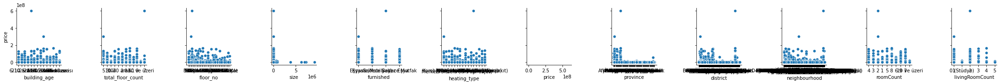

In [65]:
sns.pairplot(
    dataframe,
   x_vars=['building_age', 'total_floor_count', 'floor_no', 'size', 'furnished',
       'heating_type', 'price', 'province', 'district', 'neighbourhood',
       'roomCount', 'livingRoomCount'],y_vars=['price']
)

In [66]:
dataframe.district.unique()

array(['Yenimahalle', 'Kepez', 'Esenler', 'Beylikdüzü', 'Odunpazarı',
       'Tepebaşı', 'Edremit', 'Etimesgut', 'Merkez', 'Karabağlar',
       'Altındağ', 'Melikgazi', 'Mamak', 'Atakum', 'Ümraniye', 'Gölbaşı',
       'Kartal', 'Başakşehir', 'Ataşehir', 'Malkara', 'Esenyurt',
       'Büyükçekmece', 'Bakırköy', 'Avcılar', 'Kuşadası', 'Çukurova',
       'Sultangazi', 'Mudanya', 'Derince', 'Yıldırım', 'Manavgat',
       'Tuzla', 'Çorlu', 'Şile', 'Narlıdere', 'Erdemli', 'Didim',
       'Torbalı', 'Onikişubat', 'Ortahisar', 'Karaköprü', 'Şehzadeler',
       'Nilüfer', 'Biga', 'Buca', 'Sancaktepe', 'Seyhan', 'İzmit',
       'Elmadağ', 'Küçükçekmece', 'Çekmeköy', 'Nazilli', 'Pendik',
       'Keçiören', 'Üsküdar', 'Selçuklu', 'Bahçelievler', 'Kozan',
       'Güzelbahçe', 'Fatih', 'Talas', 'Muratpaşa', 'Menderes', 'Efeler',
       'Mezitli', 'Pamukkale', 'Silivri', 'Menemen', 'Battalgazi',
       'Şişli', 'Ereğli', 'Gaziosmanpaşa', 'Akşehir', 'Güngören',
       'Şahinbey', 'Körfez', 'Orhangazi'

In [67]:
dataframe.neighbourhood.unique()

array(['Burç', 'Kütükçü', 'Kazım Karabekir', ..., 'Bayırköy Bld. (Fatih)',
       'Erkilet Zade', 'Kahvelipınar'], dtype=object)

In [68]:
dataframe.floor_no.unique()

array(['1', '7', '3', '2', 'Kot 1', 'Müstakil', 'Bahçe katı', '4',
       'Yüksek Giriş', 'Bodrum Kat', '5', '13', '8', '20 ve üzeri', '14',
       '11', '9', 'Kot 3', 'Giriş Katı', 'Kot 2', '18', 'En Üst Kat', '6',
       'Asma Kat', '10', '15', 'Çatı Katı', 'Zemin Kat', 'Kot 4', '17',
       '12', '16', 'Teras Kat', '19', 'Komple'], dtype=object)

In [69]:
dataframe.shape

(195010, 13)

In [70]:
dataframe

,building_age,total_floor_count,floor_no,size,furnished,heating_type,price,differenceOfDates,province,district,neighbourhood,roomCount,livingRoomCount
1,0,5,1,175.0,Eşyasız,Kombi (Doğalgaz),209500.0,0 days,Ankara,Yenimahalle,Burç,4,1
2,0,3,1,125.0,Eşyasız,Klima,210000.0,0 days,Antalya,Kepez,Kütükçü,3,1
3,0,10,7,72.0,Eşyasız,Klima,285000.0,0 days,İstanbul,Esenler,Kazım Karabekir,2,1
4,0,4,3,75.0,Eşyasız,Kombi (Doğalgaz),139000.0,0 days,İstanbul,Beylikdüzü,Yakuplu,1,1
5,0,3,2,98.0,Eşyalı (Mobilyalı),Kombi (Doğalgaz),165000.0,0 days,Eskişehir,Odunpazarı,Orhangazi,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
199303,0,5,3,130.0,Eşyasız,Kombi (Doğalgaz),280000.0,282 days,Tekirdağ,Çorlu,Reşadiye,3,1
199304,6-10 arası,3,Kot 3,240.0,Eşyasız,Klima,295000.0,297 days,İzmir,Torbalı,Fevzi Çakmak,3,1
199305,0,10-20 arası,7,170.0,Eşyasız,Merkezi Sistem,600000.0,90 days,Mersin,Yenişehir,50. Yıl,3,1
199306,0,6,1,105.0,Eşyasız,Kombi (Doğalgaz),120500.0,5 days,Tekirdağ,Çerkezköy,Kızılpınar,2,1


In [71]:
dataframe.isnull().sum()

building_age          0
total_floor_count     0
floor_no              0
size                  0
furnished             0
heating_type          0
price                 0
differenceOfDates     0
province              0
district              0
neighbourhood         4
roomCount             0
livingRoomCount      24
dtype: int64

In [72]:
dataframe[pd.isnull(dataframe["livingRoomCount"]) ] 

,building_age,total_floor_count,floor_no,size,furnished,heating_type,price,differenceOfDates,province,district,neighbourhood,roomCount,livingRoomCount
446,11-15 arası,7,17,146.0,Sadece Mutfak,Yok,464462.46,0 days,Ankara,Elmadağ,Hasanoğlan Havuzbaşı,10 ve üzeri,None
570,3,5,Giriş Katı,620743.0,Eşyasız,Fancoil,17619773.60,0 days,İstanbul,Sarıyer,Zekeriyaköy,10 ve üzeri,None
2639,0,4,Komple,230.0,Eşyasız,Kombi (Doğalgaz),1600000.00,30 days,Ankara,Keçiören,Uyanış,10 ve üzeri,None
3576,2,5,1,300.0,Eşyasız,Kombi (Doğalgaz),1650000.00,30 days,Ankara,Keçiören,Uyanış,10 ve üzeri,None
20753,16-20 arası,8,Kot 4,250.0,Eşyasız,Kat Kaloriferi,14660800.00,9 days,İstanbul,Avcılar,Cihangir,10 ve üzeri,None
37267,11-15 arası,4,Zemin Kat,370.0,Eşyasız,Klima,770000.00,30 days,Mersin,Yenişehir,Gazi,10 ve üzeri,None
59152,0,10-20 arası,Komple,1130.0,Eşyasız,Kombi (Doğalgaz),15000000.00,20 days,Manisa,Turgutlu,Selvilitepe,10 ve üzeri,None
66217,0,4,3,95.0,Eşyasız,Klima,300000.00,123 days,Antalya,Konyaaltı,Sarısu,10 ve üzeri,None
67218,0,4,2,600.0,Sadece Mutfak,Kombi (Doğalgaz),750000.00,41 days,Denizli,Merkezefendi,Gümüşçay,10 ve üzeri,None
72386,2,4,4,300.0,Eşyasız,Soba (Kömür),290000.00,5 days,Kayseri,Melikgazi,Selçuklu,10 ve üzeri,None


In [73]:
dataframe.dropna?

In [74]:
dataframe.dropna(inplace=True)
dataframe

,building_age,total_floor_count,floor_no,size,furnished,heating_type,price,differenceOfDates,province,district,neighbourhood,roomCount,livingRoomCount
1,0,5,1,175.0,Eşyasız,Kombi (Doğalgaz),209500.0,0 days,Ankara,Yenimahalle,Burç,4,1
2,0,3,1,125.0,Eşyasız,Klima,210000.0,0 days,Antalya,Kepez,Kütükçü,3,1
3,0,10,7,72.0,Eşyasız,Klima,285000.0,0 days,İstanbul,Esenler,Kazım Karabekir,2,1
4,0,4,3,75.0,Eşyasız,Kombi (Doğalgaz),139000.0,0 days,İstanbul,Beylikdüzü,Yakuplu,1,1
5,0,3,2,98.0,Eşyalı (Mobilyalı),Kombi (Doğalgaz),165000.0,0 days,Eskişehir,Odunpazarı,Orhangazi,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
199303,0,5,3,130.0,Eşyasız,Kombi (Doğalgaz),280000.0,282 days,Tekirdağ,Çorlu,Reşadiye,3,1
199304,6-10 arası,3,Kot 3,240.0,Eşyasız,Klima,295000.0,297 days,İzmir,Torbalı,Fevzi Çakmak,3,1
199305,0,10-20 arası,7,170.0,Eşyasız,Merkezi Sistem,600000.0,90 days,Mersin,Yenişehir,50. Yıl,3,1
199306,0,6,1,105.0,Eşyasız,Kombi (Doğalgaz),120500.0,5 days,Tekirdağ,Çerkezköy,Kızılpınar,2,1


In [75]:
dataframe

,building_age,total_floor_count,floor_no,size,furnished,heating_type,price,differenceOfDates,province,district,neighbourhood,roomCount,livingRoomCount
1,0,5,1,175.0,Eşyasız,Kombi (Doğalgaz),209500.0,0 days,Ankara,Yenimahalle,Burç,4,1
2,0,3,1,125.0,Eşyasız,Klima,210000.0,0 days,Antalya,Kepez,Kütükçü,3,1
3,0,10,7,72.0,Eşyasız,Klima,285000.0,0 days,İstanbul,Esenler,Kazım Karabekir,2,1
4,0,4,3,75.0,Eşyasız,Kombi (Doğalgaz),139000.0,0 days,İstanbul,Beylikdüzü,Yakuplu,1,1
5,0,3,2,98.0,Eşyalı (Mobilyalı),Kombi (Doğalgaz),165000.0,0 days,Eskişehir,Odunpazarı,Orhangazi,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
199303,0,5,3,130.0,Eşyasız,Kombi (Doğalgaz),280000.0,282 days,Tekirdağ,Çorlu,Reşadiye,3,1
199304,6-10 arası,3,Kot 3,240.0,Eşyasız,Klima,295000.0,297 days,İzmir,Torbalı,Fevzi Çakmak,3,1
199305,0,10-20 arası,7,170.0,Eşyasız,Merkezi Sistem,600000.0,90 days,Mersin,Yenişehir,50. Yıl,3,1
199306,0,6,1,105.0,Eşyasız,Kombi (Doğalgaz),120500.0,5 days,Tekirdağ,Çerkezköy,Kızılpınar,2,1


In [76]:
dataframe.loc[dataframe.duplicated()]

,building_age,total_floor_count,floor_no,size,furnished,heating_type,price,differenceOfDates,province,district,neighbourhood,roomCount,livingRoomCount


In [77]:
for i in dataframe.columns:
    print(dataframe[dataframe[i] == ''].index)
    

Int64Index([], dtype='int64')
Int64Index([], dtype='int64')
Int64Index([], dtype='int64')
Int64Index([], dtype='int64')
Int64Index([], dtype='int64')
Int64Index([], dtype='int64')
Int64Index([], dtype='int64')
Int64Index([], dtype='int64')
Int64Index([], dtype='int64')
Int64Index([], dtype='int64')
Int64Index([], dtype='int64')
Int64Index([], dtype='int64')
Int64Index([], dtype='int64')


In [78]:
dataframe["differenceOfDates"] = dataframe["differenceOfDates"].astype(str).str.replace(" days", "")


In [79]:
dataframe

,building_age,total_floor_count,floor_no,size,furnished,heating_type,price,differenceOfDates,province,district,neighbourhood,roomCount,livingRoomCount
1,0,5,1,175.0,Eşyasız,Kombi (Doğalgaz),209500.0,0,Ankara,Yenimahalle,Burç,4,1
2,0,3,1,125.0,Eşyasız,Klima,210000.0,0,Antalya,Kepez,Kütükçü,3,1
3,0,10,7,72.0,Eşyasız,Klima,285000.0,0,İstanbul,Esenler,Kazım Karabekir,2,1
4,0,4,3,75.0,Eşyasız,Kombi (Doğalgaz),139000.0,0,İstanbul,Beylikdüzü,Yakuplu,1,1
5,0,3,2,98.0,Eşyalı (Mobilyalı),Kombi (Doğalgaz),165000.0,0,Eskişehir,Odunpazarı,Orhangazi,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
199303,0,5,3,130.0,Eşyasız,Kombi (Doğalgaz),280000.0,282,Tekirdağ,Çorlu,Reşadiye,3,1
199304,6-10 arası,3,Kot 3,240.0,Eşyasız,Klima,295000.0,297,İzmir,Torbalı,Fevzi Çakmak,3,1
199305,0,10-20 arası,7,170.0,Eşyasız,Merkezi Sistem,600000.0,90,Mersin,Yenişehir,50. Yıl,3,1
199306,0,6,1,105.0,Eşyasız,Kombi (Doğalgaz),120500.0,5,Tekirdağ,Çerkezköy,Kızılpınar,2,1


In [80]:
dataframe.drop(columns=["district","neighbourhood"],inplace=True)

In [81]:
cityCodes = {
"Adana"	        : "01",
"Adıyaman"	    : "02",
"Afyonkarahisar"	        : "03",
"Ağrı"	        : "04",
"Amasya"	    : "05",
"Ankara"	    : "06",
"Antalya"	    : "07",
"Artvin"	    : "08",
"Aydın"	        : "09",
"Balıkesir"	    : "10",
"Bilecik"	    : "11",
"Bingöl"	    : "12",
"Bitlis"	    : "13",
"Bolu"	        : "14",
"Burdur"	    : "15",
"Bursa"	        : "16",
"Çanakkale"	    : "17",
"Çankırı"	    : "18",
"Çorum"	        : "19",
"Denizli"	    : "20",
"Diyarbakır"	: "21",
"Edirne"	    : "22",
"Elazığ"	    : "23",
"Erzincan"	    : "24",
"Erzurum"	    : "25",
"Eskişehir"	    : "26",
"Gaziantep"	    : "27",
"Giresun"	    : "28",
"Gümüşhane"	    : "29",
"Hakkari"	    : "30",
"Hatay"	        : "31",
"Isparta"	    : "32",
"Mersin"	        : "33",
"İstanbul"	    : "34",
"İzmir"	        : "35",
"Kars"	        : "36",
"Kastamonu"	    : "37",
"Kayseri"	    : "38",
"Kırklareli"	: "39",
"Kırşehir"	    : "40",
"Kocaeli"	    : "41",
"Konya"	        : "42",
"Kütahya"	    : "43",
"Malatya"	    : "44",
"Manisa"	    : "45",
"Kahramanmaraş"	: "46",
"Mardin"	    : "47",
"Muğla"	        : "48",
"Muş"	        : "49",
"Nevşehir"	    : "50",
"Niğde"	        : "51",
"Ordu"	        : "52",
"Rize"	        : "53",
"Sakarya"	    : "54",
"Samsun"	    : "55",
"Siirt"	        : "56",
"Sinop"	        : "57",
"Sivas"	        : "58",
"Tekirdağ"	    : "59",
"Tokat"	        : "60",
"Trabzon"	    : "61",
"Tunceli"	    : "62",
"Şanlıurfa"	    : "63",
"Uşak"	        : "64",
"Van"	        : "65",
"Yozgat"	    : "66",
"Zonguldak"	    : "67",
"Aksaray"	    : "68",
"Bayburt"	    : "69",
"Karaman"	    : "70",
"Kırıkkale"	    : "71",
"Batman"	    : "72",
"Şırnak"	    : "73",
"Bartın"	    : "74",
"Ardahan"	    : "75",
"Iğdır"	        : "76",
"Yalova"	    : "77",
"Karabük"	    : "78",
"Kilis"	        : "79",
"Osmaniye"	    : "80",
"Düzce"	        : "81",
"KKTC":"82"
}

In [82]:

dataframe.province = dataframe.province.replace(cityCodes)
dataframe

,building_age,total_floor_count,floor_no,size,furnished,heating_type,price,differenceOfDates,province,roomCount,livingRoomCount
1,0,5,1,175.0,Eşyasız,Kombi (Doğalgaz),209500.0,0,06,4,1
2,0,3,1,125.0,Eşyasız,Klima,210000.0,0,07,3,1
3,0,10,7,72.0,Eşyasız,Klima,285000.0,0,34,2,1
4,0,4,3,75.0,Eşyasız,Kombi (Doğalgaz),139000.0,0,34,1,1
5,0,3,2,98.0,Eşyalı (Mobilyalı),Kombi (Doğalgaz),165000.0,0,26,2,1
...,...,...,...,...,...,...,...,...,...,...,...
199303,0,5,3,130.0,Eşyasız,Kombi (Doğalgaz),280000.0,282,59,3,1
199304,6-10 arası,3,Kot 3,240.0,Eşyasız,Klima,295000.0,297,35,3,1
199305,0,10-20 arası,7,170.0,Eşyasız,Merkezi Sistem,600000.0,90,33,3,1
199306,0,6,1,105.0,Eşyasız,Kombi (Doğalgaz),120500.0,5,59,2,1


In [83]:
floorNo = {
"Zemin Kat" : "21",
"Kot 1" : "22",
"Kot 2" : "23",
"Kot 3" : "24",
"Kot 4" : "25",
"Bodrum Kat" : "26",
"Bahçe katı" : "27",
"Giriş Katı" : "28",
"Yüksek Giriş" : "29",
"Asma Kat" : "30",
"En Üst Kat" : "31",
"Çatı Katı" : "32",
"Teras Kat" : "33",
"Komple" : "34",
"Müstakil" : "35",
"20 ve üzeri" : "36"
}

In [84]:
dataframe.floor_no = dataframe.floor_no.replace(floorNo)

In [85]:
one_hot_encoded_data = pd.get_dummies(dataframe, columns = ['furnished', 'heating_type'])
one_hot_encoded_data

,building_age,total_floor_count,floor_no,size,price,differenceOfDates,province,roomCount,livingRoomCount,furnished_Eşyalı (Mobilyalı),...,heating_type_Kat Kaloriferi,heating_type_Klima,heating_type_Kombi (Doğalgaz),heating_type_Kombi (Elektrikli),heating_type_Merkezi Sistem,heating_type_Merkezi Sistem (Isı Payı Ölçer),heating_type_Soba (Doğalgaz),heating_type_Soba (Kömür),heating_type_Yerden Isıtma,heating_type_Yok
1,0,5,1,175.0,209500.0,0,06,4,1,0,...,0,0,1,0,0,0,0,0,0,0
2,0,3,1,125.0,210000.0,0,07,3,1,0,...,0,1,0,0,0,0,0,0,0,0
3,0,10,7,72.0,285000.0,0,34,2,1,0,...,0,1,0,0,0,0,0,0,0,0
4,0,4,3,75.0,139000.0,0,34,1,1,0,...,0,0,1,0,0,0,0,0,0,0
5,0,3,2,98.0,165000.0,0,26,2,1,1,...,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199303,0,5,3,130.0,280000.0,282,59,3,1,0,...,0,0,1,0,0,0,0,0,0,0
199304,6-10 arası,3,24,240.0,295000.0,297,35,3,1,0,...,0,1,0,0,0,0,0,0,0,0
199305,0,10-20 arası,7,170.0,600000.0,90,33,3,1,0,...,0,0,0,0,1,0,0,0,0,0
199306,0,6,1,105.0,120500.0,5,59,2,1,0,...,0,0,1,0,0,0,0,0,0,0


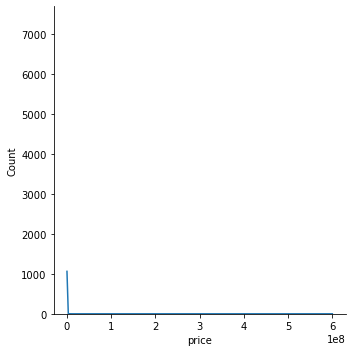

In [86]:
import seaborn as sns
sns.displot(data=one_hot_encoded_data, x="price", kde=True)

In [87]:
one_hot_encoded_data[one_hot_encoded_data["building_age"].str.contains("arası")]

,building_age,total_floor_count,floor_no,size,price,differenceOfDates,province,roomCount,livingRoomCount,furnished_Eşyalı (Mobilyalı),...,heating_type_Kat Kaloriferi,heating_type_Klima,heating_type_Kombi (Doğalgaz),heating_type_Kombi (Elektrikli),heating_type_Merkezi Sistem,heating_type_Merkezi Sistem (Isı Payı Ölçer),heating_type_Soba (Doğalgaz),heating_type_Soba (Kömür),heating_type_Yerden Isıtma,heating_type_Yok
7,6-10 arası,3,35,325.0,750000.0,0,26,5,1,1,...,0,0,1,0,0,0,0,0,0,0
8,6-10 arası,4,3,120.0,485000.0,0,34,3,1,0,...,0,0,1,0,0,0,0,0,0,0
12,21-25 arası,4,29,105.0,245000.0,0,34,3,1,0,...,0,0,1,0,0,0,0,0,0,0
21,21-25 arası,5,27,105.0,155000.0,0,34,3,1,0,...,0,0,1,0,0,0,0,0,0,0
24,21-25 arası,4,2,105.0,235000.0,0,34,2,1,0,...,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199298,6-10 arası,5,1,2000.0,4851000.0,239,34,3,1,0,...,0,0,1,0,0,0,0,0,0,0
199299,6-10 arası,5,3,150.0,215000.0,285,59,3,1,0,...,0,0,1,0,0,0,0,0,0,0
199300,26-30 arası,5,4,125.0,430000.0,124,34,3,1,0,...,0,0,1,0,0,0,0,0,0,0
199302,31-35 arası,5,2,110.0,380000.0,258,34,3,1,0,...,0,0,1,0,0,0,0,0,0,0


In [88]:

one_hot_encoded_data["building_age"] = np.where((one_hot_encoded_data["building_age"].str.contains('arası')),one_hot_encoded_data["building_age"].str.replace(' arası',''),one_hot_encoded_data.building_age)

In [89]:
one_hot_encoded_data["livingRoomCount"] = np.where((one_hot_encoded_data["livingRoomCount"].str.contains('Stüdyo')),one_hot_encoded_data["building_age"].str.replace(' (Stüdyo)',''),one_hot_encoded_data.livingRoomCount)

<ipython-input-89-c340174e0756>:1: FutureWarning: The default value of regex will change from True to False in a future version.
  one_hot_encoded_data["livingRoomCount"] = np.where((one_hot_encoded_data["livingRoomCount"].str.contains('Stüdyo')),one_hot_encoded_data["building_age"].str.replace(' (Stüdyo)',''),one_hot_encoded_data.livingRoomCount)


In [90]:
one_hot_encoded_data.livingRoomCount.unique()

array(['1', '5', '2', '3', '0', '16-20', '4', '6-10', '21-25', '26-30',
       '11-15', '31-35', '40 ve üzeri'], dtype=object)

In [91]:
oneCp = one_hot_encoded_data.copy()

In [92]:
one_hot_encoded_data["livingRoomCount"] = np.where((one_hot_encoded_data["livingRoomCount"].str.contains('-')),one_hot_encoded_data["livingRoomCount"].str.strip().str[-2:],one_hot_encoded_data.livingRoomCount)
one_hot_encoded_data["livingRoomCount"] = np.where((one_hot_encoded_data["livingRoomCount"].str.contains('üzeri')),one_hot_encoded_data["livingRoomCount"].str.replace(' ve üzeri',''),one_hot_encoded_data.livingRoomCount)

In [93]:
one_hot_encoded_data["building_age"] = np.where((one_hot_encoded_data["building_age"].str.contains('üzeri')),one_hot_encoded_data["building_age"].str.replace(' ve üzeri',''),one_hot_encoded_data.building_age)

In [94]:
one_hot_encoded_data["building_age"] = np.where((one_hot_encoded_data["building_age"].str.contains('-')),one_hot_encoded_data["building_age"].str.strip().str[-2:],one_hot_encoded_data.building_age)

In [95]:
one_hot_encoded_data["total_floor_count"] = np.where((one_hot_encoded_data["total_floor_count"].str.contains('arası')),one_hot_encoded_data["total_floor_count"].str.replace(' arası',''),one_hot_encoded_data.total_floor_count)
one_hot_encoded_data["total_floor_count"] = np.where((one_hot_encoded_data["total_floor_count"].str.contains('-')),one_hot_encoded_data["total_floor_count"].str.strip().str[-2:],one_hot_encoded_data.total_floor_count)

In [96]:
one_hot_encoded_data["total_floor_count"] = np.where((one_hot_encoded_data["total_floor_count"].str.contains('üzeri')),one_hot_encoded_data["building_age"].str.replace(' ve üzeri',''),one_hot_encoded_data.total_floor_count)

In [97]:
one_hot_encoded_data.building_age.unique()

array(['0', '10', '25', '2', '1', '4', '30', '15', '20', '5', '3', '35',
       '40'], dtype=object)

In [98]:
one_hot_encoded_data.total_floor_count.unique()

array(['5', '3', '10', '4', '20', '2', '8', '6', '1', '9', '0', '7', '15',
       '35', '40', '30', '25'], dtype=object)

In [99]:
one_hot_encoded_data.describe()

,size,price,furnished_Eşyalı (Mobilyalı),furnished_Eşyasız,furnished_Sadece Beyaz Eşya,furnished_Sadece Mutfak,heating_type_Fancoil,heating_type_Güneş Enerjisi,heating_type_Jeotermal,heating_type_Kalorifer (Akaryakıt),...,heating_type_Kat Kaloriferi,heating_type_Klima,heating_type_Kombi (Doğalgaz),heating_type_Kombi (Elektrikli),heating_type_Merkezi Sistem,heating_type_Merkezi Sistem (Isı Payı Ölçer),heating_type_Soba (Doğalgaz),heating_type_Soba (Kömür),heating_type_Yerden Isıtma,heating_type_Yok
count,1.949820e+05,1.949820e+05,194982.000000,194982.000000,194982.000000,194982.000000,194982.000000,194982.000000,194982.000000,194982.000000,...,194982.000000,194982.000000,194982.000000,194982.000000,194982.000000,194982.000000,194982.000000,194982.000000,194982.000000,194982.000000
mean,4.577689e+02,3.805421e+05,0.053343,0.872496,0.027628,0.046533,0.000574,0.003277,0.003149,0.000549,...,0.013904,0.139921,0.629966,0.003005,0.060231,0.072284,0.003990,0.013463,0.014771,0.013878
std,3.592753e+04,2.412516e+06,0.224718,0.333538,0.163905,0.210636,0.023960,0.057153,0.056028,0.023419,...,0.117092,0.346906,0.482815,0.054739,0.237915,0.258958,0.063041,0.115246,0.120634,0.116986
min,1.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,9.000000e+01,1.700000e+05,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.200000e+02,2.380000e+05,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.500000e+02,3.400000e+05,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,9.262737e+06,6.005578e+08,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


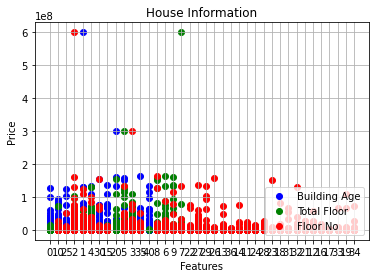

In [100]:
plt.scatter(one_hot_encoded_data.building_age, dataframe.price, color='blue', label="Building Age")
plt.scatter(one_hot_encoded_data.total_floor_count, dataframe.price, color='green', label='Total Floor')
plt.scatter(one_hot_encoded_data.floor_no, dataframe.price, color='red', label='Floor No')

plt.legend(loc="lower right")
plt.title("House Information")
plt.xlabel("Features")
plt.ylabel("Price")
plt.grid()
plt.show()

<AxesSubplot:xlabel='building_age', ylabel='price'>

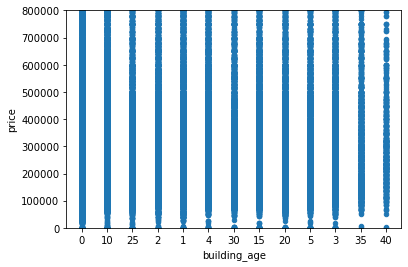

In [101]:

data = pd.concat([dataframe.price, one_hot_encoded_data["building_age"]], axis=1)
data.plot.scatter(x="building_age", y='price', ylim=(0,800000))

<AxesSubplot:xlabel='total_floor_count', ylabel='price'>

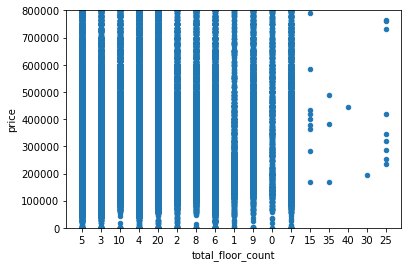

In [102]:

data = pd.concat([dataframe.price, one_hot_encoded_data["total_floor_count"]], axis=1)
data.plot.scatter(x="total_floor_count", y='price', ylim=(0,800000))

<AxesSubplot:xlabel='province', ylabel='price'>

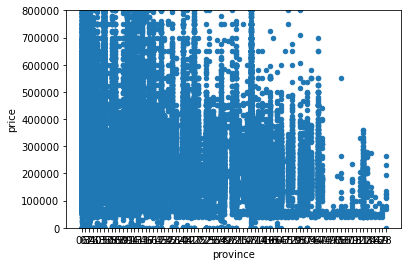

In [103]:
data = pd.concat([one_hot_encoded_data["province"],dataframe.price], axis=1)
data.plot.scatter(x="province", y='price', ylim=(0,800000))

<AxesSubplot:xlabel='size', ylabel='price'>

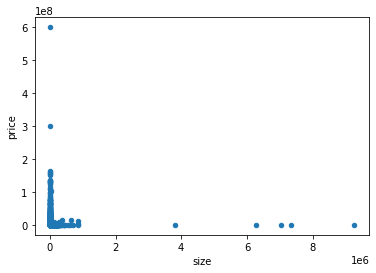

In [104]:
data = pd.concat([one_hot_encoded_data["size"],dataframe.price], axis=1)
data.plot.scatter(x="size", y='price')

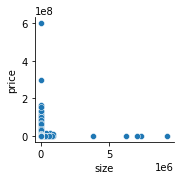

In [105]:
sns.pairplot(
    dataframe,
   x_vars=['size'],y_vars=['price']
)

<AxesSubplot:xlabel='livingRoomCount', ylabel='price'>

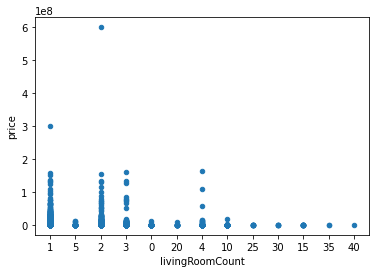

In [106]:
	
data = pd.concat([one_hot_encoded_data["livingRoomCount"],dataframe.price], axis=1)
data.plot.scatter(x="livingRoomCount", y='price')

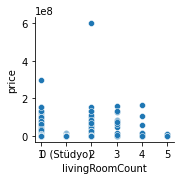

In [107]:
sns.pairplot(
    dataframe,
   x_vars=['livingRoomCount'],y_vars=['price']
)

<AxesSubplot:xlabel='floor_no', ylabel='price'>

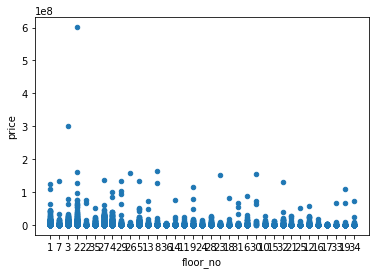

In [108]:

data = pd.concat([one_hot_encoded_data["floor_no"],dataframe.price], axis=1)
data.plot.scatter(x="floor_no", y='price')

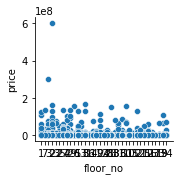

In [109]:
sns.pairplot(
    dataframe,
   x_vars=['floor_no'],y_vars=['price']
)

<AxesSubplot:xlabel='roomCount', ylabel='price'>

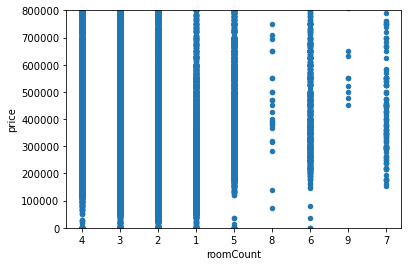

In [110]:

data = pd.concat([one_hot_encoded_data["roomCount"],dataframe.price], axis=1)
data.plot.scatter(x="roomCount", y='price', ylim=(0,800000))

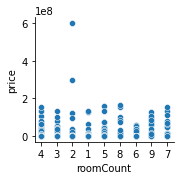

In [111]:
sns.pairplot(
    dataframe,
   x_vars=['roomCount'],y_vars=['price']
)

<AxesSubplot:xlabel='furnished_Eşyalı (Mobilyalı)', ylabel='price'>

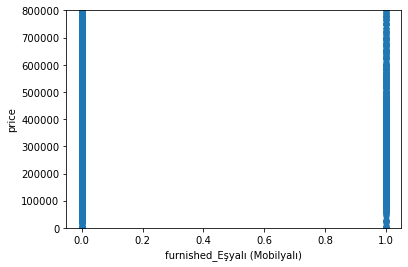

In [112]:

data = pd.concat([one_hot_encoded_data["furnished_Eşyalı (Mobilyalı)"],dataframe.price], axis=1)
data.plot.scatter(x="furnished_Eşyalı (Mobilyalı)", y='price', ylim=(0,800000))

In [113]:
one_hot_encoded_data["price"].astype(int).mean()

380542.10041439725

In [114]:
one_hot_encoded_data["price"].astype(int).min()

0

In [115]:
one_hot_encoded_data["price"].astype(int).unique()

array([   209500,    210000,    285000, ...,   1089460, 152338318,
           22000])

In [116]:
one_hot_encoded_data['price'].nlargest(20000)


169898    600557822.0
55104     300000000.0
196346    164957479.2
149324    160449408.4
49784     156836029.6
             ...     
122710       500000.0
123174       500000.0
123470       500000.0
124929       500000.0
125364       500000.0
Name: price, Length: 20000, dtype: float64

In [117]:
one_hot_encoded_data["size"].astype(int).max()

9262737

In [118]:
one_hot_encoded_data["size"].astype(int).min()

1

In [119]:
one_hot_encoded_data["size"].astype(int).mean()

457.7689479028833

In [120]:
one_hot_encoded_data.drop(one_hot_encoded_data[one_hot_encoded_data['price'] > 4000000].index, inplace = True)

In [121]:
one_hot_encoded_data.drop(one_hot_encoded_data[one_hot_encoded_data['size'] > 550].index, inplace = True)

In [122]:
one_hot_encoded_data.drop(one_hot_encoded_data[one_hot_encoded_data['size'] < 25].index, inplace = True)

In [123]:
one_hot_encoded_data.drop(one_hot_encoded_data[one_hot_encoded_data['roomCount'].astype(int) > 6].index, inplace = True)

<AxesSubplot:xlabel='size', ylabel='price'>

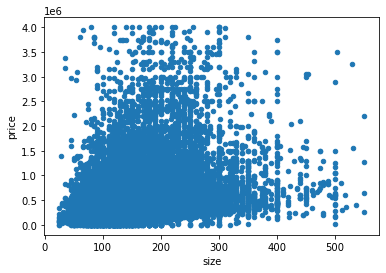

In [124]:
data = pd.concat([one_hot_encoded_data["size"],dataframe.price], axis=1)
data.plot.scatter(x="size", y='price')

In [125]:
one_hot_encoded_data["size"].unique()

array([175., 125.,  72.,  75.,  98.,  95., 325., 120.,  85., 177., 122.,
       105.,  97., 135., 150., 210., 145., 159., 110., 140.,  80., 112.,
        90., 165.,  70., 130., 115., 132., 160., 123., 170., 100.,  40.,
       256.,  55., 185., 180., 155.,  65., 200.,  74.,  42.,  62.,  68.,
        60., 215., 240., 108., 220.,  50., 143., 270., 190., 127., 148.,
       138., 300., 260., 107., 241., 133., 245., 171., 250.,  84., 152.,
        82., 203., 500., 126., 195.,  87., 280., 153., 103., 285.,  51.,
        57., 460.,  96., 111., 101., 154., 230., 225., 168., 205., 128.,
       335., 167.,  45., 174., 265.,  73.,  99., 178., 136., 151., 259.,
       106., 198., 213., 118., 134., 360., 149., 163.,  83., 188., 233.,
       350.,  81., 158., 116.,  64., 197., 147.,  53., 157.,  54., 320.,
        88.,  56., 176., 164.,  67., 252.,  86., 227., 290., 186., 146.,
        71., 182., 137., 192.,  48., 334., 218.,  61., 221., 121.,  78.,
       162.,  94., 131.,  63., 144.,  92., 113.,  7

In [126]:
#According to the graphs features are selected firstly size,province and furnished
#Features -> 
X= one_hot_encoded_data[["size","province","furnished_Eşyalı (Mobilyalı)"]]
X

,size,province,furnished_Eşyalı (Mobilyalı)
1,175.0,06,0
2,125.0,07,0
3,72.0,34,0
4,75.0,34,0
5,98.0,26,1
...,...,...,...
199303,130.0,59,0
199304,240.0,35,0
199305,170.0,33,0
199306,105.0,59,0


In [127]:
Y = one_hot_encoded_data["price"]
#one_hot_encoded_data.drop("price",axis=1,inplace=True)
#one_hot_encoded_data

In [128]:
from sklearn.model_selection import train_test_split

In [129]:
X_train, X_test, Y_train, Y_test = train_test_split(X,Y,test_size=0.3,random_state=0)

In [130]:
X_train

,size,province,furnished_Eşyalı (Mobilyalı)
143765,90.0,10,0
3575,90.0,34,0
118487,130.0,45,0
51553,145.0,07,0
126532,110.0,06,0
...,...,...,...
157145,140.0,06,0
182425,140.0,35,0
121884,55.0,34,0
179108,60.0,09,0


In [131]:
X_test

,size,province,furnished_Eşyalı (Mobilyalı)
166460,185.0,01,0
51517,105.0,50,0
121983,55.0,35,0
106190,140.0,59,0
21864,85.0,34,0
...,...,...,...
52273,150.0,20,0
106223,60.0,07,0
116819,105.0,06,0
83650,160.0,07,0


In [132]:
Y_train

143765    120000.0
3575      127000.0
118487    200000.0
51553     275000.0
126532    205000.0
            ...   
157145    169000.0
182425    390000.0
121884    165000.0
179108    159000.0
45177     295000.0
Name: price, Length: 135462, dtype: float64

In [133]:
from sklearn.preprocessing import StandardScaler

In [134]:
myScaler = StandardScaler()

In [135]:
scaled_x_train = myScaler.fit_transform(X_train)

In [136]:
scaled_x_test= myScaler.transform(X_test)

In [137]:
from sklearn.linear_model import LinearRegression


In [138]:
model = LinearRegression()

In [139]:
model.fit(scaled_x_train,Y_train)

LinearRegression()

In [140]:
model.coef_ #coeffients of the model


array([102955.11299122,   -949.79394484,   7483.08906719])

In [141]:
model.intercept_

298503.7426986165

In [142]:
y_predict = model.predict(scaled_x_test)

In [143]:
y_predict[len(y_predict)-1]


339713.9081905226

In [144]:
#print the predicted and actual values of the data in the test set

for i in range(len(y_predict)):
    print("Predicted value:", y_predict[i]," Actual value:",Y_test.values[i])

Predicted value: 431751.65674781305  Actual value: 360000.0
Predicted value: 251254.0233401268  Actual value: 60000.0
Predicted value: 140879.4208428164  Actual value: 160000.0
Predicted value: 328596.3465145178  Actual value: 149000.0
Predicted value: 207638.19184969438  Actual value: 220000.0
Predicted value: 217634.33355786654  Actual value: 230000.0
Predicted value: 207584.7908988452  Actual value: 300000.0
Predicted value: 195078.8045007619  Actual value: 693000.0
Predicted value: 263973.6135416068  Actual value: 165000.0
Predicted value: 263226.0002297184  Actual value: 210000.0
Predicted value: 431751.65674781305  Actual value: 213000.0
Predicted value: 283698.8922037052  Actual value: 430000.0
Predicted value: 275838.7885295  Actual value: 147000.0
Predicted value: 208973.21562092373  Actual value: 170000.0
Predicted value: 218755.7535256992  Actual value: 410000.0
Predicted value: 263226.0002297184  Actual value: 233000.0
Predicted value: 242272.49969808894  Actual value: 7000

Predicted value: 218814.57979614264  Actual value: 145000.0
Predicted value: 420527.2931701099  Actual value: 640000.0
Predicted value: 187626.58083288575  Actual value: 295000.0
Predicted value: 395995.92893158586  Actual value: 188500.0
Predicted value: 176047.73819970273  Actual value: 200000.0
Predicted value: 229873.31520170398  Actual value: 232000.0
Predicted value: 152055.80878926467  Actual value: 140000.0
Predicted value: 308924.46880326857  Actual value: 285000.0
Predicted value: 316837.97342832293  Actual value: 145000.0
Predicted value: 285514.52453257714  Actual value: 122000.0
Predicted value: 241471.48543535132  Actual value: 90000.0
Predicted value: 341048.93196175195  Actual value: 380000.0
Predicted value: 398078.5660147036  Actual value: 700000.0
Predicted value: 309090.09697541036  Actual value: 145000.0
Predicted value: 223202.7781961011  Actual value: 420000.0
Predicted value: 285461.12358172797  Actual value: 219000.0
Predicted value: 320095.4314301225  Actual v

Predicted value: 274343.5619057232  Actual value: 420000.0
Predicted value: 418925.2646446347  Actual value: 230000.0
Predicted value: 364245.2724290467  Actual value: 400000.0
Predicted value: 142267.84556489493  Actual value: 107000.0
Predicted value: 275411.58092270663  Actual value: 225000.0
Predicted value: 350724.6679648291  Actual value: 315000.0
Predicted value: 307749.6478845867  Actual value: 127000.0
Predicted value: 329877.969334898  Actual value: 1095000.0
Predicted value: 296578.68525773275  Actual value: 310000.0
Predicted value: 163167.94514567518  Actual value: 108000.0
Predicted value: 384504.56059963687  Actual value: 325000.0
Predicted value: 253069.6556689987  Actual value: 350000.0
Predicted value: 286956.3502055048  Actual value: 194000.0
Predicted value: 384397.7586979385  Actual value: 150000.0
Predicted value: 251521.02809437265  Actual value: 228000.0
Predicted value: 208919.81467007456  Actual value: 255000.0
Predicted value: 309191.47355751443  Actual value

Predicted value: 407540.698214384  Actual value: 232000.0
Predicted value: 151996.98251882123  Actual value: 185000.0
Predicted value: 263226.0002297184  Actual value: 430000.0
Predicted value: 153332.00629005057  Actual value: 155000.0
Predicted value: 242432.70255063646  Actual value: 169000.0
Predicted value: 186844.8941706125  Actual value: 133000.0
Predicted value: 318813.8086097423  Actual value: 380000.0
Predicted value: 218755.7535256992  Actual value: 140000.0
Predicted value: 531008.6975691186  Actual value: 465000.0
Predicted value: 285461.12358172797  Actual value: 255000.0
Predicted value: 318440.0019537981  Actual value: 260000.0
Predicted value: 418925.2646446347  Actual value: 205000.0
Predicted value: 253550.26422664124  Actual value: 122000.0
Predicted value: 207638.19184969438  Actual value: 150000.0
Predicted value: 419245.6703497297  Actual value: 280000.0
Predicted value: 202181.97443275244  Actual value: 111750.0
Predicted value: 753893.9405977062  Actual value: 

Predicted value: 372585.98466089444  Actual value: 305000.0
Predicted value: 263226.0002297184  Actual value: 205000.0
Predicted value: 331266.3940569765  Actual value: 270000.0
Predicted value: 285300.92072918045  Actual value: 245000.0
Predicted value: 507812.3571018239  Actual value: 360000.0
Predicted value: 179159.73909887532  Actual value: 140000.0
Predicted value: 309191.47355751443  Actual value: 175000.0
Predicted value: 274343.5619057232  Actual value: 162000.0
Predicted value: 196520.63017368957  Actual value: 180000.0
Predicted value: 152856.82305200226  Actual value: 125000.0
Predicted value: 296578.68525773275  Actual value: 205000.0
Predicted value: 285888.33118852135  Actual value: 199000.0
Predicted value: 184335.04948070133  Actual value: 114500.0
Predicted value: 386913.0287074439  Actual value: 620000.0
Predicted value: 249297.5157591717  Actual value: 203000.0
Predicted value: 263653.2078365118  Actual value: 160000.0
Predicted value: 240990.87687770877  Actual val

Predicted value: 218168.3430663583  Actual value: 125000.0
Predicted value: 409516.5333958035  Actual value: 349000.0
Predicted value: 464837.33702158154  Actual value: 260000.0
Predicted value: 207638.19184969438  Actual value: 139000.0
Predicted value: 360099.32586327544  Actual value: 269000.0
Predicted value: 319241.01621653576  Actual value: 330000.0
Predicted value: 373814.20653042546  Actual value: 305000.0
Predicted value: 320095.4314301225  Actual value: 185000.0
Predicted value: 178732.53149208194  Actual value: 275000.0
Predicted value: 396321.7599562752  Actual value: 275000.0
Predicted value: 304744.4488871125  Actual value: 660000.0
Predicted value: 207638.19184969438  Actual value: 267000.0
Predicted value: 176047.73819970273  Actual value: 169000.0
Predicted value: 218755.7535256992  Actual value: 325000.0
Predicted value: 201021.05579494068  Actual value: 159000.0
Predicted value: 296578.68525773275  Actual value: 1250000.0
Predicted value: 238306.0835853296  Actual va

Predicted value: 319775.0257250275  Actual value: 284850.0
Predicted value: 264721.22685349523  Actual value: 198000.0
Predicted value: 220250.98014947603  Actual value: 100000.0
Predicted value: 207050.78139035348  Actual value: 125000.0
Predicted value: 306361.2231625082  Actual value: 238000.0
Predicted value: 620483.2004856488  Actual value: 240000.0
Predicted value: 218755.7535256992  Actual value: 195000.0
Predicted value: 264721.22685349523  Actual value: 120000.0
Predicted value: 286956.3502055048  Actual value: 115000.0
Predicted value: 462220.690429972  Actual value: 390000.0
Predicted value: 252108.43855371355  Actual value: 99000.0
Predicted value: 285461.12358172797  Actual value: 650000.0
Predicted value: 153385.40724089975  Actual value: 155000.0
Predicted value: 431484.6519935672  Actual value: 575000.0
Predicted value: 151676.5768137262  Actual value: 295000.0
Predicted value: 174232.10587083083  Actual value: 95000.0
Predicted value: 253603.66517749045  Actual value: 

Predicted value: 174285.50682168  Actual value: 157000.0
Predicted value: 409516.5333958035  Actual value: 315000.0
Predicted value: 220090.7772969285  Actual value: 255000.0
Predicted value: 230834.5323169891  Actual value: 140000.0
Predicted value: 220037.37634607934  Actual value: 440000.0
Predicted value: 207638.19184969438  Actual value: 310000.0
Predicted value: 352113.09268690756  Actual value: 155000.0
Predicted value: 264507.62305009854  Actual value: 239000.0
Predicted value: 207638.19184969438  Actual value: 287000.0
Predicted value: 307642.84598288836  Actual value: 360000.0
Predicted value: 418925.2646446347  Actual value: 329000.0
Predicted value: 273222.1419378905  Actual value: 175000.0
Predicted value: 286801.57267255156  Actual value: 338999.0
Predicted value: 385305.57486237446  Actual value: 815360.0
Predicted value: 163114.544194826  Actual value: 310000.0
Predicted value: 205414.67951449344  Actual value: 500000.0
Predicted value: 385465.777714922  Actual value: 6

Predicted value: 185403.0684976848  Actual value: 285000.0
Predicted value: 652928.0693492272  Actual value: 300000.0
Predicted value: 552336.0047566922  Actual value: 430000.0
Predicted value: 350244.05940718646  Actual value: 250000.0
Predicted value: 319561.4219216308  Actual value: 305000.0
Predicted value: 285407.7226308788  Actual value: 180000.0
Predicted value: 142267.84556489493  Actual value: 167000.0
Predicted value: 229125.70188981557  Actual value: 113500.0
Predicted value: 264507.62305009854  Actual value: 365000.0
Predicted value: 153385.40724089975  Actual value: 135000.0
Predicted value: 242432.70255063646  Actual value: 148000.0
Predicted value: 420367.0903175624  Actual value: 580000.0
Predicted value: 217687.73450871572  Actual value: 55000.0
Predicted value: 253603.66517749045  Actual value: 169000.0
Predicted value: 307696.24693373754  Actual value: 250000.0
Predicted value: 403093.6735439821  Actual value: 420000.0
Predicted value: 176509.01915688097  Actual valu

Predicted value: 262852.1935737742  Actual value: 160000.0
Predicted value: 506263.72952719784  Actual value: 240000.0
Predicted value: 331373.1959586748  Actual value: 350000.0
Predicted value: 330892.5874010323  Actual value: 239000.0
Predicted value: 240990.87687770877  Actual value: 195000.0
Predicted value: 298073.9118815096  Actual value: 132000.0
Predicted value: 341048.93196175195  Actual value: 180000.0
Predicted value: 207638.19184969438  Actual value: 250000.0
Predicted value: 286956.3502055048  Actual value: 310000.0
Predicted value: 274343.5619057232  Actual value: 430000.0
Predicted value: 218755.7535256992  Actual value: 143000.0
Predicted value: 264726.6521730895  Actual value: 148000.0
Predicted value: 331693.60166376986  Actual value: 218000.0
Predicted value: 296578.68525773275  Actual value: 225000.0
Predicted value: 218755.7535256992  Actual value: 153500.0
Predicted value: 575852.750929082  Actual value: 400000.0
Predicted value: 218755.7535256992  Actual value: 1

Predicted value: 295510.6662407493  Actual value: 155000.0
Predicted value: 452705.1572794424  Actual value: 420000.0
Predicted value: 263973.6135416068  Actual value: 220000.0
Predicted value: 464837.33702158154  Actual value: 400000.0
Predicted value: 220037.37634607934  Actual value: 224500.0
Predicted value: 205341.95096317993  Actual value: 270000.0
Predicted value: 196520.63017368957  Actual value: 129500.0
Predicted value: 229873.31520170398  Actual value: 215000.0
Predicted value: 252108.43855371355  Actual value: 285000.0
Predicted value: 218381.946869755  Actual value: 125000.0
Predicted value: 641970.71052577  Actual value: 255000.0
Predicted value: 307696.24693373754  Actual value: 435000.0
Predicted value: 264721.22685349523  Actual value: 98750.0
Predicted value: 200914.25389324233  Actual value: 210000.0
Predicted value: 253603.66517749045  Actual value: 172500.0
Predicted value: 207638.19184969438  Actual value: 225000.0
Predicted value: 485363.62994641764  Actual value

Predicted value: 129868.66106850997  Actual value: 125000.0
Predicted value: 418284.4532344446  Actual value: 188000.0
Predicted value: 196520.63017368957  Actual value: 335000.0
Predicted value: 231368.54182548085  Actual value: 147000.0
Predicted value: 398398.97171979863  Actual value: 330000.0
Predicted value: 296578.68525773275  Actual value: 357000.0
Predicted value: 341048.93196175195  Actual value: 390000.0
Predicted value: 129815.2601176608  Actual value: 190000.0
Predicted value: 307108.83647439664  Actual value: 280000.0
Predicted value: 431484.6519935672  Actual value: 299000.0
Predicted value: 369527.38471257105  Actual value: 215000.0
Predicted value: 464677.134169034  Actual value: 280000.0
Predicted value: 273756.1514463823  Actual value: 200000.0
Predicted value: 198021.28211706073  Actual value: 340000.0
Predicted value: 331426.596909524  Actual value: 315000.0
Predicted value: 196520.63017368957  Actual value: 145000.0
Predicted value: 205341.95096317993  Actual valu

Predicted value: 309191.47355751443  Actual value: 340000.0
Predicted value: 230300.52280849736  Actual value: 150000.0
Predicted value: 387014.405289548  Actual value: 315000.0
Predicted value: 307749.6478845867  Actual value: 185000.0
Predicted value: 318653.6057571948  Actual value: 240000.0
Predicted value: 301025.7099281347  Actual value: 290000.0
Predicted value: 185403.0684976848  Actual value: 212000.0
Predicted value: 240937.4759268596  Actual value: 520000.0
Predicted value: 147603.3587992685  Actual value: 218000.0
Predicted value: 178732.53149208194  Actual value: 230000.0
Predicted value: 218755.7535256992  Actual value: 105000.0
Predicted value: 395889.1270298875  Actual value: 400000.0
Predicted value: 275838.7885295  Actual value: 240000.0
Predicted value: 376110.4474169399  Actual value: 180000.0
Predicted value: 320255.63428267004  Actual value: 220000.0
Predicted value: 229873.31520170398  Actual value: 180000.0
Predicted value: 231154.93802208416  Actual value: 2150

Predicted value: 333116.09973623324  Actual value: 345000.0
Predicted value: 253443.4623249429  Actual value: 165000.0
Predicted value: 218755.7535256992  Actual value: 360000.0
Predicted value: 150928.96350183777  Actual value: 165000.0
Predicted value: 220979.26586090014  Actual value: 260000.0
Predicted value: 140879.4208428164  Actual value: 195000.0
Predicted value: 308657.4640490227  Actual value: 292000.0
Predicted value: 351739.28603096335  Actual value: 220000.0
Predicted value: 273615.27619429905  Actual value: 120000.0
Predicted value: 264187.2173450035  Actual value: 168000.0
Predicted value: 218755.7535256992  Actual value: 350000.0
Predicted value: 274343.5619057232  Actual value: 183000.0
Predicted value: 218755.7535256992  Actual value: 235000.0
Predicted value: 231315.14087463164  Actual value: 132000.0
Predicted value: 320148.8323809717  Actual value: 240000.0
Predicted value: 363337.4562646107  Actual value: 195000.0
Predicted value: 196520.63017368957  Actual value:

Predicted value: 329183.7569738587  Actual value: 320000.0
Predicted value: 175780.73344545686  Actual value: 170000.0
Predicted value: 239282.04645053524  Actual value: 60000.0
Predicted value: 286956.3502055048  Actual value: 215000.0
Predicted value: 163221.34609652436  Actual value: 162000.0
Predicted value: 206303.16807846504  Actual value: 102000.0
Predicted value: 253502.28859538637  Actual value: 198000.0
Predicted value: 175620.53059290934  Actual value: 166000.0
Predicted value: 341048.93196175195  Actual value: 245000.0
Predicted value: 240990.87687770877  Actual value: 213000.0
Predicted value: 320367.86150396266  Actual value: 134000.0
Predicted value: 296525.2843068836  Actual value: 315000.0
Predicted value: 363070.45151036483  Actual value: 176000.0
Predicted value: 251841.4337994677  Actual value: 205000.0
Predicted value: 309191.47355751443  Actual value: 159999.0
Predicted value: 242432.70255063646  Actual value: 210000.0
Predicted value: 395301.7165705466  Actual va

Predicted value: 240990.87687770877  Actual value: 170000.0
Predicted value: 232096.82753690495  Actual value: 325000.0
Predicted value: 287223.35495975066  Actual value: 145000.0
Predicted value: 263653.2078365118  Actual value: 247000.0
Predicted value: 229499.50854575977  Actual value: 225000.0
Predicted value: 207584.7908988452  Actual value: 230000.0
Predicted value: 329343.9598264062  Actual value: 212000.0
Predicted value: 296525.2843068836  Actual value: 195000.0
Predicted value: 218702.35257485003  Actual value: 305000.0
Predicted value: 307749.6478845867  Actual value: 205000.0
Predicted value: 731658.8172456967  Actual value: 249500.0
Predicted value: 285461.12358172797  Actual value: 350000.0
Predicted value: 231368.54182548085  Actual value: 107000.0
Predicted value: 418498.0570378413  Actual value: 270000.0
Predicted value: 419245.6703497297  Actual value: 329000.0
Predicted value: 418871.8636937855  Actual value: 500000.0
Predicted value: 197481.8472889747  Actual value:

Predicted value: 229873.31520170398  Actual value: 225000.0
Predicted value: 275625.1847261033  Actual value: 340000.0
Predicted value: 252108.43855371355  Actual value: 232000.0
Predicted value: 307108.83647439664  Actual value: 160000.0
Predicted value: 285461.12358172797  Actual value: 620000.0
Predicted value: 1130769.617614037  Actual value: 550000.0
Predicted value: 342490.7576346796  Actual value: 193000.0
Predicted value: 407807.7029686299  Actual value: 320000.0
Predicted value: 178785.9324429311  Actual value: 147000.0
Predicted value: 263226.0002297184  Actual value: 465000.0
Predicted value: 218008.14021381075  Actual value: 243500.0
Predicted value: 229873.31520170398  Actual value: 220000.0
Predicted value: 173164.08685384737  Actual value: 90000.0
Predicted value: 252108.43855371355  Actual value: 159000.0
Predicted value: 338825.419626551  Actual value: 425000.0
Predicted value: 240990.87687770877  Actual value: 87000.0
Predicted value: 350831.4698665274  Actual value: 

Predicted value: 329931.37028574717  Actual value: 280000.0
Predicted value: 307749.6478845867  Actual value: 200000.0
Predicted value: 296525.2843068836  Actual value: 475000.0
Predicted value: 298073.9118815096  Actual value: 160000.0
Predicted value: 374348.2160389172  Actual value: 600000.0
Predicted value: 218755.7535256992  Actual value: 185000.0
Predicted value: 242331.3259685324  Actual value: 209999.0
Predicted value: 496053.98401562904  Actual value: 277000.0
Predicted value: 424814.1149879643  Actual value: 720000.0
Predicted value: 329877.969334898  Actual value: 390000.0
Predicted value: 196467.2292228404  Actual value: 212000.0
Predicted value: 298073.9118815096  Actual value: 119500.0
Predicted value: 463395.5113486538  Actual value: 305000.0
Predicted value: 220037.37634607934  Actual value: 185000.0
Predicted value: 196520.63017368957  Actual value: 395000.0
Predicted value: 329931.37028574717  Actual value: 209000.0
Predicted value: 185403.0684976848  Actual value: 23

Predicted value: 396636.74034177593  Actual value: 680000.0
Predicted value: 301025.7099281347  Actual value: 520000.0
Predicted value: 341048.93196175195  Actual value: 392000.0
Predicted value: 795747.540710116  Actual value: 1100000.0
Predicted value: 484028.60617518827  Actual value: 300000.0
Predicted value: 420561.36652049475  Actual value: 260000.0
Predicted value: 451909.56833629915  Actual value: 280000.0
Predicted value: 164449.56796605536  Actual value: 165000.0
Predicted value: 285461.12358172797  Actual value: 235000.0
Predicted value: 229873.31520170398  Actual value: 299000.0
Predicted value: 306361.2231625082  Actual value: 290000.0
Predicted value: 241791.8911404464  Actual value: 185000.0
Predicted value: 309191.47355751443  Actual value: 185000.0
Predicted value: 189796.69221723755  Actual value: 160000.0
Predicted value: 398131.96696555277  Actual value: 136000.0
Predicted value: 229873.31520170398  Actual value: 165000.0
Predicted value: 222455.16488421266  Actual 

Predicted value: 242432.70255063646  Actual value: 135000.0
Predicted value: 275684.0109965468  Actual value: 425000.0
Predicted value: 463342.11039780464  Actual value: 525000.0
Predicted value: 286956.3502055048  Actual value: 249000.0
Predicted value: 408234.9105754233  Actual value: 235000.0
Predicted value: 307749.6478845867  Actual value: 130000.0
Predicted value: 220250.98014947603  Actual value: 123500.0
Predicted value: 240990.87687770877  Actual value: 179000.0
Predicted value: 196467.2292228404  Actual value: 207000.0
Predicted value: 417750.4437259529  Actual value: 290000.0
Predicted value: 218755.7535256992  Actual value: 205000.0
Predicted value: 201400.28777047916  Actual value: 165000.0
Predicted value: 175780.73344545686  Actual value: 75000.0
Predicted value: 331325.2203274199  Actual value: 122000.0
Predicted value: 330358.57789254055  Actual value: 195000.0
Predicted value: 296578.68525773275  Actual value: 385000.0
Predicted value: 229873.31520170398  Actual value

Predicted value: 330358.57789254055  Actual value: 200000.0
Predicted value: 751336.1202765403  Actual value: 550000.0
Predicted value: 642718.3238376584  Actual value: 258000.0
Predicted value: 407754.3020177807  Actual value: 350000.0
Predicted value: 375896.8436135432  Actual value: 765000.0
Predicted value: 274343.5619057232  Actual value: 185000.0
Predicted value: 264721.22685349523  Actual value: 105000.0
Predicted value: 162046.52517784256  Actual value: 150000.0
Predicted value: 164129.16226096032  Actual value: 159000.0
Predicted value: 329931.37028574717  Actual value: 300000.0
Predicted value: 196520.63017368957  Actual value: 110000.0
Predicted value: 233572.72656021747  Actual value: 295000.0
Predicted value: 353501.51740898605  Actual value: 500000.0
Predicted value: 329877.969334898  Actual value: 225000.0
Predicted value: 89792.03808404354  Actual value: 150000.0
Predicted value: 174130.72928872675  Actual value: 120000.0
Predicted value: 296525.2843068836  Actual value

Predicted value: 343272.4442969529  Actual value: 245000.0
Predicted value: 218755.7535256992  Actual value: 165000.0
Predicted value: 185403.0684976848  Actual value: 130000.0
Predicted value: 302661.8118039947  Actual value: 239000.0
Predicted value: 285407.7226308788  Actual value: 315000.0
Predicted value: 353608.3193106844  Actual value: 460000.0
Predicted value: 301025.7099281347  Actual value: 585000.0
Predicted value: 264667.82590264606  Actual value: 185000.0
Predicted value: 263226.0002297184  Actual value: 178000.0
Predicted value: 504326.5495467071  Actual value: 240000.0
Predicted value: 152050.3834696704  Actual value: 290000.0
Predicted value: 473984.4888357612  Actual value: 230000.0
Predicted value: 424653.91213541676  Actual value: 315000.0
Predicted value: 331373.1959586748  Actual value: 380000.0
Predicted value: 274402.3881761666  Actual value: 519000.0
Predicted value: 264507.62305009854  Actual value: 115000.0
Predicted value: 309191.47355751443  Actual value: 14

Predicted value: 229819.9142508548  Actual value: 550000.0
Predicted value: 374027.81033382216  Actual value: 275000.0
Predicted value: 306361.2231625082  Actual value: 235000.0
Predicted value: 317104.9781825688  Actual value: 230000.0
Predicted value: 324542.4561005244  Actual value: 360000.0
Predicted value: 306948.6336218491  Actual value: 395000.0
Predicted value: 218702.35257485003  Actual value: 193000.0
Predicted value: 307696.24693373754  Actual value: 350000.0
Predicted value: 596752.8505098623  Actual value: 750000.0
Predicted value: 218595.55067315168  Actual value: 175000.0
Predicted value: 207638.19184969438  Actual value: 375000.0
Predicted value: 295991.27479839185  Actual value: 220000.0
Predicted value: 430795.8649521222  Actual value: 485000.0
Predicted value: 239068.44264713852  Actual value: 60000.0
Predicted value: 273008.5381344938  Actual value: 158000.0
Predicted value: 428173.7930409184  Actual value: 378000.0
Predicted value: 218755.7535256992  Actual value: 

Predicted value: 353661.7202615336  Actual value: 420000.0
Predicted value: 209133.41847347125  Actual value: 105000.0
Predicted value: 319241.01621653576  Actual value: 375000.0
Predicted value: 263226.0002297184  Actual value: 390000.0
Predicted value: 454768.4667620959  Actual value: 270000.0
Predicted value: 276513.673290075  Actual value: 295000.0
Predicted value: 231315.14087463164  Actual value: 155000.0
Predicted value: 374455.01794061554  Actual value: 193000.0
Predicted value: 318813.8086097423  Actual value: 250000.0
Predicted value: 184335.04948070133  Actual value: 118000.0
Predicted value: 350724.6679648291  Actual value: 310000.0
Predicted value: 352273.2955394551  Actual value: 320000.0
Predicted value: 387014.405289548  Actual value: 825000.0
Predicted value: 440893.3832423984  Actual value: 347000.0
Predicted value: 297913.70902896207  Actual value: 375000.0
Predicted value: 285461.12358172797  Actual value: 307000.0
Predicted value: 238694.63599119431  Actual value: 

Predicted value: 170265.68975807147  Actual value: 144500.0
Predicted value: 208599.40896497952  Actual value: 138000.0
Predicted value: 200967.6548440915  Actual value: 560000.0
Predicted value: 350190.6584563373  Actual value: 235000.0
Predicted value: 218008.14021381075  Actual value: 350000.0
Predicted value: 509307.58372560074  Actual value: 249000.0
Predicted value: 341422.73861769616  Actual value: 220000.0
Predicted value: 362856.84770696814  Actual value: 258000.0
Predicted value: 229873.31520170398  Actual value: 225000.0
Predicted value: 220250.98014947603  Actual value: 120000.0
Predicted value: 264934.8306568919  Actual value: 150000.0
Predicted value: 396636.74034177593  Actual value: 850000.0
Predicted value: 439718.5623237166  Actual value: 498000.0
Predicted value: 346083.3670914948  Actual value: 239000.0
Predicted value: 385150.7973294212  Actual value: 155000.0
Predicted value: 286956.3502055048  Actual value: 205000.0
Predicted value: 242384.72691938156  Actual val

Predicted value: 387281.41004379385  Actual value: 315000.0
Predicted value: 231368.54182548085  Actual value: 60000.0
Predicted value: 220090.7772969285  Actual value: 225000.0
Predicted value: 464623.73321818485  Actual value: 174000.0
Predicted value: 307696.24693373754  Actual value: 670000.0
Predicted value: 296578.68525773275  Actual value: 235000.0
Predicted value: 385631.40588706377  Actual value: 195000.0
Predicted value: 507812.3571018239  Actual value: 395000.0
Predicted value: 353608.3193106844  Actual value: 560000.0
Predicted value: 197481.8472889747  Actual value: 140000.0
Predicted value: 484135.4080768866  Actual value: 243000.0
Predicted value: 374401.61698976636  Actual value: 645000.0
Predicted value: 136485.79712326368  Actual value: 215000.0
Predicted value: 192073.6055032877  Actual value: 208000.0
Predicted value: 307696.24693373754  Actual value: 365000.0
Predicted value: 342602.98485597223  Actual value: 179500.0
Predicted value: 213240.7098383138  Actual valu

Predicted value: 263172.5992788692  Actual value: 399000.0
Predicted value: 241044.27782855794  Actual value: 165000.0
Predicted value: 286956.3502055048  Actual value: 143000.0
Predicted value: 296578.68525773275  Actual value: 625000.0
Predicted value: 307696.24693373754  Actual value: 890000.0
Predicted value: 340995.5310109028  Actual value: 545000.0
Predicted value: 264721.22685349523  Actual value: 145000.0
Predicted value: 252108.43855371355  Actual value: 162000.0
Predicted value: 218755.7535256992  Actual value: 220000.0
Predicted value: 331212.9931061273  Actual value: 205000.0
Predicted value: 412201.32668818266  Actual value: 195000.0
Predicted value: 129761.85916681163  Actual value: 140000.0
Predicted value: 131150.28388889015  Actual value: 120000.0
Predicted value: 263172.5992788692  Actual value: 340000.0
Predicted value: 174285.50682168  Actual value: 240000.0
Predicted value: 140991.64806410906  Actual value: 125000.0
Predicted value: 280285.81319990195  Actual value

Predicted value: 481290.4119319599  Actual value: 299000.0
Predicted value: 351438.20792633266  Actual value: 485000.0
Predicted value: 240990.87687770877  Actual value: 132500.0
Predicted value: 341048.93196175195  Actual value: 385000.0
Predicted value: 309031.2707049669  Actual value: 230000.0
Predicted value: 275844.2138490943  Actual value: 265000.0
Predicted value: 307642.84598288836  Actual value: 390000.0
Predicted value: 574517.7271578526  Actual value: 360000.0
Predicted value: 563458.9917522913  Actual value: 1570000.0
Predicted value: 220090.7772969285  Actual value: 220000.0
Predicted value: 242272.49969808894  Actual value: 249000.0
Predicted value: 202710.55862164992  Actual value: 125000.0
Predicted value: 318813.8086097423  Actual value: 670000.0
Predicted value: 307215.638376095  Actual value: 235000.0
Predicted value: 284873.71312238707  Actual value: 140000.0
Predicted value: 287116.5530580523  Actual value: 195000.0
Predicted value: 720600.0818401353  Actual value:

Predicted value: 417323.2361191595  Actual value: 220000.0
Predicted value: 409196.12769070844  Actual value: 459000.0
Predicted value: 329877.969334898  Actual value: 690000.0
Predicted value: 374401.61698976636  Actual value: 270000.0
Predicted value: 486912.25752104365  Actual value: 375000.0
Predicted value: 264721.22685349523  Actual value: 155000.0
Predicted value: 285087.31692578376  Actual value: 235000.0
Predicted value: 240990.87687770877  Actual value: 190000.0
Predicted value: 908097.9783888459  Actual value: 800000.0
Predicted value: 352540.30029370094  Actual value: 154000.0
Predicted value: 329984.77123659634  Actual value: 170000.0
Predicted value: 233378.4503572851  Actual value: 240000.0
Predicted value: 305987.416506564  Actual value: 160000.0
Predicted value: 228538.29143047467  Actual value: 180000.0
Predicted value: 320309.0352335192  Actual value: 169000.0
Predicted value: 330038.1721874455  Actual value: 255000.0
Predicted value: 330038.1721874455  Actual value:

Predicted value: 285461.12358172797  Actual value: 165000.0
Predicted value: 250987.01858588093  Actual value: 153000.0
Predicted value: 368512.76664643676  Actual value: 500000.0
Predicted value: 407540.698214384  Actual value: 215000.0
Predicted value: 296578.68525773275  Actual value: 250000.0
Predicted value: 119445.3117535444  Actual value: 137000.0
Predicted value: 320207.65865141514  Actual value: 370000.0
Predicted value: 195773.01686180115  Actual value: 325000.0
Predicted value: 296525.2843068836  Actual value: 355000.0
Predicted value: 351899.4888835109  Actual value: 300000.0
Predicted value: 175727.3324946077  Actual value: 150000.0
Predicted value: 195452.61115670612  Actual value: 82000.0
Predicted value: 229285.90474236308  Actual value: 165000.0
Predicted value: 284126.09981049865  Actual value: 200000.0
Predicted value: 240243.26356582035  Actual value: 735000.0
Predicted value: 174285.50682168  Actual value: 215000.0
Predicted value: 263172.5992788692  Actual value: 

Predicted value: 407540.698214384  Actual value: 189000.0
Predicted value: 240990.87687770877  Actual value: 165000.0
Predicted value: 286956.3502055048  Actual value: 195000.0
Predicted value: 385572.5796166203  Actual value: 275000.0
Predicted value: 240937.4759268596  Actual value: 187000.0
Predicted value: 273222.1419378905  Actual value: 210000.0
Predicted value: 307696.24693373754  Actual value: 357000.0
Predicted value: 463128.50659440795  Actual value: 320000.0
Predicted value: 309191.47355751443  Actual value: 170000.0
Predicted value: 353661.7202615336  Actual value: 280000.0
Predicted value: 353720.546531977  Actual value: 135000.0
Predicted value: 208919.81467007456  Actual value: 164999.0
Predicted value: 240830.67402516125  Actual value: 199000.0
Predicted value: 263226.0002297184  Actual value: 210000.0
Predicted value: 264561.0240009477  Actual value: 275000.0
Predicted value: 316376.6924711447  Actual value: 275000.0
Predicted value: 207638.19184969438  Actual value: 2

Predicted value: 275785.38757865084  Actual value: 230000.0
Predicted value: 240990.87687770877  Actual value: 285000.0
Predicted value: 374188.0131863697  Actual value: 165000.0
Predicted value: 376163.84836778906  Actual value: 279000.0
Predicted value: 320367.86150396266  Actual value: 298000.0
Predicted value: 309351.67641006195  Actual value: 295000.0
Predicted value: 383062.73492670915  Actual value: 290000.0
Predicted value: 505516.1162153094  Actual value: 360000.0
Predicted value: 418871.8636937855  Actual value: 500000.0
Predicted value: 309191.47355751443  Actual value: 137000.0
Predicted value: 207638.19184969438  Actual value: 220000.0
Predicted value: 341529.5405193945  Actual value: 129000.0
Predicted value: 205414.67951449344  Actual value: 445000.0
Predicted value: 230674.32946444157  Actual value: 155000.0
Predicted value: 220197.57919862686  Actual value: 127000.0
Predicted value: 285407.7226308788  Actual value: 650000.0
Predicted value: 196520.63017368957  Actual v

Predicted value: 163167.94514567518  Actual value: 220000.0
Predicted value: 330892.5874010323  Actual value: 155000.0
Predicted value: 240990.87687770877  Actual value: 1200000.0
Predicted value: 242432.70255063646  Actual value: 230000.0
Predicted value: 507865.7580526731  Actual value: 450000.0
Predicted value: 264721.22685349523  Actual value: 169000.0
Predicted value: 275625.1847261033  Actual value: 235000.0
Predicted value: 242384.72691938156  Actual value: 190000.0
Predicted value: 550840.7781329154  Actual value: 310000.0
Predicted value: 298073.9118815096  Actual value: 149000.0
Predicted value: 298340.9166357555  Actual value: 205000.0
Predicted value: 139811.40182583296  Actual value: 117000.0
Predicted value: 820545.9097028859  Actual value: 850000.0
Predicted value: 218702.35257485003  Actual value: 255000.0
Predicted value: 208599.40896497952  Actual value: 252000.0
Predicted value: 230460.72566104488  Actual value: 60000.0
Predicted value: 442442.01081702445  Actual val

Predicted value: 147603.3587992685  Actual value: 260000.0
Predicted value: 317532.1857893622  Actual value: 155000.0
Predicted value: 294602.85007631336  Actual value: 190000.0
Predicted value: 286956.3502055048  Actual value: 190000.0
Predicted value: 361842.22964083386  Actual value: 197500.0
Predicted value: 211356.93080867222  Actual value: 350000.0
Predicted value: 220250.98014947603  Actual value: 110000.0
Predicted value: 242486.10350148563  Actual value: 119000.0
Predicted value: 264667.82590264606  Actual value: 901600.0
Predicted value: 361949.0315425322  Actual value: 174000.0
Predicted value: 217420.72975446985  Actual value: 235000.0
Predicted value: 318066.1952978539  Actual value: 410000.0
Predicted value: 252108.43855371355  Actual value: 350000.0
Predicted value: 298020.5109306604  Actual value: 193000.0
Predicted value: 461900.284724877  Actual value: 385000.0
Predicted value: 119445.3117535444  Actual value: 135000.0
Predicted value: 676076.434185267  Actual value: 

Predicted value: 375149.2303016548  Actual value: 265000.0
Predicted value: 361575.224886588  Actual value: 295000.0
Predicted value: 374401.61698976636  Actual value: 355000.0
Predicted value: 420634.09507180826  Actual value: 278000.0
Predicted value: 307696.24693373754  Actual value: 335000.0
Predicted value: 507865.7580526731  Actual value: 395000.0
Predicted value: 273008.5381344938  Actual value: 162000.0
Predicted value: 285407.7226308788  Actual value: 255000.0
Predicted value: 198015.85679746646  Actual value: 75000.0
Predicted value: 284126.09981049865  Actual value: 150000.0
Predicted value: 197962.4558466173  Actual value: 143000.0
Predicted value: 418585.53133907536  Actual value: 239000.0
Predicted value: 305934.01555571484  Actual value: 205000.0
Predicted value: 240990.87687770877  Actual value: 178500.0
Predicted value: 318813.8086097423  Actual value: 150000.0
Predicted value: 229873.31520170398  Actual value: 210000.0
Predicted value: 274770.76951251656  Actual value

Predicted value: 298073.9118815096  Actual value: 159500.0
Predicted value: 352807.3050479468  Actual value: 125000.0
Predicted value: 431484.6519935672  Actual value: 269000.0
Predicted value: 345442.55568130466  Actual value: 660000.0
Predicted value: 383596.7444352009  Actual value: 220000.0
Predicted value: 241952.0939929939  Actual value: 270000.0
Predicted value: 260769.5564906564  Actual value: 195000.0
Predicted value: 318760.40765889315  Actual value: 670000.0
Predicted value: 207638.19184969438  Actual value: 220000.0
Predicted value: 294816.45387971005  Actual value: 330000.0
Predicted value: 385519.17866577115  Actual value: 365000.0
Predicted value: 262852.1935737742  Actual value: 168000.0
Predicted value: 262638.58977037744  Actual value: 180000.0
Predicted value: 329931.37028574717  Actual value: 185000.0
Predicted value: 284873.71312238707  Actual value: 240000.0
Predicted value: 431484.6519935672  Actual value: 489000.0
Predicted value: 285407.7226308788  Actual value

Predicted value: 620429.7995347995  Actual value: 525000.0
Predicted value: 339607.10628882423  Actual value: 245000.0
Predicted value: 431431.251042718  Actual value: 875000.0
Predicted value: 140772.61894111807  Actual value: 135000.0
Predicted value: 142267.84556489493  Actual value: 138000.0
Predicted value: 284126.09981049865  Actual value: 215000.0
Predicted value: 184281.64852985216  Actual value: 165000.0
Predicted value: 218755.7535256992  Actual value: 115000.0
Predicted value: 496807.0226471117  Actual value: 365000.0
Predicted value: 283237.611246527  Actual value: 550000.0
Predicted value: 378848.64166016824  Actual value: 645000.0
Predicted value: 331426.596909524  Actual value: 200000.0
Predicted value: 630158.9364887258  Actual value: 520000.0
Predicted value: 439985.56707796245  Actual value: 332000.0
Predicted value: 229873.31520170398  Actual value: 174000.0
Predicted value: 385358.97581322363  Actual value: 400000.0
Predicted value: 141306.6284496098  Actual value: 

Predicted value: 341102.3329126011  Actual value: 155000.0
Predicted value: 385286.2472619101  Actual value: 195000.0
Predicted value: 242165.6977963906  Actual value: 40000.0
Predicted value: 275838.7885295  Actual value: 157000.0
Predicted value: 240990.87687770877  Actual value: 265000.0
Predicted value: 261002.4878945174  Actual value: 420000.0
Predicted value: 307696.24693373754  Actual value: 265000.0
Predicted value: 263226.0002297184  Actual value: 144000.0
Predicted value: 249598.5938638024  Actual value: 135000.0
Predicted value: 385892.98532171536  Actual value: 229000.0
Predicted value: 431751.65674781305  Actual value: 368000.0
Predicted value: 163167.94514567518  Actual value: 295000.0
Predicted value: 300651.9032721905  Actual value: 255000.0
Predicted value: 129174.44870747073  Actual value: 108000.0
Predicted value: 285461.12358172797  Actual value: 255000.0
Predicted value: 262444.3135674451  Actual value: 178000.0
Predicted value: 264721.22685349523  Actual value: 95

Predicted value: 316536.89532369224  Actual value: 450000.0
Predicted value: 341048.93196175195  Actual value: 410000.0
Predicted value: 242486.10350148563  Actual value: 163000.0
Predicted value: 263226.0002297184  Actual value: 160000.0
Predicted value: 441106.9870457951  Actual value: 1110000.0
Predicted value: 285461.12358172797  Actual value: 207000.0
Predicted value: 398131.96696555277  Actual value: 445000.0
Predicted value: 286796.1473529573  Actual value: 213000.0
Predicted value: 284713.51026983955  Actual value: 450000.0
Predicted value: 353608.3193106844  Actual value: 325000.0
Predicted value: 286956.3502055048  Actual value: 149000.0
Predicted value: 574517.7271578526  Actual value: 444000.0
Predicted value: 285461.12358172797  Actual value: 315000.0
Predicted value: 218755.7535256992  Actual value: 780000.0
Predicted value: 207638.19184969438  Actual value: 189000.0
Predicted value: 207584.7908988452  Actual value: 194000.0
Predicted value: 203249.99344973592  Actual val

Predicted value: 262104.5802618857  Actual value: 147000.0
Predicted value: 374455.01794061554  Actual value: 269000.0
Predicted value: 223202.7781961011  Actual value: 255000.0
Predicted value: 420206.8874650149  Actual value: 450000.0
Predicted value: 263226.0002297184  Actual value: 125000.0
Predicted value: 206303.16807846504  Actual value: 165000.0
Predicted value: 142267.84556489493  Actual value: 160000.0
Predicted value: 218755.7535256992  Actual value: 120000.0
Predicted value: 352166.49363775674  Actual value: 2500000.0
Predicted value: 551908.7971498988  Actual value: 438000.0
Predicted value: 218702.35257485003  Actual value: 235000.0
Predicted value: 474246.0682704128  Actual value: 265000.0
Predicted value: 274343.5619057232  Actual value: 385000.0
Predicted value: 319721.6247741783  Actual value: 410000.0
Predicted value: 242331.3259685324  Actual value: 279999.0
Predicted value: 229873.31520170398  Actual value: 400000.0
Predicted value: 207638.19184969438  Actual value

Predicted value: 153385.40724089975  Actual value: 200000.0
Predicted value: 225485.1168017455  Actual value: 200000.0
Predicted value: 217420.72975446985  Actual value: 133000.0
Predicted value: 298073.9118815096  Actual value: 240000.0
Predicted value: 307696.24693373754  Actual value: 2000.0
Predicted value: 284126.09981049865  Actual value: 220000.0
Predicted value: 152050.3834696704  Actual value: 185000.0
Predicted value: 407540.698214384  Actual value: 234000.0
Predicted value: 164449.56796605536  Actual value: 105000.0
Predicted value: 338539.0872718408  Actual value: 240000.0
Predicted value: 223202.7781961011  Actual value: 245000.0
Predicted value: 209133.41847347125  Actual value: 96500.0
Predicted value: 229873.31520170398  Actual value: 405000.0
Predicted value: 353661.7202615336  Actual value: 420000.0
Predicted value: 208919.81467007456  Actual value: 300000.0
Predicted value: 308443.86024562595  Actual value: 220000.0
Predicted value: 442548.8127187228  Actual value: 2

Predicted value: 441160.38799664425  Actual value: 375000.0
Predicted value: 318546.80385549646  Actual value: 350000.0
Predicted value: 339286.7005837292  Actual value: 260000.0
Predicted value: 417323.2361191595  Actual value: 185000.0
Predicted value: 263226.0002297184  Actual value: 230000.0
Predicted value: 218755.7535256992  Actual value: 295000.0
Predicted value: 429261.1396583662  Actual value: 260000.0
Predicted value: 331693.60166376986  Actual value: 220000.0
Predicted value: 219716.9706409843  Actual value: 192000.0
Predicted value: 206890.57853780594  Actual value: 450000.0
Predicted value: 254331.95088891452  Actual value: 215000.0
Predicted value: 262852.1935737742  Actual value: 123000.0
Predicted value: 197161.44158387967  Actual value: 120000.0
Predicted value: 151996.98251882123  Actual value: 245000.0
Predicted value: 286956.3502055048  Actual value: 119000.0
Predicted value: 352166.49363775674  Actual value: 430000.0
Predicted value: 664900.0462388187  Actual value

Predicted value: 553777.8304296199  Actual value: 350000.0
Predicted value: 240990.87687770877  Actual value: 480000.0
Predicted value: 338825.419626551  Actual value: 290000.0
Predicted value: 207638.19184969438  Actual value: 294000.0
Predicted value: 329931.37028574717  Actual value: 299000.0
Predicted value: 268775.1172674886  Actual value: 265000.0
Predicted value: 242486.10350148563  Actual value: 105000.0
Predicted value: 242432.70255063646  Actual value: 135000.0
Predicted value: 218755.7535256992  Actual value: 260000.0
Predicted value: 307696.24693373754  Actual value: 280000.0
Predicted value: 407540.698214384  Actual value: 320000.0
Predicted value: 239655.85310647945  Actual value: 145000.0
Predicted value: 118644.29749080681  Actual value: 139500.0
Predicted value: 231154.93802208416  Actual value: 280000.0
Predicted value: 418925.2646446347  Actual value: 295000.0
Predicted value: 463342.11039780464  Actual value: 380000.0
Predicted value: 277848.6970613043  Actual value

Predicted value: 284499.90646644286  Actual value: 295000.0
Predicted value: 296525.2843068836  Actual value: 205000.0
Predicted value: 207750.419070987  Actual value: 145000.0
Predicted value: 318813.8086097423  Actual value: 210000.0
Predicted value: 253502.28859538637  Actual value: 210000.0
Predicted value: 485577.23374981433  Actual value: 349000.0
Predicted value: 264721.22685349523  Actual value: 180000.0
Predicted value: 418871.8636937855  Actual value: 430000.0
Predicted value: 253603.66517749045  Actual value: 187000.0
Predicted value: 273969.755249779  Actual value: 210000.0
Predicted value: 207638.19184969438  Actual value: 294000.0
Predicted value: 139864.80277668213  Actual value: 79999.0
Predicted value: 274343.5619057232  Actual value: 389000.0
Predicted value: 164449.56796605536  Actual value: 139000.0
Predicted value: 229285.90474236308  Actual value: 185000.0
Predicted value: 284873.71312238707  Actual value: 220000.0
Predicted value: 506957.94188823714  Actual value

Predicted value: 320314.4605531135  Actual value: 1442560.0
Predicted value: 374348.2160389172  Actual value: 550000.0
Predicted value: 617725.6786419561  Actual value: 645000.0
Predicted value: 252108.43855371355  Actual value: 239000.0
Predicted value: 153332.00629005057  Actual value: 150000.0
Predicted value: 342010.14907703706  Actual value: 350000.0
Predicted value: 268634.2420154054  Actual value: 505000.0
Predicted value: 275838.7885295  Actual value: 165000.0
Predicted value: 464783.93607073236  Actual value: 450000.0
Predicted value: 218702.35257485003  Actual value: 300000.0
Predicted value: 364725.88098668924  Actual value: 360000.0
Predicted value: 207638.19184969438  Actual value: 160000.0
Predicted value: 365827.9733540575  Actual value: 245000.0
Predicted value: 273969.755249779  Actual value: 220000.0
Predicted value: 228538.29143047467  Actual value: 150000.0
Predicted value: 375896.8436135432  Actual value: 365000.0
Predicted value: 218755.7535256992  Actual value: 2

Predicted value: 253603.66517749045  Actual value: 280000.0
Predicted value: 218755.7535256992  Actual value: 146000.0
Predicted value: 396423.13653837924  Actual value: 235000.0
Predicted value: 327635.1293992327  Actual value: 290000.0
Predicted value: 285461.12358172797  Actual value: 350000.0
Predicted value: 208973.21562092373  Actual value: 165000.0
Predicted value: 140932.8217936656  Actual value: 149000.0
Predicted value: 331426.596909524  Actual value: 198500.0
Predicted value: 263226.0002297184  Actual value: 260000.0
Predicted value: 274343.5619057232  Actual value: 117000.0
Predicted value: 191185.11693931607  Actual value: 165000.0
Predicted value: 441106.9870457951  Actual value: 359000.0
Predicted value: 418337.8541852938  Actual value: 300000.0
Predicted value: 275785.38757865084  Actual value: 395000.0
Predicted value: 385305.57486237446  Actual value: 170000.0
Predicted value: 509574.5884798466  Actual value: 438000.0
Predicted value: 351952.88983436004  Actual value:

Predicted value: 397971.76411300525  Actual value: 369000.0
Predicted value: 286956.3502055048  Actual value: 330000.0
Predicted value: 318760.40765889315  Actual value: 325000.0
Predicted value: 462866.9271597564  Actual value: 289000.0
Predicted value: 351952.88983436004  Actual value: 210000.0
Predicted value: 229873.31520170398  Actual value: 170000.0
Predicted value: 229873.31520170398  Actual value: 190000.0
Predicted value: 241418.08448450215  Actual value: 181000.0
Predicted value: 461366.27521638526  Actual value: 278000.0
Predicted value: 218008.14021381075  Actual value: 825000.0
Predicted value: 240990.87687770877  Actual value: 220000.0
Predicted value: 129761.85916681163  Actual value: 170000.0
Predicted value: 273008.5381344938  Actual value: 230000.0
Predicted value: 686974.9667382808  Actual value: 199900.0
Predicted value: 286742.7464021081  Actual value: 480000.0
Predicted value: 274402.3881761666  Actual value: 134000.0
Predicted value: 342330.5547821321  Actual val

Predicted value: 288645.85303221404  Actual value: 240.0
Predicted value: 240990.87687770877  Actual value: 195000.0
Predicted value: 464896.16329202504  Actual value: 375000.0
Predicted value: 218755.7535256992  Actual value: 205000.0
Predicted value: 774633.837325939  Actual value: 750000.0
Predicted value: 551908.7971498988  Actual value: 480000.0
Predicted value: 152050.3834696704  Actual value: 290000.0
Predicted value: 309458.4783117603  Actual value: 225000.0
Predicted value: 296263.704872232  Actual value: 230000.0
Predicted value: 401142.59128262126  Actual value: 329000.0
Predicted value: 331426.596909524  Actual value: 305000.0
Predicted value: 385519.17866577115  Actual value: 495000.0
Predicted value: 240990.87687770877  Actual value: 479000.0
Predicted value: 218755.7535256992  Actual value: 159900.0
Predicted value: 129815.2601176608  Actual value: 179000.0
Predicted value: 431484.6519935672  Actual value: 599000.0
Predicted value: 279858.6055931086  Actual value: 177500

Predicted value: 196520.63017368957  Actual value: 205000.0
Predicted value: 320255.63428267004  Actual value: 450000.0
Predicted value: 374775.4236457106  Actual value: 215000.0
Predicted value: 195773.01686180115  Actual value: 500000.0
Predicted value: 286902.9492546556  Actual value: 140000.0
Predicted value: 207638.19184969438  Actual value: 235000.0
Predicted value: 206890.57853780594  Actual value: 200000.0
Predicted value: 318760.40765889315  Actual value: 185000.0
Predicted value: 218168.3430663583  Actual value: 120000.0
Predicted value: 164668.59708904635  Actual value: 175000.0
Predicted value: 230781.13136613992  Actual value: 150000.0
Predicted value: 329557.56362980296  Actual value: 335000.0
Predicted value: 298748.79664208455  Actual value: 425000.0
Predicted value: 353661.7202615336  Actual value: 175000.0
Predicted value: 318867.2095605915  Actual value: 116000.0
Predicted value: 252108.43855371355  Actual value: 270000.0
Predicted value: 307696.24693373754  Actual v

Predicted value: 485630.6347006635  Actual value: 320000.0
Predicted value: 231208.3389729333  Actual value: 275000.0
Predicted value: 419512.6751039756  Actual value: 495000.0
Predicted value: 185403.0684976848  Actual value: 265000.0
Predicted value: 220037.37634607934  Actual value: 50000.0
Predicted value: 320576.0399877651  Actual value: 225000.0
Predicted value: 197855.65394491894  Actual value: 170000.0
Predicted value: 240990.87687770877  Actual value: 155000.0
Predicted value: 162420.33183378677  Actual value: 235000.0
Predicted value: 375896.8436135432  Actual value: 325000.0
Predicted value: 341107.7582321954  Actual value: 472500.0
Predicted value: 262958.99547547253  Actual value: 155000.0
Predicted value: 207638.19184969438  Actual value: 149000.0
Predicted value: 576279.9585358754  Actual value: 570000.0
Predicted value: 184068.04472645547  Actual value: 250000.0
Predicted value: 216532.24119049823  Actual value: 730000.0
Predicted value: 352113.09268690756  Actual value

Predicted value: 309031.2707049669  Actual value: 300000.0
Predicted value: 509574.5884798466  Actual value: 495000.0
Predicted value: 352219.8945886059  Actual value: 142000.0
Predicted value: 229873.31520170398  Actual value: 159000.0
Predicted value: 280285.81319990195  Actual value: 155000.0
Predicted value: 196520.63017368957  Actual value: 145000.0
Predicted value: 263226.0002297184  Actual value: 275000.0
Predicted value: 229499.50854575977  Actual value: 135000.0
Predicted value: 484135.4080768866  Actual value: 650000.0
Predicted value: 242325.9006489381  Actual value: 265000.0
Predicted value: 196520.63017368957  Actual value: 220000.0
Predicted value: 207638.19184969438  Actual value: 330000.0
Predicted value: 207638.19184969438  Actual value: 225000.0
Predicted value: 386854.20243700047  Actual value: 400000.0
Predicted value: 196520.63017368957  Actual value: 330000.0
Predicted value: 385572.5796166203  Actual value: 250000.0
Predicted value: 339713.9081905226  Actual valu

Predicted value: 331426.596909524  Actual value: 272000.0
Predicted value: 298073.9118815096  Actual value: 288000.0
Predicted value: 481076.8081285632  Actual value: 920000.0
Predicted value: 385364.4011328179  Actual value: 197000.0
Predicted value: 351632.484129265  Actual value: 140000.0
Predicted value: 153332.00629005057  Actual value: 123000.0
Predicted value: 374455.01794061554  Actual value: 438000.0
Predicted value: 129761.85916681163  Actual value: 147500.0
Predicted value: 341048.93196175195  Actual value: 1450000.0
Predicted value: 207638.19184969438  Actual value: 130000.0
Predicted value: 231208.3389729333  Actual value: 265000.0
Predicted value: 318813.8086097423  Actual value: 335000.0
Predicted value: 242432.70255063646  Actual value: 117000.0
Predicted value: 463395.5113486538  Actual value: 450000.0
Predicted value: 387281.41004379385  Actual value: 255000.0
Predicted value: 342544.1585855288  Actual value: 155000.0
Predicted value: 218755.7535256992  Actual value: 

Predicted value: 387281.41004379385  Actual value: 325000.0
Predicted value: 374882.2255474089  Actual value: 139000.0
Predicted value: 418925.2646446347  Actual value: 290000.0
Predicted value: 208919.81467007456  Actual value: 300000.0
Predicted value: 203938.7804911809  Actual value: 165000.0
Predicted value: 398131.96696555277  Actual value: 380000.0
Predicted value: 464623.73321818485  Actual value: 300000.0
Predicted value: 365046.2866917843  Actual value: 185000.0
Predicted value: 575959.5528307804  Actual value: 190000.0
Predicted value: 231154.93802208416  Actual value: 230000.0
Predicted value: 140345.4113343247  Actual value: 125000.0
Predicted value: 229873.31520170398  Actual value: 151000.0
Predicted value: 285461.12358172797  Actual value: 268000.0
Predicted value: 274343.5619057232  Actual value: 234000.0
Predicted value: 225426.29053130207  Actual value: 228000.0
Predicted value: 207638.19184969438  Actual value: 193000.0
Predicted value: 463342.11039780464  Actual val

Predicted value: 462968.30374186044  Actual value: 350000.0
Predicted value: 365454.1666981133  Actual value: 500000.0
Predicted value: 281014.09891132603  Actual value: 355000.0
Predicted value: 141360.02940045897  Actual value: 99000.0
Predicted value: 217420.72975446985  Actual value: 133000.0
Predicted value: 207638.19184969438  Actual value: 203000.0
Predicted value: 218755.7535256992  Actual value: 220000.0
Predicted value: 318813.8086097423  Actual value: 255000.0
Predicted value: 262852.1935737742  Actual value: 275000.0
Predicted value: 240990.87687770877  Actual value: 117500.0
Predicted value: 283538.6893511577  Actual value: 126000.0
Predicted value: 264721.22685349523  Actual value: 189000.0
Predicted value: 257303.0765360039  Actual value: 230000.0
Predicted value: 241631.68828789887  Actual value: 320000.0
Predicted value: 307696.24693373754  Actual value: 310000.0
Predicted value: 174232.10587083083  Actual value: 170000.0
Predicted value: 307696.24693373754  Actual val

Predicted value: 195399.21020585694  Actual value: 120000.0
Predicted value: 196146.82351774536  Actual value: 184000.0
Predicted value: 242486.10350148563  Actual value: 127000.0
Predicted value: 574517.7271578526  Actual value: 375000.0
Predicted value: 285461.12358172797  Actual value: 285000.0
Predicted value: 342544.1585855288  Actual value: 319999.0
Predicted value: 252055.03760286438  Actual value: 215000.0
Predicted value: 264667.82590264606  Actual value: 1097600.0
Predicted value: 218755.7535256992  Actual value: 350000.0
Predicted value: 307696.24693373754  Actual value: 299000.0
Predicted value: 485577.23374981433  Actual value: 335000.0
Predicted value: 253603.66517749045  Actual value: 159000.0
Predicted value: 285087.31692578376  Actual value: 230000.0
Predicted value: 207638.19184969438  Actual value: 435000.0
Predicted value: 309191.47355751443  Actual value: 290000.0
Predicted value: 274770.76951251656  Actual value: 185000.0
Predicted value: 120353.12791798037  Actua

Predicted value: 206570.1728327109  Actual value: 85000.0
Predicted value: 295136.8595848051  Actual value: 245000.0
Predicted value: 196467.2292228404  Actual value: 295000.0
Predicted value: 241898.69304214473  Actual value: 200000.0
Predicted value: 123144.72311205792  Actual value: 212000.0
Predicted value: 196520.63017368957  Actual value: 229000.0
Predicted value: 351418.8803258683  Actual value: 365000.0
Predicted value: 418818.46274293633  Actual value: 535000.0
Predicted value: 204632.99285222014  Actual value: 210620.0
Predicted value: 374348.2160389172  Actual value: 300000.0
Predicted value: 361468.42298488965  Actual value: 285000.0
Predicted value: 331266.3940569765  Actual value: 390000.0
Predicted value: 220250.98014947603  Actual value: 260000.0
Predicted value: 197855.65394491894  Actual value: 200000.0
Predicted value: 415920.06564716046  Actual value: 575000.0
Predicted value: 642664.9228868091  Actual value: 680000.0
Predicted value: 308497.2611964751  Actual value

Predicted value: 342490.7576346796  Actual value: 225000.0
Predicted value: 387281.41004379385  Actual value: 268000.0
Predicted value: 286956.3502055048  Actual value: 190000.0
Predicted value: 408501.91532966914  Actual value: 420000.0
Predicted value: 213721.31839595636  Actual value: 132000.0
Predicted value: 309191.47355751443  Actual value: 234900.0
Predicted value: 153385.40724089975  Actual value: 110000.0
Predicted value: 218755.7535256992  Actual value: 190000.0
Predicted value: 441106.9870457951  Actual value: 750000.0
Predicted value: 263279.40118056757  Actual value: 200000.0
Predicted value: 231267.16524337674  Actual value: 325000.0
Predicted value: 209133.41847347125  Actual value: 98000.0
Predicted value: 285514.52453257714  Actual value: 249000.0
Predicted value: 320255.63428267004  Actual value: 225000.0
Predicted value: 153385.40724089975  Actual value: 149000.0
Predicted value: 240990.87687770877  Actual value: 167000.0
Predicted value: 297913.70902896207  Actual v

Predicted value: 285461.12358172797  Actual value: 210000.0
Predicted value: 320255.63428267004  Actual value: 320000.0
Predicted value: 340301.31864986353  Actual value: 460000.0
Predicted value: 261890.97645848902  Actual value: 142000.0
Predicted value: 430470.03392743284  Actual value: 240000.0
Predicted value: 219182.96113249258  Actual value: 150000.0
Predicted value: 420206.8874650149  Actual value: 225000.0
Predicted value: 261890.97645848902  Actual value: 142000.0
Predicted value: 456671.5733922018  Actual value: 1015000.0
Predicted value: 385465.777714922  Actual value: 580000.0
Predicted value: 373814.20653042546  Actual value: 358000.0
Predicted value: 359992.5239615771  Actual value: 325000.0
Predicted value: 419678.3032761174  Actual value: 480000.0
Predicted value: 186364.28561296995  Actual value: 128000.0
Predicted value: 229873.31520170398  Actual value: 245000.0
Predicted value: 285461.12358172797  Actual value: 725000.0
Predicted value: 441106.9870457951  Actual va

Predicted value: 231368.54182548085  Actual value: 120000.0
Predicted value: 286796.1473529573  Actual value: 295000.0
Predicted value: 385145.37200982694  Actual value: 265000.0
Predicted value: 232524.03514369833  Actual value: 148000.0
Predicted value: 351045.0736699241  Actual value: 270000.0
Predicted value: 196632.8573949822  Actual value: 120000.0
Predicted value: 229873.31520170398  Actual value: 309000.0
Predicted value: 207638.19184969438  Actual value: 157500.0
Predicted value: 263226.0002297184  Actual value: 165000.0
Predicted value: 372959.79131683864  Actual value: 285000.0
Predicted value: 441160.38799664425  Actual value: 286000.0
Predicted value: 292078.25963648164  Actual value: 640000.0
Predicted value: 552282.603805843  Actual value: 435000.0
Predicted value: 261890.97645848902  Actual value: 120000.0
Predicted value: 373280.1970219337  Actual value: 345000.0
Predicted value: 186844.8941706125  Actual value: 205000.0
Predicted value: 352914.10694964515  Actual valu

Predicted value: 274343.5619057232  Actual value: 380000.0
Predicted value: 306948.6336218491  Actual value: 430000.0
Predicted value: 207264.38519375017  Actual value: 160000.0
Predicted value: 207638.19184969438  Actual value: 195000.0
Predicted value: 175620.53059290934  Actual value: 285000.0
Predicted value: 285461.12358172797  Actual value: 330000.0
Predicted value: 140932.8217936656  Actual value: 165000.0
Predicted value: 240990.87687770877  Actual value: 239000.0
Predicted value: 464677.134169034  Actual value: 330000.0
Predicted value: 320309.0352335192  Actual value: 159000.0
Predicted value: 174285.50682168  Actual value: 175000.0
Predicted value: 429615.6187138461  Actual value: 490000.0
Predicted value: 576279.9585358754  Actual value: 500000.0
Predicted value: 207477.98899714687  Actual value: 170000.0
Predicted value: 318546.80385549646  Actual value: 330000.0
Predicted value: 196520.63017368957  Actual value: 185000.0
Predicted value: 418658.2598903888  Actual value: 3

Predicted value: 441160.38799664425  Actual value: 258000.0
Predicted value: 551161.1838380104  Actual value: 900000.0
Predicted value: 296578.68525773275  Actual value: 265000.0
Predicted value: 207638.19184969438  Actual value: 160000.0
Predicted value: 274343.5619057232  Actual value: 550000.0
Predicted value: 286956.3502055048  Actual value: 525000.0
Predicted value: 252108.43855371355  Actual value: 325000.0
Predicted value: 196467.2292228404  Actual value: 450000.0
Predicted value: 385999.7872234137  Actual value: 89000.0
Predicted value: 163167.94514567518  Actual value: 159000.0
Predicted value: 413696.5533119595  Actual value: 569000.0
Predicted value: 319775.0257250275  Actual value: 335000.0
Predicted value: 353501.51740898605  Actual value: 385000.0
Predicted value: 196520.63017368957  Actual value: 187000.0
Predicted value: 175727.3324946077  Actual value: 155000.0
Predicted value: 331432.0222291183  Actual value: 350000.0
Predicted value: 329990.1965561906  Actual value: 

Predicted value: 298073.9118815096  Actual value: 220000.0
Predicted value: 195933.21971434867  Actual value: 155000.0
Predicted value: 392189.715671374  Actual value: 629000.0
Predicted value: 119124.90604844937  Actual value: 80000.0
Predicted value: 229873.31520170398  Actual value: 100000.0
Predicted value: 196467.2292228404  Actual value: 178000.0
Predicted value: 309031.2707049669  Actual value: 230000.0
Predicted value: 174285.50682168  Actual value: 580000.0
Predicted value: 241418.08448450215  Actual value: 160000.0
Predicted value: 263226.0002297184  Actual value: 518000.0
Predicted value: 374775.4236457106  Actual value: 270000.0
Predicted value: 309633.4269142283  Actual value: 151000.0
Predicted value: 285461.12358172797  Actual value: 395000.0
Predicted value: 228805.29618472053  Actual value: 60000.0
Predicted value: 374188.0131863697  Actual value: 241000.0
Predicted value: 487019.059422742  Actual value: 395000.0
Predicted value: 207638.19184969438  Actual value: 29400

Predicted value: 507865.7580526731  Actual value: 800000.0
Predicted value: 207584.7908988452  Actual value: 185000.0
Predicted value: 387014.405289548  Actual value: 675000.0
Predicted value: 529833.8766504368  Actual value: 550000.0
Predicted value: 341048.93196175195  Actual value: 830000.0
Predicted value: 185403.0684976848  Actual value: 225000.0
Predicted value: 329984.77123659634  Actual value: 182500.0
Predicted value: 352219.8945886059  Actual value: 150000.0
Predicted value: 509574.5884798466  Actual value: 425000.0
Predicted value: 308977.86975411774  Actual value: 200000.0
Predicted value: 286902.9492546556  Actual value: 115000.0
Predicted value: 274290.160954874  Actual value: 825000.0
Predicted value: 320095.4314301225  Actual value: 300000.0
Predicted value: 298073.9118815096  Actual value: 194000.0
Predicted value: 228538.29143047467  Actual value: 100000.0
Predicted value: 518929.9187778287  Actual value: 1600000.0
Predicted value: 218755.7535256992  Actual value: 140

Predicted value: 329984.77123659634  Actual value: 155000.0
Predicted value: 449272.7506751749  Actual value: 75000.0
Predicted value: 374401.61698976636  Actual value: 730000.0
Predicted value: 440038.9680288116  Actual value: 375000.0
Predicted value: 328649.74746536696  Actual value: 290000.0
Predicted value: 353661.7202615336  Actual value: 188500.0
Predicted value: 418871.8636937855  Actual value: 398000.0
Predicted value: 395194.9146688483  Actual value: 285000.0
Predicted value: 420527.2931701099  Actual value: 599000.0
Predicted value: 296578.68525773275  Actual value: 234000.0
Predicted value: 173217.48780469655  Actual value: 96000.0
Predicted value: 285461.12358172797  Actual value: 1250000.0
Predicted value: 184393.87575114478  Actual value: 135000.0
Predicted value: 242432.70255063646  Actual value: 299500.0
Predicted value: 498977.13403146353  Actual value: 1525000.0
Predicted value: 329931.37028574717  Actual value: 699000.0
Predicted value: 309191.47355751443  Actual va

Predicted value: 341048.93196175195  Actual value: 312000.0
Predicted value: 485577.23374981433  Actual value: 720000.0
Predicted value: 285461.12358172797  Actual value: 478000.0
Predicted value: 206516.77188186173  Actual value: 180000.0
Predicted value: 228864.12245516395  Actual value: 135000.0
Predicted value: 507865.7580526731  Actual value: 480000.0
Predicted value: 240243.26356582035  Actual value: 550000.0
Predicted value: 262104.5802618857  Actual value: 99000.0
Predicted value: 186898.29512146168  Actual value: 155000.0
Predicted value: 362856.84770696814  Actual value: 276000.0
Predicted value: 161517.9409889451  Actual value: 105000.0
Predicted value: 240990.87687770877  Actual value: 274000.0
Predicted value: 351632.484129265  Actual value: 190000.0
Predicted value: 252167.264824157  Actual value: 470000.0
Predicted value: 218755.7535256992  Actual value: 230000.0
Predicted value: 196467.2292228404  Actual value: 185000.0
Predicted value: 142267.84556489493  Actual value:

Predicted value: 387014.405289548  Actual value: 295000.0
Predicted value: 297919.1343485564  Actual value: 265000.0
Predicted value: 196520.63017368957  Actual value: 290000.0
Predicted value: 375843.442662694  Actual value: 270000.0
Predicted value: 376163.84836778906  Actual value: 179000.0
Predicted value: 353875.3240649303  Actual value: 230000.0
Predicted value: 295457.2652899001  Actual value: 225000.0
Predicted value: 284126.09981049865  Actual value: 215000.0
Predicted value: 285461.12358172797  Actual value: 565000.0
Predicted value: 309191.47355751443  Actual value: 235000.0
Predicted value: 442869.21842381783  Actual value: 478000.0
Predicted value: 218702.35257485003  Actual value: 295000.0
Predicted value: 240990.87687770877  Actual value: 320000.0
Predicted value: 374401.61698976636  Actual value: 379900.0
Predicted value: 261890.97645848902  Actual value: 146000.0
Predicted value: 207638.19184969438  Actual value: 700000.0
Predicted value: 285461.12358172797  Actual val

Predicted value: 142374.64746659328  Actual value: 210000.0
Predicted value: 239869.45690987614  Actual value: 130000.0
Predicted value: 240990.87687770877  Actual value: 440000.0
Predicted value: 331426.596909524  Actual value: 169000.0
Predicted value: 274343.5619057232  Actual value: 116000.0
Predicted value: 318813.8086097423  Actual value: 699000.0
Predicted value: 441160.38799664425  Actual value: 265000.0
Predicted value: 297860.3080781129  Actual value: 275000.0
Predicted value: 319775.0257250275  Actual value: 230000.0
Predicted value: 218755.7535256992  Actual value: 200000.0
Predicted value: 218755.7535256992  Actual value: 280000.0
Predicted value: 486057.8423074569  Actual value: 290000.0
Predicted value: 240990.87687770877  Actual value: 125000.0
Predicted value: 551748.5942973513  Actual value: 275000.0
Predicted value: 285461.12358172797  Actual value: 375000.0
Predicted value: 174285.50682168  Actual value: 265000.0
Predicted value: 207638.19184969438  Actual value: 24

Predicted value: 218755.7535256992  Actual value: 215000.0
Predicted value: 242331.3259685324  Actual value: 189999.0
Predicted value: 329931.37028574717  Actual value: 183000.0
Predicted value: 351632.484129265  Actual value: 135000.0
Predicted value: 264721.22685349523  Actual value: 109000.0
Predicted value: 531809.7118318562  Actual value: 490000.0
Predicted value: 219182.96113249258  Actual value: 140000.0
Predicted value: 218755.7535256992  Actual value: 168000.0
Predicted value: 218542.1497223025  Actual value: 155000.0
Predicted value: 163167.94514567518  Actual value: 205000.0
Predicted value: 374401.61698976636  Actual value: 600000.0
Predicted value: 197802.25299406977  Actual value: 310000.0
Predicted value: 287169.9540089015  Actual value: 175000.0
Predicted value: 274343.5619057232  Actual value: 268000.0
Predicted value: 264667.82590264606  Actual value: 170000.0
Predicted value: 397010.54699772014  Actual value: 335000.0
Predicted value: 356618.94362775295  Actual value

Predicted value: 240990.87687770877  Actual value: 347000.0
Predicted value: 286796.1473529573  Actual value: 165000.0
Predicted value: 320309.0352335192  Actual value: 145000.0
Predicted value: 306574.8269659049  Actual value: 275000.0
Predicted value: 346350.37184574065  Actual value: 165000.0
Predicted value: 441160.38799664425  Actual value: 300000.0
Predicted value: 253609.09049708472  Actual value: 283000.0
Predicted value: 464837.33702158154  Actual value: 495000.0
Predicted value: 363284.0553137615  Actual value: 305000.0
Predicted value: 318440.0019537981  Actual value: 349000.0
Predicted value: 229145.0294902799  Actual value: 80000.0
Predicted value: 427960.1892375217  Actual value: 190000.0
Predicted value: 252055.03760286438  Actual value: 340000.0
Predicted value: 261890.97645848902  Actual value: 157000.0
Predicted value: 430042.82632063946  Actual value: 285000.0
Predicted value: 151108.4939548496  Actual value: 172000.0
Predicted value: 231267.16524337674  Actual value

In [145]:
model.score(scaled_x_train,Y_train)

0.1633702149444245

In [146]:
print(len(scaled_x_test))
print(len(Y_test))

58056
58056


In [147]:
model.score(scaled_x_test,Y_test)

0.16262149662876868

In [148]:
Y_test

166460    360000.0
51517      60000.0
121983    160000.0
106190    149000.0
21864     220000.0
            ...   
52273     253000.0
106223    104999.0
116819    355000.0
83650     480000.0
44493     265000.0
Name: price, Length: 58056, dtype: float64

In [149]:
#mean squared error calculation
MSE = np.square(np.subtract(Y_test,y_predict)).mean()
MSE

56389749408.525444

In [150]:
mae=mean_absolute_error(Y_test, y_predict)
mae

127311.56235993443

In [151]:
rmse = math.sqrt(MSE)
rmse

237465.25937181935

In [152]:
r2_score(Y_test, y_predict)

0.16262149662876868

In [153]:
from sklearn.metrics import mean_squared_error,mean_absolute_error


In [154]:
mse=mean_squared_error(Y_test, y_predict)
mse

56389749408.52566

In [155]:
mae=mean_absolute_error(Y_test, y_predict)
mae

127311.56235993443

In [156]:
from sklearn.ensemble import RandomForestRegressor
myforest=RandomForestRegressor(n_estimators=100, random_state=0)
myforest.fit(X_train,Y_train)

RandomForestRegressor(random_state=0)

In [157]:
y_predict = myforest.predict(X_test)
y_predict

array([321270.01660074, 104975.21746032, 205887.30845414, ...,
       167117.09388043, 446471.63305071, 211443.42676691])

In [158]:
model.score(X_train,Y_train)

-2886.6780518976807

In [159]:
X_test

,size,province,furnished_Eşyalı (Mobilyalı)
166460,185.0,01,0
51517,105.0,50,0
121983,55.0,35,0
106190,140.0,59,0
21864,85.0,34,0
...,...,...,...
52273,150.0,20,0
106223,60.0,07,0
116819,105.0,06,0
83650,160.0,07,0


In [160]:
Y_test

166460    360000.0
51517      60000.0
121983    160000.0
106190    149000.0
21864     220000.0
            ...   
52273     253000.0
106223    104999.0
116819    355000.0
83650     480000.0
44493     265000.0
Name: price, Length: 58056, dtype: float64

In [161]:
model.score(X_test,Y_test)

-2772.235499109369

In [162]:

for i in range(len(y_predict)):
    print("Predicted value:", y_predict[i]," Actual value:",Y_test.values[i])

Predicted value: 321270.0166007402  Actual value: 360000.0
Predicted value: 104975.21746031745  Actual value: 60000.0
Predicted value: 205887.30845413517  Actual value: 160000.0
Predicted value: 196791.66598891665  Actual value: 149000.0
Predicted value: 251148.40116743505  Actual value: 220000.0
Predicted value: 148891.01413900344  Actual value: 230000.0
Predicted value: 257081.52530076116  Actual value: 300000.0
Predicted value: 128163.47584038795  Actual value: 693000.0
Predicted value: 218332.09144112907  Actual value: 165000.0
Predicted value: 312349.0791293244  Actual value: 210000.0
Predicted value: 321270.0166007402  Actual value: 213000.0
Predicted value: 192859.5426239782  Actual value: 430000.0
Predicted value: 174323.24135442675  Actual value: 147000.0
Predicted value: 228750.41752273988  Actual value: 170000.0
Predicted value: 264687.1054949498  Actual value: 410000.0
Predicted value: 312349.0791293244  Actual value: 233000.0
Predicted value: 226199.0738062365  Actual valu

Predicted value: 208090.9328277931  Actual value: 220000.0
Predicted value: 227432.77046743542  Actual value: 115000.0
Predicted value: 173374.0945552595  Actual value: 159000.0
Predicted value: 223000.8751168973  Actual value: 208000.0
Predicted value: 312349.0791293244  Actual value: 429000.0
Predicted value: 324361.7021100973  Actual value: 400000.0
Predicted value: 194749.33521126566  Actual value: 178000.0
Predicted value: 198891.10188127833  Actual value: 172000.0
Predicted value: 207953.6647230985  Actual value: 200000.0
Predicted value: 132949.57411031652  Actual value: 125000.0
Predicted value: 414748.82499070535  Actual value: 750000.0
Predicted value: 201585.6433509339  Actual value: 139000.0
Predicted value: 154726.84275867135  Actual value: 135000.0
Predicted value: 251148.40116743505  Actual value: 180000.0
Predicted value: 314525.8362164147  Actual value: 650000.0
Predicted value: 318592.2030169576  Actual value: 290000.0
Predicted value: 167117.09388043027  Actual value

Predicted value: 259423.29327830003  Actual value: 208000.0
Predicted value: 174323.24135442675  Actual value: 225000.0
Predicted value: 119606.4749883478  Actual value: 125000.0
Predicted value: 206279.90187763277  Actual value: 125000.0
Predicted value: 128815.36307840001  Actual value: 135000.0
Predicted value: 296877.2920164469  Actual value: 390000.0
Predicted value: 251148.40116743505  Actual value: 209000.0
Predicted value: 239434.4398068374  Actual value: 169000.0
Predicted value: 386619.506783884  Actual value: 215000.0
Predicted value: 239434.4398068374  Actual value: 370000.0
Predicted value: 234838.13614523454  Actual value: 465000.0
Predicted value: 217928.4018850358  Actual value: 300000.0
Predicted value: 312674.57328532916  Actual value: 260000.0
Predicted value: 693282.7861211784  Actual value: 1890000.0
Predicted value: 206210.4532828282  Actual value: 25000.0
Predicted value: 145823.7117163495  Actual value: 105000.0
Predicted value: 244566.75936507902  Actual value:

Predicted value: 360243.73336920515  Actual value: 255000.0
Predicted value: 439724.1138214211  Actual value: 474000.0
Predicted value: 308268.28737364913  Actual value: 285000.0
Predicted value: 678200.3987233385  Actual value: 555000.0
Predicted value: 593420.9436307441  Actual value: 400000.0
Predicted value: 345150.6090487171  Actual value: 340000.0
Predicted value: 158836.5769961105  Actual value: 210000.0
Predicted value: 137772.32582723952  Actual value: 180000.0
Predicted value: 434523.18569249625  Actual value: 690000.0
Predicted value: 167117.09388043027  Actual value: 99000.0
Predicted value: 312674.57328532916  Actual value: 385000.0
Predicted value: 283870.72550721193  Actual value: 395000.0
Predicted value: 229079.85714285713  Actual value: 85000.0
Predicted value: 345150.6090487171  Actual value: 207000.0
Predicted value: 221823.6250122546  Actual value: 85000.0
Predicted value: 147701.16009371952  Actual value: 180000.0
Predicted value: 264687.1054949498  Actual value: 

Predicted value: 156539.60818687596  Actual value: 128000.0
Predicted value: 264687.1054949498  Actual value: 278000.0
Predicted value: 152169.4222844911  Actual value: 258000.0
Predicted value: 511881.8406553354  Actual value: 550000.0
Predicted value: 202287.14242126822  Actual value: 113000.0
Predicted value: 220046.97633228623  Actual value: 147000.0
Predicted value: 358672.79001591774  Actual value: 279000.0
Predicted value: 434523.18569249625  Actual value: 1200000.0
Predicted value: 264687.1054949498  Actual value: 300000.0
Predicted value: 522369.91429304966  Actual value: 330000.0
Predicted value: 249322.88461538468  Actual value: 230000.0
Predicted value: 200215.29727217226  Actual value: 275000.0
Predicted value: 166193.263371791  Actual value: 185000.0
Predicted value: 251148.40116743505  Actual value: 165000.0
Predicted value: 251148.40116743505  Actual value: 150000.0
Predicted value: 236116.24436136664  Actual value: 380000.0
Predicted value: 385859.7545756961  Actual va

Predicted value: 409661.8486813361  Actual value: 275000.0
Predicted value: 317359.06690215546  Actual value: 454000.0
Predicted value: 495390.18789401924  Actual value: 950000.0
Predicted value: 177502.3458838508  Actual value: 215000.0
Predicted value: 130983.52494440794  Actual value: 300000.0
Predicted value: 237572.51754704904  Actual value: 170000.0
Predicted value: 408433.5762956912  Actual value: 196000.0
Predicted value: 660560.5510941009  Actual value: 475000.0
Predicted value: 425632.8542502248  Actual value: 750000.0
Predicted value: 282244.631596514  Actual value: 245000.0
Predicted value: 248022.42261459955  Actual value: 250000.0
Predicted value: 653873.5814316054  Actual value: 790000.0
Predicted value: 244764.9707637103  Actual value: 260000.0
Predicted value: 497390.1550121023  Actual value: 265000.0
Predicted value: 792620.7188644691  Actual value: 665000.0
Predicted value: 142404.6465180488  Actual value: 105000.0
Predicted value: 264687.1054949498  Actual value: 52

Predicted value: 254556.96182769054  Actual value: 145000.0
Predicted value: 461738.7743860619  Actual value: 715000.0
Predicted value: 174951.63502239154  Actual value: 178000.0
Predicted value: 571414.2042003587  Actual value: 208000.0
Predicted value: 351930.9591599754  Actual value: 180000.0
Predicted value: 303631.2572150072  Actual value: 500000.0
Predicted value: 283603.51445776445  Actual value: 340000.0
Predicted value: 234838.13614523454  Actual value: 155000.0
Predicted value: 239434.4398068374  Actual value: 210000.0
Predicted value: 354151.3160017359  Actual value: 345000.0
Predicted value: 169320.73656779545  Actual value: 167000.0
Predicted value: 351930.9591599754  Actual value: 195000.0
Predicted value: 236029.88144050422  Actual value: 180000.0
Predicted value: 262738.2237031047  Actual value: 524000.0
Predicted value: 596632.6231823754  Actual value: 300000.0
Predicted value: 179518.47619047618  Actual value: 260000.0
Predicted value: 147889.27043157132  Actual value

Predicted value: 272840.40079365077  Actual value: 260000.0
Predicted value: 262504.8666667107  Actual value: 320000.0
Predicted value: 789057.3828018387  Actual value: 395000.0
Predicted value: 227543.2927249264  Actual value: 145000.0
Predicted value: 194547.22367706965  Actual value: 190000.0
Predicted value: 296877.2920164469  Actual value: 235000.0
Predicted value: 273331.9461839502  Actual value: 310000.0
Predicted value: 223359.82607993015  Actual value: 199000.0
Predicted value: 571070.6586940868  Actual value: 245000.0
Predicted value: 310833.14908848575  Actual value: 430000.0
Predicted value: 283870.72550721193  Actual value: 210000.0
Predicted value: 283870.72550721193  Actual value: 349000.0
Predicted value: 194749.33521126566  Actual value: 159000.0
Predicted value: 239434.4398068374  Actual value: 750000.0
Predicted value: 421215.6928804528  Actual value: 485000.0
Predicted value: 132104.04037629036  Actual value: 115000.0
Predicted value: 138492.01559632889  Actual valu

Predicted value: 124732.22412454804  Actual value: 132500.0
Predicted value: 169320.73656779545  Actual value: 176000.0
Predicted value: 208032.39455439386  Actual value: 263000.0
Predicted value: 495390.18789401924  Actual value: 1175000.0
Predicted value: 186922.7082940178  Actual value: 245000.0
Predicted value: 358672.79001591774  Actual value: 278000.0
Predicted value: 158749.23668717747  Actual value: 200000.0
Predicted value: 251148.40116743505  Actual value: 300000.0
Predicted value: 385859.7545756961  Actual value: 290000.0
Predicted value: 409661.8486813361  Actual value: 345000.0
Predicted value: 254768.83837175864  Actual value: 330000.0
Predicted value: 254768.83837175864  Actual value: 230000.0
Predicted value: 310060.1392046161  Actual value: 210000.0
Predicted value: 152169.4222844911  Actual value: 158000.0
Predicted value: 264687.1054949498  Actual value: 276500.0
Predicted value: 145823.7117163495  Actual value: 103000.0
Predicted value: 221823.6250122546  Actual val

Predicted value: 312349.0791293244  Actual value: 215000.0
Predicted value: 685859.1071359734  Actual value: 492000.0
Predicted value: 112058.90418016579  Actual value: 120000.0
Predicted value: 264687.1054949498  Actual value: 145000.0
Predicted value: 215537.15488216945  Actual value: 240000.0
Predicted value: 312349.0791293244  Actual value: 330000.0
Predicted value: 239434.4398068374  Actual value: 239000.0
Predicted value: 310228.24812381214  Actual value: 475000.0
Predicted value: 251148.40116743505  Actual value: 163000.0
Predicted value: 303600.28678904736  Actual value: 235000.0
Predicted value: 137866.0211880977  Actual value: 119000.0
Predicted value: 113470.00000000001  Actual value: 114000.0
Predicted value: 174323.24135442675  Actual value: 169000.0
Predicted value: 105870.11280678656  Actual value: 135000.0
Predicted value: 254575.13434159584  Actual value: 250000.0
Predicted value: 334858.2421237663  Actual value: 275000.0
Predicted value: 324338.31988353236  Actual val

Predicted value: 385892.77362493903  Actual value: 370000.0
Predicted value: 152169.4222844911  Actual value: 270000.0
Predicted value: 312349.0791293244  Actual value: 198000.0
Predicted value: 271265.15160778636  Actual value: 152000.0
Predicted value: 315153.253968254  Actual value: 525000.0
Predicted value: 461738.7743860619  Actual value: 435000.0
Predicted value: 324361.7021100973  Actual value: 275000.0
Predicted value: 364534.96428571426  Actual value: 465000.0
Predicted value: 360243.73336920515  Actual value: 410000.0
Predicted value: 154726.84275867135  Actual value: 128000.0
Predicted value: 238294.1601483572  Actual value: 170000.0
Predicted value: 409458.6483237273  Actual value: 309500.0
Predicted value: 194749.33521126566  Actual value: 173000.0
Predicted value: 275773.9455100594  Actual value: 215000.0
Predicted value: 264687.1054949498  Actual value: 390000.0
Predicted value: 593420.9436307441  Actual value: 315000.0
Predicted value: 206889.512987013  Actual value: 12

Predicted value: 167117.09388043027  Actual value: 175000.0
Predicted value: 249322.88461538468  Actual value: 215000.0
Predicted value: 313232.9846042164  Actual value: 350000.0
Predicted value: 290315.25135552866  Actual value: 380000.0
Predicted value: 242240.753968254  Actual value: 235000.0
Predicted value: 224325.81744597515  Actual value: 330000.0
Predicted value: 340965.6619258083  Actual value: 540000.0
Predicted value: 223762.17363084946  Actual value: 200000.0
Predicted value: 232476.76319435757  Actual value: 862400.0
Predicted value: 264687.1054949498  Actual value: 375000.0
Predicted value: 901463.3447691458  Actual value: 255000.0
Predicted value: 133314.0508586043  Actual value: 235000.0
Predicted value: 158278.19947141316  Actual value: 170000.0
Predicted value: 292962.93545096857  Actual value: 180000.0
Predicted value: 314525.8362164147  Actual value: 530000.0
Predicted value: 208745.53077349177  Actual value: 164000.0
Predicted value: 276701.5625707189  Actual value

Predicted value: 271265.15160778636  Actual value: 155000.0
Predicted value: 495390.18789401924  Actual value: 272000.0
Predicted value: 206279.90187763277  Actual value: 157000.0
Predicted value: 338115.91374939727  Actual value: 560000.0
Predicted value: 755826.6139082059  Actual value: 450000.0
Predicted value: 254556.96182769054  Actual value: 129250.0
Predicted value: 240564.03883668515  Actual value: 380000.0
Predicted value: 312271.85431364324  Actual value: 350000.0
Predicted value: 722964.1468403942  Actual value: 875000.0
Predicted value: 341376.0230821347  Actual value: 825000.0
Predicted value: 333789.11399700184  Actual value: 310000.0
Predicted value: 239791.38255202846  Actual value: 210000.0
Predicted value: 157605.1970065698  Actual value: 70000.0
Predicted value: 246126.57249971293  Actual value: 230000.0
Predicted value: 144630.88552569243  Actual value: 168000.0
Predicted value: 259817.9434343434  Actual value: 290000.0
Predicted value: 212858.79502844278  Actual va

Predicted value: 145823.7117163495  Actual value: 290000.0
Predicted value: 652976.6133096454  Actual value: 555000.0
Predicted value: 219839.42540259328  Actual value: 150000.0
Predicted value: 310060.1392046161  Actual value: 172000.0
Predicted value: 303600.28678904736  Actual value: 255000.0
Predicted value: 264687.1054949498  Actual value: 238000.0
Predicted value: 656908.1034909287  Actual value: 950000.0
Predicted value: 303600.28678904736  Actual value: 300000.0
Predicted value: 240291.71272816847  Actual value: 349000.0
Predicted value: 239434.4398068374  Actual value: 525000.0
Predicted value: 217450.9122836651  Actual value: 183000.0
Predicted value: 233090.18063540035  Actual value: 255000.0
Predicted value: 343741.29623845546  Actual value: 370000.0
Predicted value: 110769.4723401598  Actual value: 133000.0
Predicted value: 254768.83837175864  Actual value: 178000.0
Predicted value: 257853.76504957347  Actual value: 168000.0
Predicted value: 188364.9457334973  Actual value

Predicted value: 376043.925567079  Actual value: 500000.0
Predicted value: 251148.40116743505  Actual value: 189000.0
Predicted value: 166193.263371791  Actual value: 137000.0
Predicted value: 264687.1054949498  Actual value: 240000.0
Predicted value: 231804.9616018289  Actual value: 230000.0
Predicted value: 239434.4398068374  Actual value: 375000.0
Predicted value: 218232.13248634074  Actual value: 230000.0
Predicted value: 401318.4115776865  Actual value: 500000.0
Predicted value: 264687.1054949498  Actual value: 275000.0
Predicted value: 146331.10165115588  Actual value: 110000.0
Predicted value: 783484.8698108084  Actual value: 889999.0
Predicted value: 248022.42261459955  Actual value: 590000.0
Predicted value: 169320.73656779545  Actual value: 225000.0
Predicted value: 130634.28571428571  Actual value: 80000.0
Predicted value: 385859.7545756961  Actual value: 225000.0
Predicted value: 137772.32582723952  Actual value: 158000.0
Predicted value: 248022.42261459955  Actual value: 2

Predicted value: 194749.33521126566  Actual value: 135000.0
Predicted value: 149942.70161063346  Actual value: 135000.0
Predicted value: 325553.91947696713  Actual value: 360000.0
Predicted value: 264687.1054949498  Actual value: 335000.0
Predicted value: 313914.1426925974  Actual value: 330000.0
Predicted value: 211736.7725568813  Actual value: 170000.0
Predicted value: 227432.77046743542  Actual value: 210000.0
Predicted value: 237799.01803382314  Actual value: 235000.0
Predicted value: 169559.375  Actual value: 149000.0
Predicted value: 158749.23668717747  Actual value: 115000.0
Predicted value: 97578.92857142858  Actual value: 85000.0
Predicted value: 384626.5120712071  Actual value: 456000.0
Predicted value: 264687.1054949498  Actual value: 178000.0
Predicted value: 254768.83837175864  Actual value: 220000.0
Predicted value: 175099.71335784876  Actual value: 165000.0
Predicted value: 254768.83837175864  Actual value: 345000.0
Predicted value: 325050.73806481296  Actual value: 2700

Predicted value: 434523.18569249625  Actual value: 430000.0
Predicted value: 243747.7978418806  Actual value: 260000.0
Predicted value: 276879.4185994087  Actual value: 249000.0
Predicted value: 123250.05191153879  Actual value: 185000.0
Predicted value: 279985.71680211794  Actual value: 615000.0
Predicted value: 264687.1054949498  Actual value: 211000.0
Predicted value: 432628.16053391044  Actual value: 440000.0
Predicted value: 206279.90187763277  Actual value: 178000.0
Predicted value: 173362.43525983256  Actual value: 130000.0
Predicted value: 146732.18011187858  Actual value: 152000.0
Predicted value: 239434.4398068374  Actual value: 225000.0
Predicted value: 254768.83837175864  Actual value: 265000.0
Predicted value: 149149.70005467528  Actual value: 210000.0
Predicted value: 222020.5985671662  Actual value: 350000.0
Predicted value: 237572.51754704904  Actual value: 222000.0
Predicted value: 434523.18569249625  Actual value: 225000.0
Predicted value: 434523.18569249625  Actual v

Predicted value: 281686.4292929294  Actual value: 395000.0
Predicted value: 294874.28356266185  Actual value: 480000.0
Predicted value: 571070.6586940868  Actual value: 649000.0
Predicted value: 586057.4261215575  Actual value: 240000.0
Predicted value: 312703.8149387036  Actual value: 223500.0
Predicted value: 385859.7545756961  Actual value: 450000.0
Predicted value: 248022.42261459955  Actual value: 300000.0
Predicted value: 152169.4222844911  Actual value: 136000.0
Predicted value: 385859.7545756961  Actual value: 350000.0
Predicted value: 348198.0328851179  Actual value: 265000.0
Predicted value: 491058.6777627655  Actual value: 925000.0
Predicted value: 300496.7244758206  Actual value: 249000.0
Predicted value: 178947.48015873018  Actual value: 210000.0
Predicted value: 184724.4363154902  Actual value: 160000.0
Predicted value: 158811.7557295245  Actual value: 162000.0
Predicted value: 213156.3824322435  Actual value: 249000.0
Predicted value: 340965.6619258083  Actual value: 530

Predicted value: 239434.4398068374  Actual value: 280000.0
Predicted value: 251148.40116743505  Actual value: 275000.0
Predicted value: 251212.34248224815  Actual value: 230000.0
Predicted value: 775828.1159545259  Actual value: 460000.0
Predicted value: 152169.4222844911  Actual value: 143000.0
Predicted value: 90391.45549762221  Actual value: 89000.0
Predicted value: 358672.79001591774  Actual value: 308000.0
Predicted value: 239434.4398068374  Actual value: 129000.0
Predicted value: 375827.233039915  Actual value: 455000.0
Predicted value: 385859.7545756961  Actual value: 425000.0
Predicted value: 310060.1392046161  Actual value: 378000.0
Predicted value: 334858.2421237663  Actual value: 415000.0
Predicted value: 434523.18569249625  Actual value: 520000.0
Predicted value: 107317.4752154891  Actual value: 140000.0
Predicted value: 219839.42540259328  Actual value: 180000.0
Predicted value: 194749.33521126566  Actual value: 142500.0
Predicted value: 254768.83837175864  Actual value: 2

Predicted value: 314525.8362164147  Actual value: 215000.0
Predicted value: 234838.13614523454  Actual value: 237000.0
Predicted value: 333977.6658338164  Actual value: 280000.0
Predicted value: 161645.7178559315  Actual value: 185000.0
Predicted value: 264687.1054949498  Actual value: 369000.0
Predicted value: 145411.60969554968  Actual value: 325000.0
Predicted value: 264950.1446375747  Actual value: 225000.0
Predicted value: 251148.40116743505  Actual value: 195000.0
Predicted value: 227432.77046743542  Actual value: 385000.0
Predicted value: 434523.18569249625  Actual value: 389000.0
Predicted value: 237714.1733722406  Actual value: 270000.0
Predicted value: 254768.83837175864  Actual value: 174000.0
Predicted value: 385859.7545756961  Actual value: 715000.0
Predicted value: 290315.25135552866  Actual value: 282000.0
Predicted value: 106074.15882929422  Actual value: 52500.0
Predicted value: 218251.90766873135  Actual value: 230000.0
Predicted value: 154752.76303905784  Actual valu

Predicted value: 434523.18569249625  Actual value: 185000.0
Predicted value: 174853.50403811206  Actual value: 199000.0
Predicted value: 171468.01763270106  Actual value: 239000.0
Predicted value: 232677.0082396873  Actual value: 208000.0
Predicted value: 231804.9616018289  Actual value: 185000.0
Predicted value: 253826.34521810262  Actual value: 210000.0
Predicted value: 103107.30227295501  Actual value: 67000.0
Predicted value: 252460.66997854522  Actual value: 350000.0
Predicted value: 445450.2486791666  Actual value: 650000.0
Predicted value: 461738.7743860619  Actual value: 285000.0
Predicted value: 1184785.5445714255  Actual value: 480000.0
Predicted value: 279104.6146197232  Actual value: 400000.0
Predicted value: 281883.0779220779  Actual value: 187000.0
Predicted value: 461738.7743860619  Actual value: 208000.0
Predicted value: 254768.83837175864  Actual value: 142000.0
Predicted value: 251148.40116743505  Actual value: 200000.0
Predicted value: 341581.4907493054  Actual value

Predicted value: 312674.57328532916  Actual value: 169000.0
Predicted value: 251212.34248224815  Actual value: 223000.0
Predicted value: 138150.31512301098  Actual value: 156000.0
Predicted value: 233090.18063540035  Actual value: 250000.0
Predicted value: 474211.73445419886  Actual value: 420000.0
Predicted value: 234838.13614523454  Actual value: 290000.0
Predicted value: 264687.1054949498  Actual value: 125000.0
Predicted value: 325050.73806481296  Actual value: 265000.0
Predicted value: 264687.1054949498  Actual value: 355000.0
Predicted value: 171468.01763270106  Actual value: 205000.0
Predicted value: 238318.5608791645  Actual value: 320000.0
Predicted value: 231133.68892497334  Actual value: 320000.0
Predicted value: 277322.49501169444  Actual value: 225000.0
Predicted value: 271327.29307855194  Actual value: 230000.0
Predicted value: 334488.10549258115  Actual value: 650000.0
Predicted value: 112119.90103553969  Actual value: 157000.0
Predicted value: 153956.6332987016  Actual 

Predicted value: 121098.65005867735  Actual value: 157000.0
Predicted value: 271265.15160778636  Actual value: 185000.0
Predicted value: 182349.2413568159  Actual value: 285000.0
Predicted value: 186922.7082940178  Actual value: 200000.0
Predicted value: 184723.81376147925  Actual value: 230000.0
Predicted value: 196056.17882288672  Actual value: 168000.0
Predicted value: 138492.01559632889  Actual value: 119000.0
Predicted value: 159475.32077767144  Actual value: 190000.0
Predicted value: 251148.40116743505  Actual value: 170000.0
Predicted value: 236153.28573038243  Actual value: 245000.0
Predicted value: 507029.13068459666  Actual value: 365000.0
Predicted value: 169811.71063536723  Actual value: 140000.0
Predicted value: 304637.5  Actual value: 239000.0
Predicted value: 226199.0738062365  Actual value: 215000.0
Predicted value: 422424.8067349318  Actual value: 465000.0
Predicted value: 240322.99836716944  Actual value: 300000.0
Predicted value: 239434.4398068374  Actual value: 3300

Predicted value: 388579.2744923737  Actual value: 575000.0
Predicted value: 775828.1159545259  Actual value: 325000.0
Predicted value: 226009.50958294465  Actual value: 345000.0
Predicted value: 470462.69978361926  Actual value: 270000.0
Predicted value: 286258.52305563097  Actual value: 205000.0
Predicted value: 227432.77046743542  Actual value: 108000.0
Predicted value: 251107.02546307768  Actual value: 244000.0
Predicted value: 227432.77046743542  Actual value: 155000.0
Predicted value: 198891.10188127833  Actual value: 140000.0
Predicted value: 195039.06978684105  Actual value: 157000.0
Predicted value: 166847.08221280208  Actual value: 129000.0
Predicted value: 158836.5769961105  Actual value: 165000.0
Predicted value: 497390.1550121023  Actual value: 430000.0
Predicted value: 101276.3968253968  Actual value: 60000.0
Predicted value: 304040.0160098399  Actual value: 275000.0
Predicted value: 165001.8726130111  Actual value: 167000.0
Predicted value: 290650.7441768397  Actual value

Predicted value: 271115.3544372294  Actual value: 350000.0
Predicted value: 279985.71680211794  Actual value: 259000.0
Predicted value: 412943.98794044706  Actual value: 430000.0
Predicted value: 231526.02122280563  Actual value: 225000.0
Predicted value: 231526.02122280563  Actual value: 219000.0
Predicted value: 780298.7432377215  Actual value: 720000.0
Predicted value: 118650.90745260502  Actual value: 146000.0
Predicted value: 409661.8486813361  Actual value: 600000.0
Predicted value: 179847.1312514013  Actual value: 255000.0
Predicted value: 434038.976376595  Actual value: 235000.0
Predicted value: 286743.6603199839  Actual value: 227000.0
Predicted value: 248022.42261459955  Actual value: 405000.0
Predicted value: 131580.52674762084  Actual value: 134000.0
Predicted value: 446471.6330507052  Actual value: 475000.0
Predicted value: 227432.77046743542  Actual value: 260000.0
Predicted value: 164569.76178662787  Actual value: 158000.0
Predicted value: 218232.13248634074  Actual valu

Predicted value: 208612.34966635748  Actual value: 135000.0
Predicted value: 251148.40116743505  Actual value: 450000.0
Predicted value: 263333.9149789363  Actual value: 285000.0
Predicted value: 279985.71680211794  Actual value: 179000.0
Predicted value: 229432.34978354984  Actual value: 217500.0
Predicted value: 312349.0791293244  Actual value: 370000.0
Predicted value: 467436.5954317321  Actual value: 390000.0
Predicted value: 497390.1550121023  Actual value: 345000.0
Predicted value: 154726.84275867135  Actual value: 155000.0
Predicted value: 901463.3447691458  Actual value: 750000.0
Predicted value: 717043.9992697921  Actual value: 799999.0
Predicted value: 235172.2769218266  Actual value: 260000.0
Predicted value: 689774.2571266677  Actual value: 525000.0
Predicted value: 374387.88228437165  Actual value: 300000.0
Predicted value: 146596.15476190473  Actual value: 200000.0
Predicted value: 324338.31988353236  Actual value: 265000.0
Predicted value: 251148.40116743505  Actual valu

Predicted value: 169320.73656779545  Actual value: 260000.0
Predicted value: 336260.450972507  Actual value: 360000.0
Predicted value: 239434.4398068374  Actual value: 99000.0
Predicted value: 206279.90187763277  Actual value: 295000.0
Predicted value: 717043.9992697921  Actual value: 263000.0
Predicted value: 461738.7743860619  Actual value: 388900.0
Predicted value: 206279.90187763277  Actual value: 285000.0
Predicted value: 204754.66524636478  Actual value: 120.0
Predicted value: 480183.79826960946  Actual value: 330000.0
Predicted value: 279985.71680211794  Actual value: 192500.0
Predicted value: 205887.30845413517  Actual value: 320000.0
Predicted value: 254768.83837175864  Actual value: 100000.0
Predicted value: 358672.79001591774  Actual value: 413000.0
Predicted value: 197943.15605770552  Actual value: 186000.0
Predicted value: 1029351.6788110933  Actual value: 630000.0
Predicted value: 264687.1054949498  Actual value: 315000.0
Predicted value: 409661.8486813361  Actual value: 

Predicted value: 760401.3365716927  Actual value: 675000.0
Predicted value: 244764.9707637103  Actual value: 190000.0
Predicted value: 408433.5762956912  Actual value: 630000.0
Predicted value: 312349.0791293244  Actual value: 140000.0
Predicted value: 244566.75936507902  Actual value: 185000.0
Predicted value: 299514.3872141747  Actual value: 410000.0
Predicted value: 239776.66425949484  Actual value: 330000.0
Predicted value: 257081.52530076116  Actual value: 289000.0
Predicted value: 708402.1288945815  Actual value: 585000.0
Predicted value: 229782.13095238098  Actual value: 170000.0
Predicted value: 217928.4018850358  Actual value: 178000.0
Predicted value: 461738.7743860619  Actual value: 192000.0
Predicted value: 243747.7978418806  Actual value: 198000.0
Predicted value: 386619.506783884  Actual value: 620000.0
Predicted value: 193163.83796575762  Actual value: 175000.0
Predicted value: 292798.5875603865  Actual value: 1200000.0
Predicted value: 231643.6149273618  Actual value: 2

Predicted value: 497390.1550121023  Actual value: 390000.0
Predicted value: 434523.18569249625  Actual value: 220000.0
Predicted value: 239434.4398068374  Actual value: 285000.0
Predicted value: 223631.47776609118  Actual value: 225000.0
Predicted value: 175684.26426979882  Actual value: 263000.0
Predicted value: 358672.79001591774  Actual value: 310000.0
Predicted value: 265702.29620235716  Actual value: 430000.0
Predicted value: 275680.47530247533  Actual value: 240000.0
Predicted value: 242624.38962784334  Actual value: 220000.0
Predicted value: 298640.1407695834  Actual value: 285000.0
Predicted value: 143083.63645105157  Actual value: 270000.0
Predicted value: 281496.1097545732  Actual value: 263000.0
Predicted value: 212706.87484614374  Actual value: 155000.0
Predicted value: 341966.29913162696  Actual value: 520000.0
Predicted value: 233595.5605427712  Actual value: 285000.0
Predicted value: 251148.40116743505  Actual value: 110000.0
Predicted value: 388579.2744923737  Actual va

Predicted value: 236153.28573038243  Actual value: 165000.0
Predicted value: 217928.4018850358  Actual value: 128500.0
Predicted value: 316287.4691885677  Actual value: 475000.0
Predicted value: 214076.99960470933  Actual value: 128500.0
Predicted value: 188364.9457334973  Actual value: 178000.0
Predicted value: 312349.0791293244  Actual value: 329000.0
Predicted value: 421215.6928804528  Actual value: 380000.0
Predicted value: 179567.36874344264  Actual value: 148000.0
Predicted value: 286258.52305563097  Actual value: 188000.0
Predicted value: 388579.2744923737  Actual value: 375000.0
Predicted value: 264950.1446375747  Actual value: 330000.0
Predicted value: 312349.0791293244  Actual value: 1650000.0
Predicted value: 434038.976376595  Actual value: 190000.0
Predicted value: 262738.2237031047  Actual value: 205000.0
Predicted value: 356179.9309496249  Actual value: 440000.0
Predicted value: 144068.3733766234  Actual value: 160000.0
Predicted value: 360243.73336920515  Actual value: 1

Predicted value: 522369.91429304966  Actual value: 145000.0
Predicted value: 219839.42540259328  Actual value: 160000.0
Predicted value: 254768.83837175864  Actual value: 355000.0
Predicted value: 267270.0321310188  Actual value: 185000.0
Predicted value: 166120.75396825396  Actual value: 127500.0
Predicted value: 312349.0791293244  Actual value: 190000.0
Predicted value: 1001292.4373820627  Actual value: 595000.0
Predicted value: 264687.1054949498  Actual value: 298000.0
Predicted value: 169320.73656779545  Actual value: 137000.0
Predicted value: 154726.84275867135  Actual value: 160000.0
Predicted value: 434523.18569249625  Actual value: 320000.0
Predicted value: 284367.94301771914  Actual value: 280000.0
Predicted value: 292367.6279547218  Actual value: 165000.0
Predicted value: 169320.73656779545  Actual value: 178000.0
Predicted value: 434523.18569249625  Actual value: 337000.0
Predicted value: 233090.18063540035  Actual value: 269000.0
Predicted value: 497390.1550121023  Actual v

Predicted value: 314525.8362164147  Actual value: 265000.0
Predicted value: 251107.02546307768  Actual value: 215000.0
Predicted value: 356179.9309496249  Actual value: 269000.0
Predicted value: 385859.7545756961  Actual value: 475000.0
Predicted value: 213435.6268382643  Actual value: 260000.0
Predicted value: 154726.84275867135  Actual value: 265000.0
Predicted value: 213156.3824322435  Actual value: 205000.0
Predicted value: 264687.1054949498  Actual value: 400000.0
Predicted value: 145823.7117163495  Actual value: 125000.0
Predicted value: 434523.18569249625  Actual value: 230000.0
Predicted value: 188947.9368634574  Actual value: 170000.0
Predicted value: 248061.02145395774  Actual value: 182000.0
Predicted value: 169320.73656779545  Actual value: 170000.0
Predicted value: 251148.40116743505  Actual value: 220000.0
Predicted value: 275773.9455100594  Actual value: 350000.0
Predicted value: 145383.04166666663  Actual value: 220000.0
Predicted value: 169470.70166182128  Actual value

Predicted value: 312349.0791293244  Actual value: 295000.0
Predicted value: 219918.75330170986  Actual value: 140000.0
Predicted value: 184589.65666205355  Actual value: 167000.0
Predicted value: 525171.5776763487  Actual value: 350000.0
Predicted value: 412729.3249702246  Actual value: 750000.0
Predicted value: 147701.16009371952  Actual value: 110000.0
Predicted value: 264687.1054949498  Actual value: 125000.0
Predicted value: 206401.30592684718  Actual value: 275000.0
Predicted value: 257081.52530076116  Actual value: 157000.0
Predicted value: 149942.70161063346  Actual value: 134900.0
Predicted value: 159455.89668856325  Actual value: 175000.0
Predicted value: 612981.2001966259  Actual value: 780160.0
Predicted value: 755826.6139082059  Actual value: 1410000.0
Predicted value: 137076.30168609414  Actual value: 140000.0
Predicted value: 434038.976376595  Actual value: 400000.0
Predicted value: 277322.49501169444  Actual value: 244000.0
Predicted value: 361452.53951036773  Actual val

Predicted value: 522369.91429304966  Actual value: 760000.0
Predicted value: 177502.3458838508  Actual value: 155000.0
Predicted value: 243264.98008979688  Actual value: 280000.0
Predicted value: 234838.13614523454  Actual value: 235000.0
Predicted value: 357956.18017253996  Actual value: 310000.0
Predicted value: 300496.7244758206  Actual value: 269000.0
Predicted value: 154726.84275867135  Actual value: 128000.0
Predicted value: 96759.23105185598  Actual value: 115000.0
Predicted value: 188947.9368634574  Actual value: 184750.0
Predicted value: 351376.5739348371  Actual value: 560000.0
Predicted value: 706190.0122026236  Actual value: 1724800.0
Predicted value: 264687.1054949498  Actual value: 265000.0
Predicted value: 248061.02145395774  Actual value: 140000.0
Predicted value: 260650.03701534186  Actual value: 210000.0
Predicted value: 497390.1550121023  Actual value: 325000.0
Predicted value: 142404.6465180488  Actual value: 190000.0
Predicted value: 145823.7117163495  Actual value

Predicted value: 294462.98599626374  Actual value: 300000.0
Predicted value: 332722.3194393312  Actual value: 475000.0
Predicted value: 173545.74696969695  Actual value: 130000.0
Predicted value: 114867.99296281206  Actual value: 101000.0
Predicted value: 218210.2116295689  Actual value: 299000.0
Predicted value: 264687.1054949498  Actual value: 225000.0
Predicted value: 434523.18569249625  Actual value: 490000.0
Predicted value: 312349.0791293244  Actual value: 220000.0
Predicted value: 194749.33521126566  Actual value: 195000.0
Predicted value: 997534.2678183477  Actual value: 1200000.0
Predicted value: 239434.4398068374  Actual value: 130000.0
Predicted value: 218251.90766873135  Actual value: 300000.0
Predicted value: 434523.18569249625  Actual value: 379000.0
Predicted value: 145823.7117163495  Actual value: 135000.0
Predicted value: 488912.74774978356  Actual value: 950000.0
Predicted value: 145823.7117163495  Actual value: 88000.0
Predicted value: 314525.8362164147  Actual value

Predicted value: 154726.84275867135  Actual value: 225000.0
Predicted value: 202287.14242126822  Actual value: 235000.0
Predicted value: 314525.8362164147  Actual value: 280000.0
Predicted value: 312349.0791293244  Actual value: 202000.0
Predicted value: 409661.8486813361  Actual value: 145000.0
Predicted value: 146978.66666666666  Actual value: 95000.0
Predicted value: 236029.88144050422  Actual value: 209000.0
Predicted value: 219181.1070628821  Actual value: 200000.0
Predicted value: 401318.4115776865  Actual value: 520000.0
Predicted value: 125847.98805950588  Actual value: 165000.0
Predicted value: 272026.77530675166  Actual value: 190000.0
Predicted value: 358848.32299705246  Actual value: 230000.0
Predicted value: 144366.48229977686  Actual value: 85000.0
Predicted value: 198891.10188127833  Actual value: 180000.0
Predicted value: 652976.6133096454  Actual value: 245000.0
Predicted value: 343741.29623845546  Actual value: 215000.0
Predicted value: 146978.66666666666  Actual valu

Predicted value: 156539.60818687596  Actual value: 170000.0
Predicted value: 312271.85431364324  Actual value: 360.0
Predicted value: 219839.42540259328  Actual value: 225000.0
Predicted value: 94232.14038237566  Actual value: 80000.0
Predicted value: 283207.53329676983  Actual value: 205000.0
Predicted value: 263333.9149789363  Actual value: 269000.0
Predicted value: 467436.5954317321  Actual value: 380000.0
Predicted value: 296877.2920164469  Actual value: 320000.0
Predicted value: 234838.13614523454  Actual value: 440000.0
Predicted value: 264687.1054949498  Actual value: 475000.0
Predicted value: 139221.74147532997  Actual value: 175000.0
Predicted value: 158749.23668717747  Actual value: 250000.0
Predicted value: 188596.54147719964  Actual value: 137000.0
Predicted value: 113353.31201183339  Actual value: 90000.0
Predicted value: 257159.8104508329  Actual value: 275000.0
Predicted value: 302093.47510553786  Actual value: 310000.0
Predicted value: 208745.53077349177  Actual value: 

Predicted value: 271265.15160778636  Actual value: 188000.0
Predicted value: 239434.4398068374  Actual value: 165000.0
Predicted value: 379056.3165263448  Actual value: 365000.0
Predicted value: 239434.4398068374  Actual value: 240000.0
Predicted value: 905579.2848501956  Actual value: 990000.0
Predicted value: 399987.8441322323  Actual value: 330000.0
Predicted value: 218251.90766873135  Actual value: 182500.0
Predicted value: 251212.34248224815  Actual value: 190000.0
Predicted value: 145823.7117163495  Actual value: 175000.0
Predicted value: 461738.7743860619  Actual value: 840000.0
Predicted value: 322401.40986041335  Actual value: 305000.0
Predicted value: 317011.21763889195  Actual value: 277000.0
Predicted value: 156539.60818687596  Actual value: 116500.0
Predicted value: 96023.00865800865  Actual value: 110000.0
Predicted value: 356179.9309496249  Actual value: 240000.0
Predicted value: 204371.7601010896  Actual value: 169000.0
Predicted value: 279788.6238561567  Actual value: 

Predicted value: 100512.53889912539  Actual value: 110000.0
Predicted value: 181103.67621807754  Actual value: 199000.0
Predicted value: 282244.631596514  Actual value: 400000.0
Predicted value: 434523.18569249625  Actual value: 163000.0
Predicted value: 233090.18063540035  Actual value: 210000.0
Predicted value: 258495.91139341105  Actual value: 225000.0
Predicted value: 353502.4494949495  Actual value: 519000.0
Predicted value: 264687.1054949498  Actual value: 130000.0
Predicted value: 467436.5954317321  Actual value: 295000.0
Predicted value: 385859.7545756961  Actual value: 260000.0
Predicted value: 208745.53077349177  Actual value: 135000.0
Predicted value: 227432.77046743542  Actual value: 135000.0
Predicted value: 233090.18063540035  Actual value: 290000.0
Predicted value: 124732.22412454804  Actual value: 118000.0
Predicted value: 522369.91429304966  Actual value: 215000.0
Predicted value: 239434.4398068374  Actual value: 169000.0
Predicted value: 167117.09388043027  Actual val

Predicted value: 231804.9616018289  Actual value: 180000.0
Predicted value: 255842.8691999045  Actual value: 270000.0
Predicted value: 137772.32582723952  Actual value: 119000.0
Predicted value: 277322.49501169444  Actual value: 230000.0
Predicted value: 169239.22753085327  Actual value: 178000.0
Predicted value: 234838.13614523454  Actual value: 420000.0
Predicted value: 495390.18789401924  Actual value: 335000.0
Predicted value: 254768.83837175864  Actual value: 230000.0
Predicted value: 158836.5769961105  Actual value: 160000.0
Predicted value: 755826.6139082059  Actual value: 1900000.0
Predicted value: 206279.90187763277  Actual value: 228000.0
Predicted value: 175099.71335784876  Actual value: 156000.0
Predicted value: 188596.54147719964  Actual value: 180000.0
Predicted value: 231526.02122280563  Actual value: 185000.0
Predicted value: 121098.65005867735  Actual value: 163000.0
Predicted value: 217371.1488535823  Actual value: 215000.0
Predicted value: 158836.5769961105  Actual v

Predicted value: 380907.1043997859  Actual value: 264500.0
Predicted value: 165001.8726130111  Actual value: 155000.0
Predicted value: 179248.88744020648  Actual value: 155000.0
Predicted value: 280721.4285714284  Actual value: 355000.0
Predicted value: 413040.8101154314  Actual value: 195000.0
Predicted value: 228929.82630869627  Actual value: 250000.0
Predicted value: 284367.94301771914  Actual value: 257000.0
Predicted value: 111803.33333333334  Actual value: 135000.0
Predicted value: 198891.10188127833  Actual value: 145000.0
Predicted value: 283798.04750804754  Actual value: 223000.0
Predicted value: 158836.5769961105  Actual value: 145000.0
Predicted value: 852902.0051655843  Actual value: 1650000.0
Predicted value: 239434.4398068374  Actual value: 152000.0
Predicted value: 174706.3595510619  Actual value: 60000.0
Predicted value: 175099.71335784876  Actual value: 195000.0
Predicted value: 509519.1359653938  Actual value: 300000.0
Predicted value: 325381.7236657542  Actual value:

Predicted value: 312349.0791293244  Actual value: 550000.0
Predicted value: 213340.83333333337  Actual value: 210000.0
Predicted value: 384712.49999999994  Actual value: 475000.0
Predicted value: 204754.66524636478  Actual value: 125000.0
Predicted value: 693282.7861211784  Actual value: 432000.0
Predicted value: 185194.09499982762  Actual value: 175000.0
Predicted value: 194749.33521126566  Actual value: 191500.0
Predicted value: 174323.24135442675  Actual value: 249000.0
Predicted value: 747829.8437432023  Actual value: 1050000.0
Predicted value: 124732.22412454804  Actual value: 95000.0
Predicted value: 394159.15627603023  Actual value: 173000.0
Predicted value: 495390.18789401924  Actual value: 310000.0
Predicted value: 212706.87484614374  Actual value: 255000.0
Predicted value: 237799.01803382314  Actual value: 236000.0
Predicted value: 158749.23668717747  Actual value: 140000.0
Predicted value: 194749.33521126566  Actual value: 185000.0
Predicted value: 296877.2920164469  Actual 

Predicted value: 387450.6016699297  Actual value: 370000.0
Predicted value: 239434.4398068374  Actual value: 177000.0
Predicted value: 316287.4691885677  Actual value: 132500.0
Predicted value: 174323.24135442675  Actual value: 164000.0
Predicted value: 316287.4691885677  Actual value: 475000.0
Predicted value: 229782.13095238098  Actual value: 235000.0
Predicted value: 174323.24135442675  Actual value: 118000.0
Predicted value: 265861.36326748226  Actual value: 338000.0
Predicted value: 491058.6777627655  Actual value: 467000.0
Predicted value: 158861.11168461776  Actual value: 145000.0
Predicted value: 495390.18789401924  Actual value: 245900.0
Predicted value: 124766.23820623821  Actual value: 122000.0
Predicted value: 165078.62418281063  Actual value: 157000.0
Predicted value: 435641.17076416383  Actual value: 575000.0
Predicted value: 232989.09148703318  Actual value: 350000.0
Predicted value: 142404.6465180488  Actual value: 252000.0
Predicted value: 176127.04176328427  Actual va

Predicted value: 112119.90103553969  Actual value: 95000.0
Predicted value: 248022.42261459955  Actual value: 290000.0
Predicted value: 469812.3433150183  Actual value: 458000.0
Predicted value: 146870.60443001444  Actual value: 156000.0
Predicted value: 140915.7264130627  Actual value: 148000.0
Predicted value: 244764.9707637103  Actual value: 330000.0
Predicted value: 283070.8233100082  Actual value: 235000.0
Predicted value: 446471.6330507052  Actual value: 315000.0
Predicted value: 186466.9718417497  Actual value: 179000.0
Predicted value: 251148.40116743505  Actual value: 205000.0
Predicted value: 208745.53077349177  Actual value: 230000.0
Predicted value: 497390.1550121023  Actual value: 419000.0
Predicted value: 147863.00144300153  Actual value: 124000.0
Predicted value: 248600.43079957238  Actual value: 220000.0
Predicted value: 154726.84275867135  Actual value: 134000.0
Predicted value: 227432.77046743542  Actual value: 298000.0
Predicted value: 446854.52533412783  Actual valu

Predicted value: 175099.71335784876  Actual value: 205000.0
Predicted value: 434523.18569249625  Actual value: 245000.0
Predicted value: 176113.7586579055  Actual value: 160000.0
Predicted value: 310060.1392046161  Actual value: 205000.0
Predicted value: 599234.3864468131  Actual value: 700000.0
Predicted value: 454452.04240774916  Actual value: 590000.0
Predicted value: 198891.10188127833  Actual value: 210000.0
Predicted value: 414748.82499070535  Actual value: 359500.0
Predicted value: 231526.02122280563  Actual value: 340000.0
Predicted value: 279985.71680211794  Actual value: 230000.0
Predicted value: 251148.40116743505  Actual value: 228000.0
Predicted value: 218251.90766873135  Actual value: 123000.0
Predicted value: 184723.81376147925  Actual value: 185000.0
Predicted value: 495390.18789401924  Actual value: 430000.0
Predicted value: 152169.4222844911  Actual value: 117000.0
Predicted value: 389934.38870711176  Actual value: 218000.0
Predicted value: 254768.83837175864  Actual 

Predicted value: 229196.06607062713  Actual value: 320000.0
Predicted value: 385859.7545756961  Actual value: 240000.0
Predicted value: 432731.20966542215  Actual value: 209000.0
Predicted value: 380907.1043997859  Actual value: 449000.0
Predicted value: 155716.0597695385  Actual value: 142000.0
Predicted value: 239434.4398068374  Actual value: 250000.0
Predicted value: 169320.73656779545  Actual value: 183000.0
Predicted value: 223000.8751168973  Actual value: 259000.0
Predicted value: 461738.7743860619  Actual value: 240000.0
Predicted value: 257853.76504957347  Actual value: 260000.0
Predicted value: 385859.7545756961  Actual value: 220000.0
Predicted value: 431841.1360898254  Actual value: 210000.0
Predicted value: 262811.91571226344  Actual value: 284000.0
Predicted value: 260650.03701534186  Actual value: 225000.0
Predicted value: 264687.1054949498  Actual value: 239000.0
Predicted value: 254768.83837175864  Actual value: 225000.0
Predicted value: 174323.24135442675  Actual value

Predicted value: 388579.2744923737  Actual value: 345000.0
Predicted value: 227145.74466098048  Actual value: 250000.0
Predicted value: 385859.7545756961  Actual value: 294000.0
Predicted value: 263333.9149789363  Actual value: 249000.0
Predicted value: 310861.43583243305  Actual value: 455000.0
Predicted value: 310060.1392046161  Actual value: 215000.0
Predicted value: 334935.2110389611  Actual value: 285000.0
Predicted value: 461738.7743860619  Actual value: 565000.0
Predicted value: 333977.6658338164  Actual value: 975000.0
Predicted value: 380907.1043997859  Actual value: 720000.0
Predicted value: 264687.1054949498  Actual value: 230000.0
Predicted value: 171468.01763270106  Actual value: 125000.0
Predicted value: 126125.48333023075  Actual value: 95000.0
Predicted value: 394161.8358474297  Actual value: 420000.0
Predicted value: 244566.75936507902  Actual value: 195000.0
Predicted value: 693282.7861211784  Actual value: 360000.0
Predicted value: 432731.20966542215  Actual value: 4

Predicted value: 450097.0974362639  Actual value: 1900000.0
Predicted value: 236153.28573038243  Actual value: 198000.0
Predicted value: 283870.72550721193  Actual value: 242000.0
Predicted value: 291522.9631493231  Actual value: 203000.0
Predicted value: 385859.7545756961  Actual value: 205000.0
Predicted value: 296877.2920164469  Actual value: 160000.0
Predicted value: 420665.5412478389  Actual value: 559000.0
Predicted value: 218004.31015037594  Actual value: 235000.0
Predicted value: 217496.4559600664  Actual value: 165000.0
Predicted value: 279104.6146197232  Actual value: 235000.0
Predicted value: 286258.52305563097  Actual value: 360000.0
Predicted value: 215537.15488216945  Actual value: 235000.0
Predicted value: 1129073.983940197  Actual value: 899999.0
Predicted value: 128431.19863007501  Actual value: 160000.0
Predicted value: 257853.76504957347  Actual value: 248000.0
Predicted value: 227432.77046743542  Actual value: 195000.0
Predicted value: 239434.4398068374  Actual valu

Predicted value: 264687.1054949498  Actual value: 155000.0
Predicted value: 239434.4398068374  Actual value: 260000.0
Predicted value: 279788.6238561567  Actual value: 210000.0
Predicted value: 374582.66465073434  Actual value: 375000.0
Predicted value: 313232.9846042164  Actual value: 309000.0
Predicted value: 454452.04240774916  Actual value: 750000.0
Predicted value: 237714.1733722406  Actual value: 275000.0
Predicted value: 385859.7545756961  Actual value: 145000.0
Predicted value: 251148.40116743505  Actual value: 145000.0
Predicted value: 279985.71680211794  Actual value: 325000.0
Predicted value: 264382.48971956  Actual value: 155000.0
Predicted value: 343741.29623845546  Actual value: 435000.0
Predicted value: 308625.2353452702  Actual value: 246000.0
Predicted value: 153485.54731096217  Actual value: 170000.0
Predicted value: 201530.11829152767  Actual value: 176000.0
Predicted value: 194749.33521126566  Actual value: 290000.0
Predicted value: 165144.0499822974  Actual value: 

Predicted value: 196791.66598891665  Actual value: 156000.0
Predicted value: 109074.79063991565  Actual value: 115000.0
Predicted value: 223762.17363084946  Actual value: 173000.0
Predicted value: 248022.42261459955  Actual value: 182500.0
Predicted value: 601495.0616289413  Actual value: 171000.0
Predicted value: 205437.03589351012  Actual value: 235000.0
Predicted value: 239434.4398068374  Actual value: 239000.0
Predicted value: 422919.19850569696  Actual value: 289000.0
Predicted value: 1920821.666666667  Actual value: 2200000.0
Predicted value: 239434.4398068374  Actual value: 179000.0
Predicted value: 107155.65079365078  Actual value: 135000.0
Predicted value: 240064.2691869083  Actual value: 350000.0
Predicted value: 177973.7313936572  Actual value: 220000.0
Predicted value: 154726.84275867135  Actual value: 115000.0
Predicted value: 234838.13614523454  Actual value: 300000.0
Predicted value: 310060.1392046161  Actual value: 238000.0
Predicted value: 201768.2019799275  Actual val

Predicted value: 604843.5368297645  Actual value: 259000.0
Predicted value: 197943.15605770552  Actual value: 129000.0
Predicted value: 158836.5769961105  Actual value: 165000.0
Predicted value: 495390.18789401924  Actual value: 350000.0
Predicted value: 312349.0791293244  Actual value: 175000.0
Predicted value: 251148.40116743505  Actual value: 228000.0
Predicted value: 286258.52305563097  Actual value: 128000.0
Predicted value: 143083.63645105157  Actual value: 205000.0
Predicted value: 312349.0791293244  Actual value: 430000.0
Predicted value: 212858.79502844278  Actual value: 208000.0
Predicted value: 279985.71680211794  Actual value: 435000.0
Predicted value: 317444.22763347765  Actual value: 310000.0
Predicted value: 254768.83837175864  Actual value: 285000.0
Predicted value: 198891.10188127833  Actual value: 325000.0
Predicted value: 239434.4398068374  Actual value: 185000.0
Predicted value: 246948.81130914926  Actual value: 265000.0
Predicted value: 279985.71680211794  Actual v

Predicted value: 213916.30032502968  Actual value: 184000.0
Predicted value: 254768.83837175864  Actual value: 380000.0
Predicted value: 254768.83837175864  Actual value: 255000.0
Predicted value: 254768.83837175864  Actual value: 269000.0
Predicted value: 226199.0738062365  Actual value: 310000.0
Predicted value: 202287.14242126822  Actual value: 250000.0
Predicted value: 219839.42540259328  Actual value: 215000.0
Predicted value: 271265.15160778636  Actual value: 200000.0
Predicted value: 717043.9992697921  Actual value: 610000.0
Predicted value: 495390.18789401924  Actual value: 180000.0
Predicted value: 184724.4363154902  Actual value: 180000.0
Predicted value: 222020.5985671662  Actual value: 40000.0
Predicted value: 200006.16197914694  Actual value: 320000.0
Predicted value: 337014.0744497705  Actual value: 530000.0
Predicted value: 312349.0791293244  Actual value: 340000.0
Predicted value: 251148.40116743505  Actual value: 205000.0
Predicted value: 140915.7264130627  Actual valu

Predicted value: 385859.7545756961  Actual value: 313000.0
Predicted value: 230087.9551860545  Actual value: 215000.0
Predicted value: 283070.8233100082  Actual value: 238000.0
Predicted value: 227432.77046743542  Actual value: 174000.0
Predicted value: 237799.01803382314  Actual value: 265000.0
Predicted value: 99565.15828615832  Actual value: 98900.0
Predicted value: 409661.8486813361  Actual value: 332000.0
Predicted value: 220046.97633228623  Actual value: 210000.0
Predicted value: 198975.3894763666  Actual value: 180000.0
Predicted value: 74515.30719841272  Actual value: 110000.0
Predicted value: 428266.66666666674  Actual value: 400000.0
Predicted value: 248022.42261459955  Actual value: 250000.0
Predicted value: 283870.72550721193  Actual value: 485000.0
Predicted value: 461738.7743860619  Actual value: 179000.0
Predicted value: 178702.35864831757  Actual value: 230000.0
Predicted value: 156539.60818687596  Actual value: 135000.0
Predicted value: 145172.15883851645  Actual value

Predicted value: 621853.8575418359  Actual value: 1250000.0
Predicted value: 247736.67740652905  Actual value: 245000.0
Predicted value: 167117.09388043027  Actual value: 160000.0
Predicted value: 170720.62092276485  Actual value: 175000.0
Predicted value: 174323.24135442675  Actual value: 108000.0
Predicted value: 254768.83837175864  Actual value: 130000.0
Predicted value: 236116.24436136664  Actual value: 60000.0
Predicted value: 242624.38962784334  Actual value: 370000.0
Predicted value: 175731.1459920473  Actual value: 125000.0
Predicted value: 535993.786345112  Actual value: 425000.0
Predicted value: 272292.7222925143  Actual value: 207000.0
Predicted value: 528277.5234100048  Actual value: 215000.0
Predicted value: 260650.03701534186  Actual value: 250000.0
Predicted value: 174323.24135442675  Actual value: 130000.0
Predicted value: 169753.7987012987  Actual value: 185000.0
Predicted value: 237571.29281509816  Actual value: 123000.0
Predicted value: 170770.5027062233  Actual valu

Predicted value: 169239.22753085327  Actual value: 58000.0
Predicted value: 495390.18789401924  Actual value: 265000.0
Predicted value: 221823.6250122546  Actual value: 185000.0
Predicted value: 247736.67740652905  Actual value: 259912.0
Predicted value: 434523.18569249625  Actual value: 455000.0
Predicted value: 113263.3884032634  Actual value: 104000.0
Predicted value: 643206.8472205384  Actual value: 159000.0
Predicted value: 247769.7984953998  Actual value: 320000.0
Predicted value: 289925.330919081  Actual value: 280000.0
Predicted value: 231526.02122280563  Actual value: 99000.0
Predicted value: 208272.35943512895  Actual value: 185000.0
Predicted value: 198829.19314537305  Actual value: 128000.0
Predicted value: 350166.1591841038  Actual value: 195000.0
Predicted value: 432731.20966542215  Actual value: 419000.0
Predicted value: 408309.5062167501  Actual value: 600000.0
Predicted value: 336518.40195295756  Actual value: 180000.0
Predicted value: 755826.6139082059  Actual value: 

Predicted value: 310060.1392046161  Actual value: 162000.0
Predicted value: 436702.3611111111  Actual value: 270000.0
Predicted value: 239434.4398068374  Actual value: 2850000.0
Predicted value: 217666.55811454516  Actual value: 190000.0
Predicted value: 234838.13614523454  Actual value: 127000.0
Predicted value: 267270.0321310188  Actual value: 279000.0
Predicted value: 254768.83837175864  Actual value: 259000.0
Predicted value: 127528.5628695923  Actual value: 180000.0
Predicted value: 296877.2920164469  Actual value: 185000.0
Predicted value: 317011.21763889195  Actual value: 353000.0
Predicted value: 356179.9309496249  Actual value: 475000.0
Predicted value: 277322.49501169444  Actual value: 220000.0
Predicted value: 147188.12034926887  Actual value: 110000.0
Predicted value: 191930.2148384408  Actual value: 227000.0
Predicted value: 98853.11111111112  Actual value: 145000.0
Predicted value: 227432.77046743542  Actual value: 295000.0
Predicted value: 58406.17876820147  Actual value

Predicted value: 239434.4398068374  Actual value: 180000.0
Predicted value: 267010.1966952335  Actual value: 494000.0
Predicted value: 886722.7333576452  Actual value: 1100000.0
Predicted value: 264129.31030978827  Actual value: 222000.0
Predicted value: 174951.63502239154  Actual value: 69000.0
Predicted value: 159446.47572025086  Actual value: 168000.0
Predicted value: 144925.98283464453  Actual value: 155000.0
Predicted value: 264687.1054949498  Actual value: 320000.0
Predicted value: 254768.83837175864  Actual value: 275000.0
Predicted value: 234838.13614523454  Actual value: 290000.0
Predicted value: 239434.4398068374  Actual value: 179000.0
Predicted value: 401956.54348852386  Actual value: 314000.0
Predicted value: 191377.37940898963  Actual value: 160000.0
Predicted value: 222020.5985671662  Actual value: 145000.0
Predicted value: 198891.10188127833  Actual value: 175000.0
Predicted value: 156539.60818687596  Actual value: 159000.0
Predicted value: 264687.1054949498  Actual val

Predicted value: 257081.52530076116  Actual value: 230000.0
Predicted value: 775828.1159545259  Actual value: 570000.0
Predicted value: 301088.2612425872  Actual value: 345000.0
Predicted value: 254556.96182769054  Actual value: 157000.0
Predicted value: 717043.9992697921  Actual value: 750000.0
Predicted value: 196198.05917693413  Actual value: 145000.0
Predicted value: 169320.73656779545  Actual value: 155000.0
Predicted value: 174323.24135442675  Actual value: 168000.0
Predicted value: 213390.30604883767  Actual value: 289000.0
Predicted value: 1092941.88083308  Actual value: 650000.0
Predicted value: 699346.9624759069  Actual value: 330000.0
Predicted value: 263285.5534428097  Actual value: 315000.0
Predicted value: 274430.9523809524  Actual value: 235000.0
Predicted value: 380927.1530479128  Actual value: 300000.0
Predicted value: 1352544.0814851813  Actual value: 1314000.0
Predicted value: 242624.38962784334  Actual value: 220000.0
Predicted value: 145038.91547619045  Actual valu

Predicted value: 556204.9408962722  Actual value: 760000.0
Predicted value: 469815.5800174847  Actual value: 350000.0
Predicted value: 257081.52530076116  Actual value: 133000.0
Predicted value: 239434.4398068374  Actual value: 510000.0
Predicted value: 119606.4749883478  Actual value: 122000.0
Predicted value: 228750.41752273988  Actual value: 167000.0
Predicted value: 143083.63645105157  Actual value: 120000.0
Predicted value: 266615.1672008336  Actual value: 270000.0
Predicted value: 279985.71680211794  Actual value: 360000.0
Predicted value: 310060.1392046161  Actual value: 182000.0
Predicted value: 272026.77530675166  Actual value: 280000.0
Predicted value: 359821.8649696208  Actual value: 365000.0
Predicted value: 239434.4398068374  Actual value: 325000.0
Predicted value: 286191.880956561  Actual value: 275000.0
Predicted value: 218332.09144112907  Actual value: 190000.0
Predicted value: 234838.13614523454  Actual value: 133000.0
Predicted value: 237799.01803382314  Actual value:

Predicted value: 212706.87484614374  Actual value: 205000.0
Predicted value: 293637.1284989678  Actual value: 325000.0
Predicted value: 201219.09774611943  Actual value: 117000.0
Predicted value: 242539.5601697717  Actual value: 234000.0
Predicted value: 371173.8971778742  Actual value: 345000.0
Predicted value: 522369.91429304966  Actual value: 630000.0
Predicted value: 235200.57095324743  Actual value: 375000.0
Predicted value: 277322.49501169444  Actual value: 240000.0
Predicted value: 330688.27509581915  Actual value: 259999.0
Predicted value: 264950.1446375747  Actual value: 173500.0
Predicted value: 198891.10188127833  Actual value: 230000.0
Predicted value: 385859.7545756961  Actual value: 590000.0
Predicted value: 231804.9616018289  Actual value: 140000.0
Predicted value: 294874.28356266185  Actual value: 205000.0
Predicted value: 128431.19863007501  Actual value: 150000.0
Predicted value: 264687.1054949498  Actual value: 155500.0
Predicted value: 164733.02971369904  Actual val

Predicted value: 279985.71680211794  Actual value: 200000.0
Predicted value: 264687.1054949498  Actual value: 140000.0
Predicted value: 305316.53124886076  Actual value: 280000.0
Predicted value: 283870.72550721193  Actual value: 315000.0
Predicted value: 385859.7545756961  Actual value: 155000.0
Predicted value: 239434.4398068374  Actual value: 210000.0
Predicted value: 446854.52533412783  Actual value: 320000.0
Predicted value: 169320.73656779545  Actual value: 250000.0
Predicted value: 231526.02122280563  Actual value: 230000.0
Predicted value: 174323.24135442675  Actual value: 144000.0
Predicted value: 286258.52305563097  Actual value: 240000.0
Predicted value: 81197.43868734148  Actual value: 73000.0
Predicted value: 233090.18063540035  Actual value: 155000.0
Predicted value: 272775.7792207792  Actual value: 260000.0
Predicted value: 254768.83837175864  Actual value: 270000.0
Predicted value: 158836.5769961105  Actual value: 200000.0
Predicted value: 264687.1054949498  Actual valu

Predicted value: 264687.1054949498  Actual value: 270000.0
Predicted value: 239434.4398068374  Actual value: 175000.0
Predicted value: 445304.31893990695  Actual value: 429000.0
Predicted value: 196791.66598891665  Actual value: 235000.0
Predicted value: 264687.1054949498  Actual value: 660000.0
Predicted value: 230932.20853356418  Actual value: 310000.0
Predicted value: 217085.69646902327  Actual value: 227000.0
Predicted value: 364782.31065315375  Actual value: 300000.0
Predicted value: 219918.75330170986  Actual value: 240000.0
Predicted value: 226009.50958294465  Actual value: 238000.0
Predicted value: 231804.9616018289  Actual value: 230000.0
Predicted value: 234838.13614523454  Actual value: 239000.0
Predicted value: 497390.1550121023  Actual value: 305000.0
Predicted value: 192575.4904849363  Actual value: 280000.0
Predicted value: 142404.6465180488  Actual value: 79000.0
Predicted value: 608307.2860282166  Actual value: 418000.0
Predicted value: 264687.1054949498  Actual value:

Predicted value: 194749.33521126566  Actual value: 248000.0
Predicted value: 267270.0321310188  Actual value: 435000.0
Predicted value: 271327.29307855194  Actual value: 300000.0
Predicted value: 165001.8726130111  Actual value: 180000.0
Predicted value: 169464.72890997888  Actual value: 200000.0
Predicted value: 118659.3759018759  Actual value: 120000.0
Predicted value: 385859.7545756961  Actual value: 215000.0
Predicted value: 286927.94264153915  Actual value: 320000.0
Predicted value: 189969.5108846548  Actual value: 155000.0
Predicted value: 260650.03701534186  Actual value: 360000.0
Predicted value: 152169.4222844911  Actual value: 280000.0
Predicted value: 231800.48866223116  Actual value: 260000.0
Predicted value: 240291.71272816847  Actual value: 165000.0
Predicted value: 362232.0658392918  Actual value: 360000.0
Predicted value: 239434.4398068374  Actual value: 122500.0
Predicted value: 386146.22435897426  Actual value: 278000.0
Predicted value: 385859.7545756961  Actual value

Predicted value: 436573.2232867412  Actual value: 425000.0
Predicted value: 279104.6146197232  Actual value: 200000.0
Predicted value: 351930.9591599754  Actual value: 115000.0
Predicted value: 343741.29623845546  Actual value: 825000.0
Predicted value: 282244.631596514  Actual value: 300000.0
Predicted value: 198891.10188127833  Actual value: 194000.0
Predicted value: 154913.2111745727  Actual value: 100000.0
Predicted value: 929057.1813095213  Actual value: 1600000.0
Predicted value: 264687.1054949498  Actual value: 140000.0
Predicted value: 117123.8168938857  Actual value: 108000.0
Predicted value: 422984.04392912966  Actual value: 399000.0
Predicted value: 408342.9557970027  Actual value: 550000.0
Predicted value: 158836.5769961105  Actual value: 148000.0
Predicted value: 160135.30492067384  Actual value: 135000.0
Predicted value: 174323.24135442675  Actual value: 223000.0
Predicted value: 443998.7223681359  Actual value: 480000.0
Predicted value: 414437.4110458754  Actual value: 4

Predicted value: 356179.9309496249  Actual value: 460000.0
Predicted value: 446854.52533412783  Actual value: 525000.0
Predicted value: 231526.02122280563  Actual value: 190000.0
Predicted value: 275773.9455100594  Actual value: 400000.0
Predicted value: 154913.2111745727  Actual value: 145000.0
Predicted value: 239434.4398068374  Actual value: 129000.0
Predicted value: 583842.8439754688  Actual value: 599000.0
Predicted value: 169320.73656779545  Actual value: 305000.0
Predicted value: 289395.9756885508  Actual value: 275000.0
Predicted value: 271135.6253657377  Actual value: 185000.0
Predicted value: 497390.1550121023  Actual value: 320000.0
Predicted value: 229196.06607062713  Actual value: 194000.0
Predicted value: 399987.8441322323  Actual value: 260000.0
Predicted value: 401318.4115776865  Actual value: 315000.0
Predicted value: 535993.786345112  Actual value: 237000.0
Predicted value: 239434.4398068374  Actual value: 98500.0
Predicted value: 310060.1392046161  Actual value: 1720

Predicted value: 145823.7117163495  Actual value: 125000.0
Predicted value: 312482.6825119325  Actual value: 285000.0
Predicted value: 147650.52831261116  Actual value: 99000.0
Predicted value: 260984.1551679475  Actual value: 175000.0
Predicted value: 206279.90187763277  Actual value: 189000.0
Predicted value: 239820.37451310345  Actual value: 228000.0
Predicted value: 149680.2357575019  Actual value: 176000.0
Predicted value: 341966.29913162696  Actual value: 735000.0
Predicted value: 169811.71063536723  Actual value: 135000.0
Predicted value: 68067.67069042071  Actual value: 70000.0
Predicted value: 219839.42540259328  Actual value: 190000.0
Predicted value: 151107.68228682168  Actual value: 125000.0
Predicted value: 219839.42540259328  Actual value: 230000.0
Predicted value: 133889.03717538505  Actual value: 100000.0
Predicted value: 385859.7545756961  Actual value: 595000.0
Predicted value: 179248.88744020648  Actual value: 175000.0
Predicted value: 264687.1054949498  Actual value

Predicted value: 208745.53077349177  Actual value: 197000.0
Predicted value: 389934.38870711176  Actual value: 1150000.0
Predicted value: 281418.0  Actual value: 194500.0
Predicted value: 229506.23998330216  Actual value: 290000.0
Predicted value: 234545.84912581684  Actual value: 195000.0
Predicted value: 147889.27043157132  Actual value: 138000.0
Predicted value: 194698.79914372685  Actual value: 450000.0
Predicted value: 678200.3987233385  Actual value: 539000.0
Predicted value: 124382.94998535624  Actual value: 120000.0
Predicted value: 264687.1054949498  Actual value: 185000.0
Predicted value: 489032.11457371543  Actual value: 235000.0
Predicted value: 277659.4768638654  Actual value: 270000.0
Predicted value: 245105.8944111444  Actual value: 175000.0
Predicted value: 378163.0414997698  Actual value: 280000.0
Predicted value: 150876.64448465328  Actual value: 165000.0
Predicted value: 239776.66425949484  Actual value: 126500.0
Predicted value: 264687.1054949498  Actual value: 2650

Predicted value: 300496.7244758206  Actual value: 325000.0
Predicted value: 422984.04392912966  Actual value: 700000.0
Predicted value: 231722.66498045175  Actual value: 260000.0
Predicted value: 652976.6133096454  Actual value: 460000.0
Predicted value: 236029.88144050422  Actual value: 350000.0
Predicted value: 279985.71680211794  Actual value: 265000.0
Predicted value: 194749.33521126566  Actual value: 135000.0
Predicted value: 186922.7082940178  Actual value: 87000.0
Predicted value: 264687.1054949498  Actual value: 185000.0
Predicted value: 279104.6146197232  Actual value: 275000.0
Predicted value: 137866.0211880977  Actual value: 100000.0
Predicted value: 343741.29623845546  Actual value: 195000.0
Predicted value: 434523.18569249625  Actual value: 254800.0
Predicted value: 252397.7632375244  Actual value: 255000.0
Predicted value: 125871.02213932299  Actual value: 270000.0
Predicted value: 264687.1054949498  Actual value: 239000.0
Predicted value: 263126.68370736635  Actual value

Predicted value: 358672.79001591774  Actual value: 279000.0
Predicted value: 385859.7545756961  Actual value: 178000.0
Predicted value: 198891.10188127833  Actual value: 83000.0
Predicted value: 179248.88744020648  Actual value: 155000.0
Predicted value: 693282.7861211784  Actual value: 430000.0
Predicted value: 241322.25618310808  Actual value: 204000.0
Predicted value: 1451739.5773775983  Actual value: 1610000.0
Predicted value: 260384.70613944886  Actual value: 278000.0
Predicted value: 348333.3113670712  Actual value: 550000.0
Predicted value: 321270.0166007402  Actual value: 264000.0
Predicted value: 260126.20906938132  Actual value: 270000.0
Predicted value: 371380.01082251087  Actual value: 475000.0
Predicted value: 264687.1054949498  Actual value: 119000.0
Predicted value: 402400.5742876835  Actual value: 350000.0
Predicted value: 358672.79001591774  Actual value: 310000.0
Predicted value: 127732.60307603749  Actual value: 108500.0
Predicted value: 218251.90766873135  Actual va

In [163]:
mse=mean_squared_error(Y_test, y_predict)
mse

43606229311.77778

In [164]:
mae=mean_absolute_error(Y_test, y_predict)
mae

102174.03752662153

In [165]:
rmse = math.sqrt(mse)
rmse

208821.0461418527

In [166]:
r2_score(Y_test, y_predict)

0.35245466735061526

In [167]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression

In [168]:
bestKFeatures=SelectKBest(f_regression,k=5)


In [169]:
one_hot_encoded_data

,building_age,total_floor_count,floor_no,size,price,differenceOfDates,province,roomCount,livingRoomCount,furnished_Eşyalı (Mobilyalı),...,heating_type_Kat Kaloriferi,heating_type_Klima,heating_type_Kombi (Doğalgaz),heating_type_Kombi (Elektrikli),heating_type_Merkezi Sistem,heating_type_Merkezi Sistem (Isı Payı Ölçer),heating_type_Soba (Doğalgaz),heating_type_Soba (Kömür),heating_type_Yerden Isıtma,heating_type_Yok
1,0,5,1,175.0,209500.0,0,06,4,1,0,...,0,0,1,0,0,0,0,0,0,0
2,0,3,1,125.0,210000.0,0,07,3,1,0,...,0,1,0,0,0,0,0,0,0,0
3,0,10,7,72.0,285000.0,0,34,2,1,0,...,0,1,0,0,0,0,0,0,0,0
4,0,4,3,75.0,139000.0,0,34,1,1,0,...,0,0,1,0,0,0,0,0,0,0
5,0,3,2,98.0,165000.0,0,26,2,1,1,...,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199303,0,5,3,130.0,280000.0,282,59,3,1,0,...,0,0,1,0,0,0,0,0,0,0
199304,10,3,24,240.0,295000.0,297,35,3,1,0,...,0,1,0,0,0,0,0,0,0,0
199305,0,20,7,170.0,600000.0,90,33,3,1,0,...,0,0,0,0,1,0,0,0,0,0
199306,0,6,1,105.0,120500.0,5,59,2,1,0,...,0,0,1,0,0,0,0,0,0,0


In [170]:
X= one_hot_encoded_data.copy()

In [171]:
X

,building_age,total_floor_count,floor_no,size,price,differenceOfDates,province,roomCount,livingRoomCount,furnished_Eşyalı (Mobilyalı),...,heating_type_Kat Kaloriferi,heating_type_Klima,heating_type_Kombi (Doğalgaz),heating_type_Kombi (Elektrikli),heating_type_Merkezi Sistem,heating_type_Merkezi Sistem (Isı Payı Ölçer),heating_type_Soba (Doğalgaz),heating_type_Soba (Kömür),heating_type_Yerden Isıtma,heating_type_Yok
1,0,5,1,175.0,209500.0,0,06,4,1,0,...,0,0,1,0,0,0,0,0,0,0
2,0,3,1,125.0,210000.0,0,07,3,1,0,...,0,1,0,0,0,0,0,0,0,0
3,0,10,7,72.0,285000.0,0,34,2,1,0,...,0,1,0,0,0,0,0,0,0,0
4,0,4,3,75.0,139000.0,0,34,1,1,0,...,0,0,1,0,0,0,0,0,0,0
5,0,3,2,98.0,165000.0,0,26,2,1,1,...,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199303,0,5,3,130.0,280000.0,282,59,3,1,0,...,0,0,1,0,0,0,0,0,0,0
199304,10,3,24,240.0,295000.0,297,35,3,1,0,...,0,1,0,0,0,0,0,0,0,0
199305,0,20,7,170.0,600000.0,90,33,3,1,0,...,0,0,0,0,1,0,0,0,0,0
199306,0,6,1,105.0,120500.0,5,59,2,1,0,...,0,0,1,0,0,0,0,0,0,0


In [172]:
X.floor_no.unique()

array(['1', '7', '3', '2', '22', '35', '27', '4', '29', '26', '5', '13',
       '8', '36', '14', '11', '9', '24', '28', '23', '6', '10', '15',
       '32', '21', '25', '31', '18', '12', '17', '19', '16', '34', '33',
       '30'], dtype=object)

In [173]:
X_train, X_test, Y_train, Y_test = train_test_split(X,Y,test_size=0.3,random_state=0)

In [174]:
fit=bestKFeatures.fit(X_train,Y_train)


In [175]:
x_best=bestKFeatures.fit_transform(X_train,Y_train)


In [176]:
x_best

array([['3', 90.0, '2', 0, 0],
       ['6', 90.0, '2', 0, 0],
       ['4', 130.0, '3', 0, 0],
       ...,
       ['4', 55.0, '1', 0, 0],
       ['1', 60.0, '1', 0, 0],
       ['7', 180.0, '3', 0, 0]], dtype=object)

In [177]:
fit.scores_

array([ 1.87460250e+01,  4.24577812e+03,  8.13010550e+02,  2.62800133e+04,
       -8.24402170e+18,  3.66611658e+02,  2.15723564e+01,  1.69606010e+04,
        3.86689402e+02,  9.80054831e-01,  1.63211995e+03,  3.92447833e+03,
        2.35837418e+02,  4.85616597e+01,  1.32863964e-01,  1.39660678e+02,
        6.01989480e+00,  3.13717016e+00,  6.84255283e+00,  2.31076467e+01,
        4.85966461e+02,  1.71970346e+03,  9.82902703e+00,  1.44006696e+01,
        2.73525565e+03,  8.94027694e+01,  5.46804434e+02,  3.62549966e+02,
        7.90659936e+01])

In [178]:
dfscores=pd.DataFrame(fit.scores_)

In [179]:
columns=pd.DataFrame(X_train.columns)
columns

,0
0,building_age
1,total_floor_count
2,floor_no
3,size
4,price
5,differenceOfDates
6,province
7,roomCount
8,livingRoomCount
9,furnished_Eşyalı (Mobilyalı)


In [180]:
featureScoresDF=pd.concat([columns, dfscores], axis=1)
featureScoresDF.columns=["Feature","Score"]
featureScoresDF

,Feature,Score
0,building_age,1.874603e+01
1,total_floor_count,4.245778e+03
2,floor_no,8.130106e+02
3,size,2.628001e+04
4,price,-8.244022e+18
5,differenceOfDates,3.666117e+02
6,province,2.157236e+01
7,roomCount,1.696060e+04
8,livingRoomCount,3.866894e+02
9,furnished_Eşyalı (Mobilyalı),9.800548e-01


In [181]:
featureScoresDF.nlargest(5, "Score")

,Feature,Score
3,size,26280.013295
7,roomCount,16960.600961
1,total_floor_count,4245.778119
11,furnished_Sadece Beyaz Eşya,3924.478325
24,heating_type_Merkezi Sistem (Isı Payı Ölçer),2735.255651


In [182]:
#train and test sets are divided according to the selected features
X_train = X_train[['roomCount','size','total_floor_count']]
X_test = X_test[['roomCount','size','total_floor_count']]

In [183]:
Y_train

143765    120000.0
3575      127000.0
118487    200000.0
51553     275000.0
126532    205000.0
            ...   
157145    169000.0
182425    390000.0
121884    165000.0
179108    159000.0
45177     295000.0
Name: price, Length: 135462, dtype: float64

In [184]:
X_test

,roomCount,size,total_floor_count
166460,3,185.0,10
51517,1,105.0,3
121983,1,55.0,4
106190,3,140.0,6
21864,2,85.0,5
...,...,...,...
52273,3,150.0,3
106223,1,60.0,2
116819,2,105.0,20
83650,3,160.0,10


In [185]:
scaled_x_train = myScaler.fit_transform(X_train)

In [186]:
scaled_x_test = myScaler.transform(X_test)

In [187]:
#calculation of linear regression
from sklearn.linear_model import LinearRegression
model=LinearRegression()
model.fit(scaled_x_train,Y_train)
LinearRegression()

LinearRegression()

In [188]:
model.coef_

array([ 2473.68037336, 95360.25222792, 21073.21863579])

In [189]:
model.intercept_

298503.7426986165

In [190]:
#printin the formula
y_predict=model.predict(scaled_x_test)
y_predict

array([440259.44757852, 239047.94280085, 140460.88046005, ...,
       316502.47725527, 388772.27735544, 335943.58469473])

In [191]:
for i in range(len(y_predict)):
    print("Predicted value:", y_predict[i]," Actual value:",Y_test.values[i])

Predicted value: 440259.44757852226  Actual value: 360000.0
Predicted value: 239047.94280085264  Actual value: 60000.0
Predicted value: 140460.8804600522  Actual value: 160000.0
Predicted value: 330033.4287554805  Actual value: 149000.0
Predicted value: 209503.56949622332  Actual value: 220000.0
Predicted value: 219801.00354084052  Actual value: 230000.0
Predicted value: 200729.01328547992  Actual value: 300000.0
Predicted value: 218271.7193153685  Actual value: 693000.0
Predicted value: 252216.18350856597  Actual value: 165000.0
Predicted value: 260990.73971930938  Actual value: 210000.0
Predicted value: 484132.22863223933  Actual value: 213000.0
Predicted value: 293230.97068238334  Actual value: 430000.0
Predicted value: 265384.4242162793  Actual value: 147000.0
Predicted value: 205116.2913908516  Actual value: 170000.0
Predicted value: 224188.2816462122  Actual value: 410000.0
Predicted value: 259474.2682770338  Actual value: 233000.0
Predicted value: 231621.31541933154  Actual valu

Predicted value: 167234.20897605695  Actual value: 185000.0
Predicted value: 288843.69257701165  Actual value: 90000.0
Predicted value: 331556.3065893543  Actual value: 275000.0
Predicted value: 378656.1987070687  Actual value: 335000.0
Predicted value: 337466.46252859983  Actual value: 220000.0
Predicted value: 231621.31541933154  Actual value: 99000.0
Predicted value: 269771.70232165104  Actual value: 375000.0
Predicted value: 412412.9011124182  Actual value: 680000.0
Predicted value: 219801.00354084052  Actual value: 230000.0
Predicted value: 156668.4704439149  Actual value: 165000.0
Predicted value: 194818.8573462344  Actual value: 155000.0
Predicted value: 332897.8290269784  Actual value: 1150000.0
Predicted value: 325639.7442585106  Actual value: 245000.0
Predicted value: 309438.5606662461  Actual value: 385000.0
Predicted value: 321258.87254473707  Actual value: 175000.0
Predicted value: 350265.58605221554  Actual value: 480000.0
Predicted value: 222671.81020393665  Actual value

Predicted value: 206639.1692247254  Actual value: 215000.0
Predicted value: 209503.56949622332  Actual value: 260000.0
Predicted value: 254717.8729875645  Actual value: 290000.0
Predicted value: 555060.5062947837  Actual value: 3400000.0
Predicted value: 196341.7351801082  Actual value: 270000.0
Predicted value: 305051.28256087436  Actual value: 950000.0
Predicted value: 372746.04276782315  Actual value: 205000.0
Predicted value: 381157.8881860672  Actual value: 360000.0
Predicted value: 169836.7111516283  Actual value: 450000.0
Predicted value: 305051.28256087436  Actual value: 469000.0
Predicted value: 397728.1889624293  Actual value: 810000.0
Predicted value: 371229.5713255476  Actual value: 475000.0
Predicted value: 211026.44733009711  Actual value: 165000.0
Predicted value: 346241.0187393432  Actual value: 185000.0
Predicted value: 325646.1506501088  Actual value: 415000.0
Predicted value: 244783.14973544667  Actual value: 118000.0
Predicted value: 146371.0363992977  Actual value:

Predicted value: 240395.87163007498  Actual value: 239000.0
Predicted value: 231252.19823523395  Actual value: 736960.0
Predicted value: 190431.5792408627  Actual value: 400000.0
Predicted value: 444828.0810801437  Actual value: 350000.0
Predicted value: 240395.87163007498  Actual value: 245000.0
Predicted value: 389221.9372392107  Actual value: 630000.0
Predicted value: 259474.2682770338  Actual value: 109000.0
Predicted value: 652131.0971933084  Actual value: 729000.0
Predicted value: 256603.4616139377  Actual value: 50000.0
Predicted value: 230098.43758545775  Actual value: 70000.0
Predicted value: 262345.07494012994  Actual value: 600000.0
Predicted value: 368358.76466245146  Actual value: 257000.0
Predicted value: 338807.98496622394  Actual value: 160000.0
Predicted value: 165443.02665465834  Actual value: 135000.0
Predicted value: 309438.5606662461  Actual value: 465000.0
Predicted value: 194818.8573462344  Actual value: 155000.0
Predicted value: 211026.44733009711  Actual value:

Predicted value: 285979.29230551375  Actual value: 274000.0
Predicted value: 175740.46069927554  Actual value: 229000.0
Predicted value: 281592.01420014206  Actual value: 205000.0
Predicted value: 674067.487720167  Actual value: 675000.0
Predicted value: 136073.60235468048  Actual value: 125000.0
Predicted value: 256603.4616139377  Actual value: 260000.0
Predicted value: 293230.97068238334  Actual value: 349000.0
Predicted value: 199474.4399391309  Actual value: 168500.0
Predicted value: 203593.41355697782  Actual value: 129000.0
Predicted value: 306574.16039474815  Actual value: 239000.0
Predicted value: 412050.19031991885  Actual value: 175000.0
Predicted value: 186044.301135491  Actual value: 425000.0
Predicted value: 313825.8387716178  Actual value: 550000.0
Predicted value: 255086.9901716621  Actual value: 209000.0
Predicted value: 412050.19031991885  Actual value: 185000.0
Predicted value: 297793.19779240654  Actual value: 310000.0
Predicted value: 321258.87254473707  Actual valu

Predicted value: 375610.4430393211  Actual value: 219000.0
Predicted value: 260990.73971930938  Actual value: 146000.0
Predicted value: 275681.8582608965  Actual value: 139000.0
Predicted value: 338814.3913578221  Actual value: 1150000.0
Predicted value: 168313.83331775444  Actual value: 178000.0
Predicted value: 240395.87163007498  Actual value: 175000.0
Predicted value: 236008.59352470326  Actual value: 210000.0
Predicted value: 413935.778946292  Actual value: 350000.0
Predicted value: 159539.27710701103  Actual value: 77000.0
Predicted value: 271288.1737639266  Actual value: 132000.0
Predicted value: 200729.01328547992  Actual value: 245000.0
Predicted value: 205116.2913908516  Actual value: 250000.0
Predicted value: 185869.3521308395  Actual value: 145000.0
Predicted value: 196335.32878850997  Actual value: 195500.0
Predicted value: 256603.4616139377  Actual value: 255000.0
Predicted value: 310961.4385001199  Actual value: 175000.0
Predicted value: 271288.1737639266  Actual value: 

Predicted value: 382868.5278077889  Actual value: 970000.0
Predicted value: 412050.19031991885  Actual value: 210000.0
Predicted value: 319742.4011024615  Actual value: 350000.0
Predicted value: 314000.78777626925  Actual value: 240000.0
Predicted value: 249176.8342324166  Actual value: 230000.0
Predicted value: 429962.01353390503  Actual value: 1075000.0
Predicted value: 156668.4704439149  Actual value: 83000.0
Predicted value: 302186.88228937646  Actual value: 198000.0
Predicted value: 346241.0187393432  Actual value: 159000.0
Predicted value: 234485.71569082947  Actual value: 260000.0
Predicted value: 209503.56949622332  Actual value: 220000.0
Predicted value: 453239.9264983877  Actual value: 257000.0
Predicted value: 349111.82540243934  Actual value: 290000.0
Predicted value: 321258.87254473707  Actual value: 385000.0
Predicted value: 362448.608723206  Actual value: 270000.0
Predicted value: 252216.18350856597  Actual value: 309000.0
Predicted value: 205116.2913908516  Actual value

Predicted value: 325646.1506501088  Actual value: 172900.0
Predicted value: 224188.2816462122  Actual value: 100000.0
Predicted value: 274158.98042702273  Actual value: 164500.0
Predicted value: 341853.7406339715  Actual value: 195000.0
Predicted value: 314000.78777626925  Actual value: 248000.0
Predicted value: 302180.47589777823  Actual value: 310000.0
Predicted value: 565801.1938315772  Actual value: 549000.0
Predicted value: 412412.9011124182  Actual value: 210000.0
Predicted value: 528192.7714738044  Actual value: 540000.0
Predicted value: 309438.5606662461  Actual value: 300000.0
Predicted value: 319735.9947108633  Actual value: 284850.0
Predicted value: 255086.9901716621  Actual value: 198000.0
Predicted value: 211026.44733009711  Actual value: 100000.0
Predicted value: 209503.56949622332  Actual value: 125000.0
Predicted value: 305051.28256087436  Actual value: 238000.0
Predicted value: 594733.7710309769  Actual value: 240000.0
Predicted value: 224188.2816462122  Actual value: 

Predicted value: 194181.435674612  Actual value: 210000.0
Predicted value: 213890.84760159504  Actual value: 25000.0
Predicted value: 231621.31541933154  Actual value: 173000.0
Predicted value: 335943.58469472604  Actual value: 499500.0
Predicted value: 363796.53755242826  Actual value: 395000.0
Predicted value: 236008.59352470326  Actual value: 169000.0
Predicted value: 453239.9264983877  Actual value: 193000.0
Predicted value: 285979.29230551375  Actual value: 125000.0
Predicted value: 219801.00354084052  Actual value: 142500.0
Predicted value: 228575.55975158396  Actual value: 255000.0
Predicted value: 400055.98025887756  Actual value: 390000.0
Predicted value: 237531.47135857705  Actual value: 163000.0
Predicted value: 402121.8734593992  Actual value: 395000.0
Predicted value: 290366.57041088544  Actual value: 195000.0
Predicted value: 310961.4385001199  Actual value: 210000.0
Predicted value: 256603.4616139377  Actual value: 320000.0
Predicted value: 259467.8618854356  Actual valu

Predicted value: 236008.59352470326  Actual value: 225000.0
Predicted value: 206639.1692247254  Actual value: 240000.0
Predicted value: 347394.7793891194  Actual value: 237000.0
Predicted value: 265378.0178246811  Actual value: 142000.0
Predicted value: 271288.1737639266  Actual value: 210000.0
Predicted value: 290366.57041088544  Actual value: 295000.0
Predicted value: 262513.61755318317  Actual value: 215000.0
Predicted value: 133027.8466869329  Actual value: 1709120.0
Predicted value: 194818.8573462344  Actual value: 228000.0
Predicted value: 190431.5792408627  Actual value: 155000.0
Predicted value: 105181.30022082885  Actual value: 64000.0
Predicted value: 244783.14973544667  Actual value: 180000.0
Predicted value: 648547.6817284101  Actual value: 318780.0
Predicted value: 406502.74517317273  Actual value: 365000.0
Predicted value: 244783.14973544667  Actual value: 175000.0
Predicted value: 221323.88137471434  Actual value: 183000.0
Predicted value: 431396.8914544025  Actual value

Predicted value: 280069.13636626827  Actual value: 245000.0
Predicted value: 265384.4242162793  Actual value: 195000.0
Predicted value: 194818.8573462344  Actual value: 164000.0
Predicted value: 169836.7111516283  Actual value: 289000.0
Predicted value: 284456.41447163996  Actual value: 300000.0
Predicted value: 447698.88774323976  Actual value: 590000.0
Predicted value: 422716.74154863367  Actual value: 310000.0
Predicted value: 255086.9901716621  Actual value: 195000.0
Predicted value: 188908.7014069889  Actual value: 185000.0
Predicted value: 224188.2816462122  Actual value: 155000.0
Predicted value: 240395.87163007498  Actual value: 168000.0
Predicted value: 273253.2542678755  Actual value: 380000.0
Predicted value: 309438.5606662461  Actual value: 156000.0
Predicted value: 205384.59587837645  Actual value: 115000.0
Predicted value: 442942.4924537705  Actual value: 210000.0
Predicted value: 387430.75491781207  Actual value: 450000.0
Predicted value: 194818.8573462344  Actual value:

Predicted value: 384384.9992500645  Actual value: 215000.0
Predicted value: 334414.300469254  Actual value: 280000.0
Predicted value: 275675.4518692983  Actual value: 180000.0
Predicted value: 325646.1506501088  Actual value: 360000.0
Predicted value: 225711.15948008606  Actual value: 280000.0
Predicted value: 240395.87163007498  Actual value: 165000.0
Predicted value: 295907.6091660334  Actual value: 112000.0
Predicted value: 622586.7238886792  Actual value: 650000.0
Predicted value: 422710.33515703544  Actual value: 310000.0
Predicted value: 422710.33515703544  Actual value: 550000.0
Predicted value: 321258.87254473707  Actual value: 185000.0
Predicted value: 222671.81020393665  Actual value: 195000.0
Predicted value: 366835.88682857767  Actual value: 765000.0
Predicted value: 335943.58469472604  Actual value: 390000.0
Predicted value: 203593.41355697782  Actual value: 152000.0
Predicted value: 349105.4190108412  Actual value: 350000.0
Predicted value: 260990.73971930938  Actual valu

Predicted value: 347394.7793891194  Actual value: 167000.0
Predicted value: 140460.8804600522  Actual value: 189000.0
Predicted value: 408025.6230070465  Actual value: 650000.0
Predicted value: 442942.4924537705  Actual value: 250000.0
Predicted value: 180134.1451962455  Actual value: 265000.0
Predicted value: 452086.1658486115  Actual value: 430000.0
Predicted value: 275681.8582608965  Actual value: 195000.0
Predicted value: 315348.7166054916  Actual value: 220000.0
Predicted value: 443311.60963786807  Actual value: 225000.0
Predicted value: 397734.5953540275  Actual value: 475000.0
Predicted value: 166965.90448853213  Actual value: 185000.0
Predicted value: 284456.41447163996  Actual value: 130000.0
Predicted value: 181650.61663852108  Actual value: 175000.0
Predicted value: 402121.8734593992  Actual value: 355000.0
Predicted value: 199206.13545160613  Actual value: 155000.0
Predicted value: 401946.92445474776  Actual value: 560000.0
Predicted value: 240395.87163007498  Actual value:

Predicted value: 546285.9500840402  Actual value: 750000.0
Predicted value: 341853.7406339715  Actual value: 268000.0
Predicted value: 344443.4300263464  Actual value: 175000.0
Predicted value: 281585.60780854383  Actual value: 260000.0
Predicted value: 305051.28256087436  Actual value: 225000.0
Predicted value: 109568.57832620057  Actual value: 262000.0
Predicted value: 219801.00354084052  Actual value: 1411200.0
Predicted value: 175740.46069927554  Actual value: 350000.0
Predicted value: 322507.03949948784  Actual value: 360000.0
Predicted value: 285979.29230551375  Actual value: 360000.0
Predicted value: 260990.73971930938  Actual value: 158000.0
Predicted value: 494429.66267685656  Actual value: 350000.0
Predicted value: 325646.1506501088  Actual value: 275000.0
Predicted value: 271294.58015552483  Actual value: 235000.0
Predicted value: 287502.17013938754  Actual value: 167000.0
Predicted value: 377133.32087319484  Actual value: 265000.0
Predicted value: 310961.4385001199  Actual 

Predicted value: 374087.56520544726  Actual value: 560000.0
Predicted value: 331556.3065893543  Actual value: 500000.0
Predicted value: 260990.73971930938  Actual value: 129000.0
Predicted value: 347595.3539601638  Actual value: 130000.0
Predicted value: 130163.446415435  Actual value: 125500.0
Predicted value: 280069.13636626827  Actual value: 545000.0
Predicted value: 463537.36054300494  Actual value: 275000.0
Predicted value: 294753.8485162572  Actual value: 290000.0
Predicted value: 194818.8573462344  Actual value: 200000.0
Predicted value: 316871.5944393654  Actual value: 315000.0
Predicted value: 215413.72543546883  Actual value: 125000.0
Predicted value: 344523.9727260233  Actual value: 180000.0
Predicted value: 224194.68803781047  Actual value: 110000.0
Predicted value: 306205.04321065056  Actual value: 162000.0
Predicted value: 231621.31541933154  Actual value: 168000.0
Predicted value: 406509.15156477096  Actual value: 285000.0
Predicted value: 205116.2913908516  Actual value

Predicted value: 209503.56949622332  Actual value: 117000.0
Predicted value: 188908.7014069889  Actual value: 140000.0
Predicted value: 209503.56949622332  Actual value: 120000.0
Predicted value: 249176.8342324166  Actual value: 183000.0
Predicted value: 284456.41447163996  Actual value: 555000.0
Predicted value: 350265.58605221554  Actual value: 259000.0
Predicted value: 224188.2816462122  Actual value: 235000.0
Predicted value: 285979.29230551375  Actual value: 275000.0
Predicted value: 316690.2390431157  Actual value: 169000.0
Predicted value: 285610.17512141616  Actual value: 205000.0
Predicted value: 246306.02756932046  Actual value: 160000.0
Predicted value: 335943.58469472604  Actual value: 360000.0
Predicted value: 305051.28256087436  Actual value: 373000.0
Predicted value: 240395.87163007498  Actual value: 168000.0
Predicted value: 190425.17284926446  Actual value: 1200000.0
Predicted value: 193289.5731207624  Actual value: 295000.0
Predicted value: 306205.04321065056  Actual 

Predicted value: 256603.4616139377  Actual value: 273000.0
Predicted value: 274158.98042702273  Actual value: 270000.0
Predicted value: 219801.00354084052  Actual value: 203000.0
Predicted value: 350628.29684471496  Actual value: 169500.0
Predicted value: 236008.59352470326  Actual value: 132000.0
Predicted value: 569382.5076522732  Actual value: 600000.0
Predicted value: 188908.7014069889  Actual value: 490000.0
Predicted value: 155145.59261004115  Actual value: 230000.0
Predicted value: 211026.44733009711  Actual value: 118000.0
Predicted value: 211026.44733009711  Actual value: 130000.0
Predicted value: 272629.6962015507  Actual value: 135000.0
Predicted value: 230098.43758545775  Actual value: 185000.0
Predicted value: 215413.72543546883  Actual value: 129900.0
Predicted value: 375610.4430393211  Actual value: 285000.0
Predicted value: 281585.60780854383  Actual value: 695000.0
Predicted value: 306299.44951562514  Actual value: 115000.0
Predicted value: 298872.82213410403  Actual v

Predicted value: 166965.90448853213  Actual value: 270000.0
Predicted value: 236008.59352470326  Actual value: 200000.0
Predicted value: 200729.01328547992  Actual value: 198000.0
Predicted value: 241918.74946394877  Actual value: 358000.0
Predicted value: 330039.83514707873  Actual value: 214500.0
Predicted value: 211026.44733009711  Actual value: 225000.0
Predicted value: 203593.41355697782  Actual value: 129000.0
Predicted value: 246306.02756932046  Actual value: 280000.0
Predicted value: 236008.59352470326  Actual value: 195000.0
Predicted value: 424233.21299090923  Actual value: 520000.0
Predicted value: 205116.2913908516  Actual value: 270000.0
Predicted value: 207974.2852707513  Actual value: 133000.0
Predicted value: 229830.13309793294  Actual value: 260000.0
Predicted value: 487365.7460878348  Actual value: 355000.0
Predicted value: 422347.6243645361  Actual value: 240000.0
Predicted value: 292694.3617073337  Actual value: 650000.0
Predicted value: 109568.57832620057  Actual v

Predicted value: 401853.5689718744  Actual value: 720000.0
Predicted value: 330033.4287554805  Actual value: 390000.0
Predicted value: 186044.301135491  Actual value: 212000.0
Predicted value: 285979.29230551375  Actual value: 119500.0
Predicted value: 515024.53076609096  Actual value: 305000.0
Predicted value: 215413.72543546883  Actual value: 185000.0
Predicted value: 265015.3070321817  Actual value: 395000.0
Predicted value: 316871.5944393654  Actual value: 209000.0
Predicted value: 188908.7014069889  Actual value: 230000.0
Predicted value: 335943.58469472604  Actual value: 245000.0
Predicted value: 310961.4385001199  Actual value: 300000.0
Predicted value: 432645.05840915325  Actual value: 159000.0
Predicted value: 364681.9937146797  Actual value: 950000.0
Predicted value: 205116.2913908516  Actual value: 237000.0
Predicted value: 316871.5944393654  Actual value: 320000.0
Predicted value: 243260.27190157288  Actual value: 243000.0
Predicted value: 432645.05840915325  Actual value: 

Predicted value: 437931.656282074  Actual value: 350000.0
Predicted value: 309438.5606662461  Actual value: 160000.0
Predicted value: 310961.4385001199  Actual value: 335000.0
Predicted value: 199206.13545160613  Actual value: 205000.0
Predicted value: 337097.34534450225  Actual value: 200000.0
Predicted value: 280069.13636626827  Actual value: 440000.0
Predicted value: 236008.59352470326  Actual value: 250000.0
Predicted value: 534465.6382055492  Actual value: 470000.0
Predicted value: 366835.88682857767  Actual value: 329000.0
Predicted value: 590171.5439209538  Actual value: 290000.0
Predicted value: 209503.56949622332  Actual value: 209000.0
Predicted value: 254094.31492123974  Actual value: 284000.0
Predicted value: 340330.86280009773  Actual value: 410000.0
Predicted value: 222665.40381233845  Actual value: 257000.0
Predicted value: 528561.8886579019  Actual value: 385000.0
Predicted value: 517895.33742918714  Actual value: 269000.0
Predicted value: 140460.8804600522  Actual valu

Predicted value: 265378.0178246811  Actual value: 135000.0
Predicted value: 452086.1658486115  Actual value: 1000000.0
Predicted value: 260990.73971930938  Actual value: 125000.0
Predicted value: 209503.56949622332  Actual value: 207000.0
Predicted value: 316871.5944393654  Actual value: 313000.0
Predicted value: 335943.58469472604  Actual value: 200000.0
Predicted value: 255086.9901716621  Actual value: 115000.0
Predicted value: 360563.02009683277  Actual value: 447500.0
Predicted value: 387430.75491781207  Actual value: 425000.0
Predicted value: 230098.43758545775  Actual value: 328000.0
Predicted value: 141983.75829392602  Actual value: 99000.0
Predicted value: 335943.58469472604  Actual value: 290000.0
Predicted value: 316871.5944393654  Actual value: 420000.0
Predicted value: 219801.00354084052  Actual value: 225000.0
Predicted value: 378474.843310819  Actual value: 158000.0
Predicted value: 249176.8342324166  Actual value: 450000.0
Predicted value: 412419.30750401644  Actual valu

Predicted value: 209503.56949622332  Actual value: 160000.0
Predicted value: 357692.21343373664  Actual value: 690000.0
Predicted value: 181650.61663852108  Actual value: 200000.0
Predicted value: 463537.36054300494  Actual value: 260000.0
Predicted value: 355015.57495008665  Actual value: 435000.0
Predicted value: 268248.82448777725  Actual value: 75000.0
Predicted value: 290366.57041088544  Actual value: 295000.0
Predicted value: 299141.1266216289  Actual value: 179000.0
Predicted value: 190431.5792408627  Actual value: 95000.0
Predicted value: 269771.70232165104  Actual value: 165000.0
Predicted value: 387430.75491781207  Actual value: 215000.0
Predicted value: 534465.6382055492  Actual value: 249000.0
Predicted value: 384384.9992500645  Actual value: 225000.0
Predicted value: 546285.9500840402  Actual value: 360000.0
Predicted value: 255086.9901716621  Actual value: 178000.0
Predicted value: 250693.30567469218  Actual value: 138000.0
Predicted value: 300664.00445550267  Actual valu

Predicted value: 178611.26736237167  Actual value: 335000.0
Predicted value: 277198.3297031721  Actual value: 235000.0
Predicted value: 360563.02009683277  Actual value: 360000.0
Predicted value: 294753.8485162572  Actual value: 138000.0
Predicted value: 202070.53572310403  Actual value: 160000.0
Predicted value: 377938.2343357693  Actual value: 400000.0
Predicted value: 255086.9901716621  Actual value: 132000.0
Predicted value: 230098.43758545775  Actual value: 220000.0
Predicted value: 272811.0515978004  Actual value: 185000.0
Predicted value: 180134.1451962455  Actual value: 265000.0
Predicted value: 213890.84760159504  Actual value: 135000.0
Predicted value: 394688.8396862799  Actual value: 340000.0
Predicted value: 401752.7562753016  Actual value: 375000.0
Predicted value: 322600.39498236123  Actual value: 260000.0
Predicted value: 268248.82448777725  Actual value: 136000.0
Predicted value: 344718.1409054694  Actual value: 215000.0
Predicted value: 280069.13636626827  Actual value

Predicted value: 538490.2055184215  Actual value: 629000.0
Predicted value: 340330.86280009773  Actual value: 310000.0
Predicted value: 224188.2816462122  Actual value: 135000.0
Predicted value: 723844.0183215314  Actual value: 1100000.0
Predicted value: 290366.57041088544  Actual value: 580000.0
Predicted value: 271288.1737639266  Actual value: 260000.0
Predicted value: 597404.0031230287  Actual value: 450000.0
Predicted value: 231621.31541933154  Actual value: 177000.0
Predicted value: 358329.6351053591  Actual value: 278000.0
Predicted value: 148967.1321832708  Actual value: 125000.0
Predicted value: 315348.7166054916  Actual value: 130000.0
Predicted value: 211026.44733009711  Actual value: 145000.0
Predicted value: 220954.76419061676  Actual value: 118000.0
Predicted value: 333079.1844232281  Actual value: 1200.0
Predicted value: 200729.01328547992  Actual value: 172000.0
Predicted value: 316871.5944393654  Actual value: 355000.0
Predicted value: 325646.1506501088  Actual value: 8

Predicted value: 240395.87163007498  Actual value: 415000.0
Predicted value: 268242.418096179  Actual value: 465000.0
Predicted value: 277198.3297031721  Actual value: 255000.0
Predicted value: 234485.71569082947  Actual value: 190000.0
Predicted value: 199206.13545160613  Actual value: 370000.0
Predicted value: 225711.15948008606  Actual value: 235000.0
Predicted value: 618361.5820047625  Actual value: 1900000.0
Predicted value: 236008.59352470326  Actual value: 290000.0
Predicted value: 337285.10713235015  Actual value: 185000.0
Predicted value: 205116.2913908516  Actual value: 77000.0
Predicted value: 494792.3734693559  Actual value: 620000.0
Predicted value: 559085.0736076559  Actual value: 535000.0
Predicted value: 272811.0515978004  Actual value: 260000.0
Predicted value: 442942.4924537705  Actual value: 240000.0
Predicted value: 194818.8573462344  Actual value: 290000.0
Predicted value: 383043.4768124404  Actual value: 410000.0
Predicted value: 315348.7166054916  Actual value: 5

Predicted value: 284456.41447163996  Actual value: 275000.0
Predicted value: 211026.44733009711  Actual value: 315000.0
Predicted value: 268248.82448777725  Actual value: 195000.0
Predicted value: 109843.28920532361  Actual value: 160000.0
Predicted value: 190431.5792408627  Actual value: 270000.0
Predicted value: 168313.83331775444  Actual value: 210000.0
Predicted value: 280069.13636626827  Actual value: 325000.0
Predicted value: 134550.72452080672  Actual value: 120000.0
Predicted value: 315348.7166054916  Actual value: 157000.0
Predicted value: 231621.31541933154  Actual value: 175000.0
Predicted value: 391455.3222306844  Actual value: 625000.0
Predicted value: 130163.446415435  Actual value: 155000.0
Predicted value: 347394.7793891194  Actual value: 289000.0
Predicted value: 299141.1266216289  Actual value: 425000.0
Predicted value: 299141.1266216289  Actual value: 280000.0
Predicted value: 215413.72543546883  Actual value: 177000.0
Predicted value: 476705.60125071823  Actual valu

Predicted value: 256603.4616139377  Actual value: 210000.0
Predicted value: 397728.1889624293  Actual value: 960000.0
Predicted value: 305051.28256087436  Actual value: 260000.0
Predicted value: 240395.87163007498  Actual value: 145000.0
Predicted value: 259474.2682770338  Actual value: 540000.0
Predicted value: 265384.4242162793  Actual value: 170000.0
Predicted value: 649260.2905302123  Actual value: 600000.0
Predicted value: 310961.4385001199  Actual value: 282000.0
Predicted value: 463537.36054300494  Actual value: 275000.0
Predicted value: 136073.60235468048  Actual value: 118000.0
Predicted value: 366835.88682857767  Actual value: 650000.0
Predicted value: 219801.00354084052  Actual value: 250000.0
Predicted value: 188902.29501539067  Actual value: 135000.0
Predicted value: 294747.44212465896  Actual value: 270000.0
Predicted value: 296545.03083765577  Actual value: 289000.0
Predicted value: 215413.72543546883  Actual value: 90000.0
Predicted value: 205116.2913908516  Actual valu

Predicted value: 220954.76419061676  Actual value: 175000.0
Predicted value: 417068.48370531475  Actual value: 190000.0
Predicted value: 265378.0178246811  Actual value: 220000.0
Predicted value: 299141.1266216289  Actual value: 245000.0
Predicted value: 256609.86800553591  Actual value: 233000.0
Predicted value: 263861.5463824055  Actual value: 138000.0
Predicted value: 255086.9901716621  Actual value: 159000.0
Predicted value: 337097.34534450225  Actual value: 415000.0
Predicted value: 384397.81203326094  Actual value: 146500.0
Predicted value: 494617.42446470447  Actual value: 650000.0
Predicted value: 350628.29684471496  Actual value: 215000.0
Predicted value: 231621.31541933154  Actual value: 285000.0
Predicted value: 369706.6934916738  Actual value: 490000.0
Predicted value: 616750.7042575123  Actual value: 1170000.0
Predicted value: 264391.74896585697  Actual value: 489000.0
Predicted value: 223383.3681836378  Actual value: 440000.0
Predicted value: 236008.59352470326  Actual va

Predicted value: 366835.88682857767  Actual value: 175000.0
Predicted value: 303435.04924412724  Actual value: 550000.0
Predicted value: 205914.79846182786  Actual value: 445000.0
Predicted value: 209509.97588782152  Actual value: 560000.0
Predicted value: 231252.19823523395  Actual value: 127000.0
Predicted value: 272811.0515978004  Actual value: 140000.0
Predicted value: 300664.00445550267  Actual value: 200000.0
Predicted value: 263861.5463824055  Actual value: 490000.0
Predicted value: 199206.13545160613  Actual value: 160000.0
Predicted value: 296276.726350131  Actual value: 265000.0
Predicted value: 119866.01237081777  Actual value: 195000.0
Predicted value: 324116.8664246368  Actual value: 202000.0
Predicted value: 362448.608723206  Actual value: 350000.0
Predicted value: 327169.0284839826  Actual value: 109000.0
Predicted value: 130163.446415435  Actual value: 150000.0
Predicted value: 331556.3065893543  Actual value: 390000.0
Predicted value: 244783.14973544667  Actual value: 

Predicted value: 340330.86280009773  Actual value: 215000.0
Predicted value: 284456.41447163996  Actual value: 1400000.0
Predicted value: 285979.29230551375  Actual value: 165000.0
Predicted value: 337466.46252859983  Actual value: 220000.0
Predicted value: 326799.911299885  Actual value: 350000.0
Predicted value: 309170.25617872126  Actual value: 188000.0
Predicted value: 184515.01691001898  Actual value: 235000.0
Predicted value: 355015.57495008665  Actual value: 260000.0
Predicted value: 219801.00354084052  Actual value: 488000.0
Predicted value: 221323.88137471434  Actual value: 233000.0
Predicted value: 180134.1451962455  Actual value: 98000.0
Predicted value: 171621.48708142867  Actual value: 250000.0
Predicted value: 296276.726350131  Actual value: 175000.0
Predicted value: 305051.28256087436  Actual value: 220000.0
Predicted value: 211026.44733009711  Actual value: 155000.0
Predicted value: 296276.726350131  Actual value: 214999.0
Predicted value: 240395.87163007498  Actual val

Predicted value: 231889.6199068564  Actual value: 259000.0
Predicted value: 294753.8485162572  Actual value: 310000.0
Predicted value: 346241.0187393432  Actual value: 225000.0
Predicted value: 305051.28256087436  Actual value: 195000.0
Predicted value: 381527.0053701648  Actual value: 335000.0
Predicted value: 240395.87163007498  Actual value: 350000.0
Predicted value: 300657.59806390444  Actual value: 255000.0
Predicted value: 405248.17182682373  Actual value: 299000.0
Predicted value: 230098.43758545775  Actual value: 335000.0
Predicted value: 280069.13636626827  Actual value: 228000.0
Predicted value: 409379.958227867  Actual value: 253000.0
Predicted value: 275681.8582608965  Actual value: 185000.0
Predicted value: 252216.18350856597  Actual value: 199000.0
Predicted value: 497300.4693399527  Actual value: 309000.0
Predicted value: 227059.08830930837  Actual value: 150000.0
Predicted value: 371223.16493394936  Actual value: 168000.0
Predicted value: 146371.0363992977  Actual value

Predicted value: 252034.8281123163  Actual value: 360000.0
Predicted value: 411607.98764984374  Actual value: 210000.0
Predicted value: 262332.2621569335  Actual value: 330000.0
Predicted value: 402121.8734593992  Actual value: 600000.0
Predicted value: 215413.72543546883  Actual value: 245000.0
Predicted value: 304782.9780733496  Actual value: 345000.0
Predicted value: 265109.7133371563  Actual value: 222000.0
Predicted value: 294928.79752090864  Actual value: 450000.0
Predicted value: 435872.16947315057  Actual value: 257000.0
Predicted value: 362448.608723206  Actual value: 159900.0
Predicted value: 285979.29230551375  Actual value: 210000.0
Predicted value: 232694.53336943086  Actual value: 595000.0
Predicted value: 366835.88682857767  Actual value: 600000.0
Predicted value: 440265.8539701205  Actual value: 315000.0
Predicted value: 205116.2913908516  Actual value: 385000.0
Predicted value: 360932.13728093036  Actual value: 1000000.0
Predicted value: 503579.7424632958  Actual value

Predicted value: 199206.13545160613  Actual value: 165000.0
Predicted value: 360563.02009683277  Actual value: 369000.0
Predicted value: 225442.85499256122  Actual value: 138000.0
Predicted value: 347394.7793891194  Actual value: 210000.0
Predicted value: 366835.88682857767  Actual value: 246000.0
Predicted value: 402115.467067801  Actual value: 850000.0
Predicted value: 375610.4430393211  Actual value: 525000.0
Predicted value: 431491.29775937705  Actual value: 515000.0
Predicted value: 391013.11956060934  Actual value: 610000.0
Predicted value: 255074.17738846567  Actual value: 190000.0
Predicted value: 209503.56949622332  Actual value: 145000.0
Predicted value: 365313.0089947039  Actual value: 172500.0
Predicted value: 221323.88137471434  Actual value: 240000.0
Predicted value: 159539.27710701103  Actual value: 130000.0
Predicted value: 180134.1451962455  Actual value: 425000.0
Predicted value: 356538.45278396044  Actual value: 300000.0
Predicted value: 403638.3449016748  Actual val

Predicted value: 231621.31541933154  Actual value: 260000.0
Predicted value: 271294.58015552483  Actual value: 265000.0
Predicted value: 341853.7406339715  Actual value: 185000.0
Predicted value: 256603.4616139377  Actual value: 159000.0
Predicted value: 435515.86507224943  Actual value: 420000.0
Predicted value: 294753.8485162572  Actual value: 200000.0
Predicted value: 337466.46252859983  Actual value: 280000.0
Predicted value: 234485.71569082947  Actual value: 185000.0
Predicted value: 322781.7503786109  Actual value: 380000.0
Predicted value: 196341.7351801082  Actual value: 725000.0
Predicted value: 300664.00445550267  Actual value: 160000.0
Predicted value: 339968.1520075984  Actual value: 349000.0
Predicted value: 272441.9344137028  Actual value: 165000.0
Predicted value: 244783.14973544667  Actual value: 315000.0
Predicted value: 240395.87163007498  Actual value: 175000.0
Predicted value: 315348.7166054916  Actual value: 225000.0
Predicted value: 325646.1506501088  Actual value

Predicted value: 294753.8485162572  Actual value: 154000.0
Predicted value: 221323.88137471434  Actual value: 50000.0
Predicted value: 388953.6327516859  Actual value: 259000.0
Predicted value: 227495.93540988644  Actual value: 150000.0
Predicted value: 393165.96185240615  Actual value: 420000.0
Predicted value: 473834.7945876221  Actual value: 369000.0
Predicted value: 341853.7406339715  Actual value: 320000.0
Predicted value: 409367.14544467063  Actual value: 232000.0
Predicted value: 550673.2281894119  Actual value: 410000.0
Predicted value: 294753.8485162572  Actual value: 185000.0
Predicted value: 440440.80297477194  Actual value: 260000.0
Predicted value: 240395.87163007498  Actual value: 107000.0
Predicted value: 256603.4616139377  Actual value: 60000.0
Predicted value: 209503.56949622332  Actual value: 190000.0
Predicted value: 553544.034852508  Actual value: 329000.0
Predicted value: 401953.330846346  Actual value: 310000.0
Predicted value: 375616.8494309193  Actual value: 250

Predicted value: 391643.0840185323  Actual value: 387000.0
Predicted value: 398881.9496122055  Actual value: 238000.0
Predicted value: 255080.5837800639  Actual value: 111000.0
Predicted value: 346241.0187393432  Actual value: 150000.0
Predicted value: 476705.60125071823  Actual value: 460000.0
Predicted value: 193289.5731207624  Actual value: 310000.0
Predicted value: 569382.5076522732  Actual value: 495000.0
Predicted value: 300664.00445550267  Actual value: 410000.0
Predicted value: 165443.02665465834  Actual value: 175000.0
Predicted value: 230098.43758545775  Actual value: 244000.0
Predicted value: 337466.46252859983  Actual value: 197000.0
Predicted value: 263855.1399908073  Actual value: 565000.0
Predicted value: 188908.7014069889  Actual value: 240000.0
Predicted value: 224188.2816462122  Actual value: 189000.0
Predicted value: 194818.8573462344  Actual value: 199000.0
Predicted value: 346146.6124343687  Actual value: 385000.0
Predicted value: 288843.69257701165  Actual value: 

Predicted value: 266900.8956585549  Actual value: 195000.0
Predicted value: 221323.88137471434  Actual value: 122000.0
Predicted value: 260997.1461109076  Actual value: 245000.0
Predicted value: 146371.0363992977  Actual value: 75500.0
Predicted value: 230098.43758545775  Actual value: 185000.0
Predicted value: 449040.4101808639  Actual value: 499000.0
Predicted value: 371223.16493394936  Actual value: 330000.0
Predicted value: 256335.15712641284  Actual value: 165000.0
Predicted value: 150758.31450466943  Actual value: 116000.0
Predicted value: 224188.2816462122  Actual value: 100000.0
Predicted value: 215413.72543546883  Actual value: 210000.0
Predicted value: 322781.7503786109  Actual value: 275000.0
Predicted value: 275681.8582608965  Actual value: 179000.0
Predicted value: 319735.9947108633  Actual value: 260000.0
Predicted value: 350265.58605221554  Actual value: 450000.0
Predicted value: 306574.16039474815  Actual value: 425000.0
Predicted value: 241918.74946394877  Actual value

Predicted value: 378656.1987070687  Actual value: 235000.0
Predicted value: 280069.13636626827  Actual value: 279000.0
Predicted value: 472237.7804456696  Actual value: 575000.0
Predicted value: 221323.88137471434  Actual value: 249900.0
Predicted value: 244783.14973544667  Actual value: 210000.0
Predicted value: 266900.8956585549  Actual value: 188000.0
Predicted value: 332897.8290269784  Actual value: 300000.0
Predicted value: 278808.15662832104  Actual value: 65000.0
Predicted value: 341853.7406339715  Actual value: 358000.0
Predicted value: 346241.0187393432  Actual value: 329500.0
Predicted value: 219801.00354084052  Actual value: 165000.0
Predicted value: 484132.22863223933  Actual value: 415000.0
Predicted value: 219801.00354084052  Actual value: 360000.0
Predicted value: 294753.8485162572  Actual value: 300000.0
Predicted value: 299141.1266216289  Actual value: 295000.0
Predicted value: 209503.56949622332  Actual value: 175000.0
Predicted value: 402115.467067801  Actual value: 

Predicted value: 372746.04276782315  Actual value: 280000.0
Predicted value: 442942.4924537705  Actual value: 137000.0
Predicted value: 236008.59352470326  Actual value: 240000.0
Predicted value: 569382.5076522732  Actual value: 2070000.0
Predicted value: 154877.2881225163  Actual value: 109000.0
Predicted value: 215413.72543546883  Actual value: 260000.0
Predicted value: 211026.44733009711  Actual value: 280000.0
Predicted value: 259474.2682770338  Actual value: 260000.0
Predicted value: 259474.2682770338  Actual value: 110000.0
Predicted value: 299141.1266216289  Actual value: 245000.0
Predicted value: 400598.9956255254  Actual value: 600000.0
Predicted value: 188908.7014069889  Actual value: 250000.0
Predicted value: 507954.20778547105  Actual value: 2900000.0
Predicted value: 190431.5792408627  Actual value: 170000.0
Predicted value: 229830.13309793294  Actual value: 280000.0
Predicted value: 462383.59989322873  Actual value: 450000.0
Predicted value: 331556.3065893543  Actual valu

Predicted value: 525691.0819948057  Actual value: 295000.0
Predicted value: 294753.8485162572  Actual value: 460000.0
Predicted value: 387430.75491781207  Actual value: 260000.0
Predicted value: 194818.8573462344  Actual value: 165000.0
Predicted value: 225711.15948008606  Actual value: 155000.0
Predicted value: 260990.73971930938  Actual value: 210000.0
Predicted value: 400598.9956255254  Actual value: 195000.0
Predicted value: 321258.87254473707  Actual value: 215000.0
Predicted value: 326799.911299885  Actual value: 185000.0
Predicted value: 300664.00445550267  Actual value: 220000.0
Predicted value: 559085.0736076559  Actual value: 495000.0
Predicted value: 530078.3601001775  Actual value: 395000.0
Predicted value: 237525.06496697883  Actual value: 110000.0
Predicted value: 190431.5792408627  Actual value: 175000.0
Predicted value: 211026.44733009711  Actual value: 265000.0
Predicted value: 517003.4748753375  Actual value: 750000.0
Predicted value: 236008.59352470326  Actual value:

Predicted value: 299141.1266216289  Actual value: 250000.0
Predicted value: 309438.5606662461  Actual value: 595000.0
Predicted value: 236008.59352470326  Actual value: 264000.0
Predicted value: 219801.00354084052  Actual value: 155000.0
Predicted value: 302180.47589777823  Actual value: 265000.0
Predicted value: 162310.3218956356  Actual value: 378000.0
Predicted value: 259474.2682770338  Actual value: 200000.0
Predicted value: 262513.61755318317  Actual value: 240000.0
Predicted value: 240395.87163007498  Actual value: 285000.0
Predicted value: 300664.00445550267  Actual value: 248000.0
Predicted value: 185064.43866826507  Actual value: 510000.0
Predicted value: 473834.7945876221  Actual value: 258000.0
Predicted value: 121388.89020469159  Actual value: 108500.0
Predicted value: 377133.32087319484  Actual value: 200000.0
Predicted value: 203593.41355697782  Actual value: 250000.0
Predicted value: 211026.44733009711  Actual value: 180000.0
Predicted value: 271288.1737639266  Actual va

Predicted value: 249176.8342324166  Actual value: 135000.0
Predicted value: 442942.4924537705  Actual value: 229000.0
Predicted value: 484132.22863223933  Actual value: 368000.0
Predicted value: 156668.4704439149  Actual value: 295000.0
Predicted value: 290098.26592336065  Actual value: 255000.0
Predicted value: 156487.11504766525  Actual value: 108000.0
Predicted value: 284456.41447163996  Actual value: 255000.0
Predicted value: 250156.69669964252  Actual value: 178000.0
Predicted value: 255086.9901716621  Actual value: 95000.0
Predicted value: 213890.84760159504  Actual value: 135000.0
Predicted value: 283108.4856424176  Actual value: 235000.0
Predicted value: 315348.7166054916  Actual value: 183000.0
Predicted value: 300664.00445550267  Actual value: 168000.0
Predicted value: 241737.39406769906  Actual value: 158000.0
Predicted value: 231621.31541933154  Actual value: 165000.0
Predicted value: 463906.47772710246  Actual value: 465000.0
Predicted value: 381520.5989785666  Actual valu

Predicted value: 221592.18586223916  Actual value: 293000.0
Predicted value: 171084.878106379  Actual value: 85000.0
Predicted value: 194818.8573462344  Actual value: 330000.0
Predicted value: 190431.5792408627  Actual value: 185000.0
Predicted value: 324129.67920783325  Actual value: 350000.0
Predicted value: 186044.301135491  Actual value: 580000.0
Predicted value: 355015.57495008665  Actual value: 600000.0
Predicted value: 375616.8494309193  Actual value: 264500.0
Predicted value: 271288.1737639266  Actual value: 155000.0
Predicted value: 240395.87163007498  Actual value: 155000.0
Predicted value: 453609.0436824853  Actual value: 355000.0
Predicted value: 281585.60780854383  Actual value: 195000.0
Predicted value: 294753.8485162572  Actual value: 250000.0
Predicted value: 453239.9264983877  Actual value: 257000.0
Predicted value: 100794.02211545716  Actual value: 135000.0
Predicted value: 290366.57041088544  Actual value: 145000.0
Predicted value: 167508.91985518002  Actual value: 2

Predicted value: 290366.57041088544  Actual value: 169000.0
Predicted value: 399251.0667963031  Actual value: 360000.0
Predicted value: 250693.30567469218  Actual value: 182000.0
Predicted value: 553544.034852508  Actual value: 480000.0
Predicted value: 432645.05840915325  Actual value: 250000.0
Predicted value: 433014.1755932509  Actual value: 155000.0
Predicted value: 324129.67920783325  Actual value: 380000.0
Predicted value: 285972.8859139155  Actual value: 100000.0
Predicted value: 255086.9901716621  Actual value: 163000.0
Predicted value: 285979.29230551375  Actual value: 310000.0
Predicted value: 231621.31541933154  Actual value: 145000.0
Predicted value: 216936.60326934262  Actual value: 165000.0
Predicted value: 187385.8235731151  Actual value: 135000.0
Predicted value: 379910.77205341763  Actual value: 140000.0
Predicted value: 221323.88137471434  Actual value: 154000.0
Predicted value: 350265.58605221554  Actual value: 400000.0
Predicted value: 221323.88137471434  Actual val

Predicted value: 240395.87163007498  Actual value: 133000.0
Predicted value: 205116.2913908516  Actual value: 180000.0
Predicted value: 678461.172217137  Actual value: 323000.0
Predicted value: 412050.19031991885  Actual value: 680000.0
Predicted value: 394863.7886909314  Actual value: 425000.0
Predicted value: 225711.15948008606  Actual value: 240000.0
Predicted value: 330033.4287554805  Actual value: 1075000.0
Predicted value: 231621.31541933154  Actual value: 449000.0
Predicted value: 310961.4385001199  Actual value: 220000.0
Predicted value: 316871.5944393654  Actual value: 420000.0
Predicted value: 400592.5892339272  Actual value: 227000.0
Predicted value: 200729.01328547992  Actual value: 135000.0
Predicted value: 240395.87163007498  Actual value: 345000.0
Predicted value: 408025.6230070465  Actual value: 750000.0
Predicted value: 140460.8804600522  Actual value: 175000.0
Predicted value: 303528.40472700057  Actual value: 210000.0
Predicted value: 368627.06914997625  Actual value

Predicted value: 225711.15948008606  Actual value: 220000.0
Predicted value: 530252.2582827278  Actual value: 450000.0
Predicted value: 206639.1692247254  Actual value: 260000.0
Predicted value: 315348.7166054916  Actual value: 168000.0
Predicted value: 213890.84760159504  Actual value: 121000.0
Predicted value: 234485.71569082947  Actual value: 230000.0
Predicted value: 219801.00354084052  Actual value: 285000.0
Predicted value: 349111.82540243934  Actual value: 550000.0
Predicted value: 503841.6405592224  Actual value: 1000000.0
Predicted value: 522820.27533170965  Actual value: 220000.0
Predicted value: 265378.0178246811  Actual value: 169000.0
Predicted value: 180664.34777969692  Actual value: 525000.0
Predicted value: 211026.44733009711  Actual value: 300000.0
Predicted value: 449215.3591855154  Actual value: 100000.0
Predicted value: 231621.31541933154  Actual value: 125000.0
Predicted value: 146371.0363992977  Actual value: 58000.0
Predicted value: 548787.6395630387  Actual valu

Predicted value: 269765.2959300528  Actual value: 878080.0
Predicted value: 428445.54209162947  Actual value: 619000.0
Predicted value: 260990.73971930938  Actual value: 210000.0
Predicted value: 541898.6719786685  Actual value: 950000.0
Predicted value: 365319.41538630205  Actual value: 319000.0
Predicted value: 498548.63629470346  Actual value: 970000.0
Predicted value: 391455.3222306844  Actual value: 227000.0
Predicted value: 277198.3297031721  Actual value: 255000.0
Predicted value: 266900.8956585549  Actual value: 275000.0
Predicted value: 273890.6759394979  Actual value: 183000.0
Predicted value: 422347.6243645361  Actual value: 340000.0
Predicted value: 224188.2816462122  Actual value: 95000.0
Predicted value: 384384.9992500645  Actual value: 910000.0
Predicted value: 231889.6199068564  Actual value: 160000.0
Predicted value: 336748.49815730046  Actual value: 360000.0
Predicted value: 241918.74946394877  Actual value: 260000.0
Predicted value: 238879.4001877994  Actual value: 1

Predicted value: 302005.5268931268  Actual value: 155000.0
Predicted value: 174223.98925699998  Actual value: 185000.0
Predicted value: 169836.7111516283  Actual value: 245000.0
Predicted value: 450569.69440633594  Actual value: 325000.0
Predicted value: 231621.31541933154  Actual value: 275000.0
Predicted value: 316871.5944393654  Actual value: 176000.0
Predicted value: 224194.68803781047  Actual value: 139000.0
Predicted value: 225711.15948008606  Actual value: 129000.0
Predicted value: 241918.74946394877  Actual value: 260000.0
Predicted value: 437395.04730702436  Actual value: 250000.0
Predicted value: 362448.608723206  Actual value: 375000.0
Predicted value: 550673.2281894119  Actual value: 740000.0
Predicted value: 428620.4910962809  Actual value: 530000.0
Predicted value: 297793.19779240654  Actual value: 375000.0
Predicted value: 171353.18259390385  Actual value: 210000.0
Predicted value: 337466.46252859983  Actual value: 193000.0
Predicted value: 280069.13636626827  Actual val

Predicted value: 275681.8582608965  Actual value: 198000.0
Predicted value: 330033.4287554805  Actual value: 220000.0
Predicted value: 456110.73316148383  Actual value: 585000.0
Predicted value: 284456.41447163996  Actual value: 242000.0
Predicted value: 136073.60235468048  Actual value: 137000.0
Predicted value: 362448.608723206  Actual value: 430000.0
Predicted value: 210657.33014599953  Actual value: 150000.0
Predicted value: 231439.96002308186  Actual value: 320000.0
Predicted value: 213890.84760159504  Actual value: 125000.0
Predicted value: 400592.5892339272  Actual value: 365000.0
Predicted value: 440440.80297477194  Actual value: 275000.0
Predicted value: 225711.15948008606  Actual value: 190000.0
Predicted value: 259474.2682770338  Actual value: 245000.0
Predicted value: 246306.02756932046  Actual value: 515000.0
Predicted value: 442057.03629151906  Actual value: 1200000.0
Predicted value: 117001.61209931987  Actual value: 200000.0
Predicted value: 313563.9406756912  Actual va

Predicted value: 335943.58469472604  Actual value: 134000.0
Predicted value: 252216.18350856597  Actual value: 510000.0
Predicted value: 380172.67014934425  Actual value: 218000.0
Predicted value: 293405.91968703485  Actual value: 305000.0
Predicted value: 259474.2682770338  Actual value: 230000.0
Predicted value: 300664.00445550267  Actual value: 199000.0
Predicted value: 216936.60326934262  Actual value: 175000.0
Predicted value: 335943.58469472604  Actual value: 330000.0
Predicted value: 421187.45732316165  Actual value: 345000.0
Predicted value: 205116.2913908516  Actual value: 365000.0
Predicted value: 221323.88137471434  Actual value: 185000.0
Predicted value: 377133.32087319484  Actual value: 300000.0
Predicted value: 305051.28256087436  Actual value: 350000.0
Predicted value: 225711.15948008606  Actual value: 145000.0
Predicted value: 244783.14973544667  Actual value: 135000.0
Predicted value: 337466.46252859983  Actual value: 490000.0
Predicted value: 483147.0105955164  Actual

Predicted value: 190431.5792408627  Actual value: 630000.0
Predicted value: 263861.5463824055  Actual value: 530000.0
Predicted value: 280069.13636626827  Actual value: 155000.0
Predicted value: 408025.6230070465  Actual value: 500000.0
Predicted value: 284456.41447163996  Actual value: 230000.0
Predicted value: 620869.6778753592  Actual value: 790000.0
Predicted value: 205116.2913908516  Actual value: 280000.0
Predicted value: 365319.41538630205  Actual value: 397500.0
Predicted value: 315348.7166054916  Actual value: 305000.0
Predicted value: 388235.66838038655  Actual value: 440000.0
Predicted value: 275681.8582608965  Actual value: 195000.0
Predicted value: 652131.0971933084  Actual value: 420000.0
Predicted value: 209503.56949622332  Actual value: 165000.0
Predicted value: 227502.34180148467  Actual value: 135000.0
Predicted value: 308090.6318370238  Actual value: 173000.0
Predicted value: 240395.87163007498  Actual value: 105000.0
Predicted value: 221323.88137471434  Actual value

Predicted value: 444828.0810801437  Actual value: 600000.0
Predicted value: 280069.13636626827  Actual value: 345000.0
Predicted value: 305051.28256087436  Actual value: 300000.0
Predicted value: 539027.8653155724  Actual value: 357000.0
Predicted value: 174223.98925699998  Actual value: 230000.0
Predicted value: 211026.44733009711  Actual value: 290000.0
Predicted value: 336661.54906602536  Actual value: 650000.0
Predicted value: 165443.02665465834  Actual value: 105000.0
Predicted value: 391455.3222306844  Actual value: 320000.0
Predicted value: 655001.9038564046  Actual value: 265000.0
Predicted value: 244783.14973544667  Actual value: 400000.0
Predicted value: 181650.61663852108  Actual value: 105000.0
Predicted value: 297618.2487877551  Actual value: 169500.0
Predicted value: 400592.5892339272  Actual value: 265000.0
Predicted value: 294753.8485162572  Actual value: 185000.0
Predicted value: 932663.5058769719  Actual value: 2500000.0
Predicted value: 239490.14547092773  Actual val

Predicted value: 238604.68930867634  Actual value: 140000.0
Predicted value: 190431.5792408627  Actual value: 145000.0
Predicted value: 225711.15948008606  Actual value: 300000.0
Predicted value: 452261.11485326296  Actual value: 550000.0
Predicted value: 315348.7166054916  Actual value: 550000.0
Predicted value: 268248.82448777725  Actual value: 245000.0
Predicted value: 237531.47135857705  Actual value: 410000.0
Predicted value: 296095.3709538813  Actual value: 260000.0
Predicted value: 235740.28903717845  Actual value: 290000.0
Predicted value: 213890.84760159504  Actual value: 135000.0
Predicted value: 121388.89020469159  Actual value: 120000.0
Predicted value: 236008.59352470326  Actual value: 129000.0
Predicted value: 368177.4092662018  Actual value: 174500.0
Predicted value: 355015.57495008665  Actual value: 320000.0
Predicted value: 252216.18350856597  Actual value: 200000.0
Predicted value: 271288.1737639266  Actual value: 215000.0
Predicted value: 197858.2066223838  Actual va

Predicted value: 180134.1451962455  Actual value: 169000.0
Predicted value: 230098.43758545775  Actual value: 400000.0
Predicted value: 260990.73971930938  Actual value: 215000.0
Predicted value: 299141.1266216289  Actual value: 900000.0
Predicted value: 350265.58605221554  Actual value: 122000.0
Predicted value: 337466.46252859983  Actual value: 268000.0
Predicted value: 306567.75400315  Actual value: 279000.0
Predicted value: 230098.43758545775  Actual value: 275000.0
Predicted value: 493275.90202708036  Actual value: 289000.0
Predicted value: 275681.8582608965  Actual value: 250000.0
Predicted value: 302186.88228937646  Actual value: 345000.0
Predicted value: 307915.68283237226  Actual value: 349000.0
Predicted value: 494429.66267685656  Actual value: 325000.0
Predicted value: 456110.73316148383  Actual value: 410000.0
Predicted value: 230098.43758545775  Actual value: 260000.0
Predicted value: 240395.87163007498  Actual value: 180000.0
Predicted value: 271288.1737639266  Actual val

Predicted value: 130163.446415435  Actual value: 147500.0
Predicted value: 401752.7562753016  Actual value: 1450000.0
Predicted value: 205116.2913908516  Actual value: 130000.0
Predicted value: 232969.24424855388  Actual value: 265000.0
Predicted value: 332897.8290269784  Actual value: 335000.0
Predicted value: 231621.31541933154  Actual value: 117000.0
Predicted value: 517895.33742918714  Actual value: 450000.0
Predicted value: 442942.4924537705  Actual value: 255000.0
Predicted value: 335943.58469472604  Actual value: 155000.0
Predicted value: 228575.55975158396  Actual value: 775000.0
Predicted value: 205116.2913908516  Actual value: 285000.0
Predicted value: 412050.19031991885  Actual value: 415000.0
Predicted value: 185769.59025636796  Actual value: 425000.0
Predicted value: 195355.46632128404  Actual value: 188000.0
Predicted value: 277741.34506981994  Actual value: 260000.0
Predicted value: 260990.73971930938  Actual value: 300000.0
Predicted value: 356538.45278396044  Actual va

Predicted value: 186037.89474389277  Actual value: 360000.0
Predicted value: 219801.00354084052  Actual value: 195000.0
Predicted value: 328685.49992625817  Actual value: 165000.0
Predicted value: 334595.6558655037  Actual value: 235000.0
Predicted value: 432645.05840915325  Actual value: 293000.0
Predicted value: 136073.60235468048  Actual value: 143000.0
Predicted value: 99271.14428158334  Actual value: 190000.0
Predicted value: 150758.31450466943  Actual value: 200000.0
Predicted value: 653647.5686355841  Actual value: 350000.0
Predicted value: 310961.4385001199  Actual value: 165000.0
Predicted value: 305051.28256087436  Actual value: 520000.0
Predicted value: 176820.08504097303  Actual value: 550000.0
Predicted value: 190431.5792408627  Actual value: 235000.0
Predicted value: 431484.8913677789  Actual value: 290000.0
Predicted value: 300664.00445550267  Actual value: 99000.0
Predicted value: 194818.8573462344  Actual value: 135000.0
Predicted value: 219801.00354084052  Actual valu

Predicted value: 306574.16039474815  Actual value: 240000.0
Predicted value: 296276.726350131  Actual value: 265000.0
Predicted value: 161055.74854928663  Actual value: 107000.0
Predicted value: 225711.15948008606  Actual value: 195000.0
Predicted value: 289018.6415816631  Actual value: 155000.0
Predicted value: 231621.31541933154  Actual value: 50000.0
Predicted value: 269771.70232165104  Actual value: 195000.0
Predicted value: 347394.7793891194  Actual value: 145000.0
Predicted value: 306574.16039474815  Actual value: 188000.0
Predicted value: 409179.3836568227  Actual value: 395000.0
Predicted value: 419664.5794892878  Actual value: 258000.0
Predicted value: 457358.90011623455  Actual value: 360000.0
Predicted value: 296545.03083765577  Actual value: 1000.0
Predicted value: 350628.29684471496  Actual value: 270000.0
Predicted value: 144848.15856542392  Actual value: 185000.0
Predicted value: 219801.00354084052  Actual value: 149000.0
Predicted value: 284456.41447163996  Actual value

Predicted value: 578526.1810471142  Actual value: 553000.0
Predicted value: 387967.36389286176  Actual value: 295000.0
Predicted value: 252216.18350856597  Actual value: 315000.0
Predicted value: 211026.44733009711  Actual value: 135000.0
Predicted value: 309438.5606662461  Actual value: 140000.0
Predicted value: 337734.7670161246  Actual value: 105000.0
Predicted value: 374087.56520544726  Actual value: 196500.0
Predicted value: 313020.9253090433  Actual value: 450000.0
Predicted value: 209503.56949622332  Actual value: 122000.0
Predicted value: 221592.18586223916  Actual value: 280000.0
Predicted value: 471151.74971237394  Actual value: 370000.0
Predicted value: 271288.1737639266  Actual value: 220000.0
Predicted value: 321258.87254473707  Actual value: 173000.0
Predicted value: 237350.11596232734  Actual value: 145000.0
Predicted value: 425574.73542853334  Actual value: 299000.0
Predicted value: 215413.72543546883  Actual value: 400000.0
Predicted value: 330039.83514707873  Actual v

Predicted value: 236008.59352470326  Actual value: 148000.0
Predicted value: 240395.87163007498  Actual value: 210000.0
Predicted value: 263324.9374073559  Actual value: 280000.0
Predicted value: 365319.41538630205  Actual value: 339000.0
Predicted value: 414478.79431293986  Actual value: 560000.0
Predicted value: 550941.5326769368  Actual value: 750000.0
Predicted value: 288843.69257701165  Actual value: 190000.0
Predicted value: 211026.44733009711  Actual value: 200000.0
Predicted value: 221323.88137471434  Actual value: 157000.0
Predicted value: 240395.87163007498  Actual value: 245000.0
Predicted value: 231439.96002308186  Actual value: 250000.0
Predicted value: 296276.726350131  Actual value: 175000.0
Predicted value: 225711.15948008606  Actual value: 127000.0
Predicted value: 273253.2542678755  Actual value: 300000.0
Predicted value: 323854.9683287102  Actual value: 190000.0
Predicted value: 265378.0178246811  Actual value: 133000.0
Predicted value: 209503.56949622332  Actual val

Predicted value: 334152.4023733274  Actual value: 290000.0
Predicted value: 310961.4385001199  Actual value: 420000.0
Predicted value: 206639.1692247254  Actual value: 157000.0
Predicted value: 240395.87163007498  Actual value: 150000.0
Predicted value: 280069.13636626827  Actual value: 275000.0
Predicted value: 205116.2913908516  Actual value: 249000.0
Predicted value: 240395.87163007498  Actual value: 299000.0
Predicted value: 352151.17467858875  Actual value: 380000.0
Predicted value: 219801.00354084052  Actual value: 440000.0
Predicted value: 256603.4616139377  Actual value: 199000.0
Predicted value: 296545.03083765577  Actual value: 250000.0
Predicted value: 209503.56949622332  Actual value: 165000.0
Predicted value: 334427.1132524504  Actual value: 345000.0
Predicted value: 184521.4233016172  Actual value: 240000.0
Predicted value: 146371.0363992977  Actual value: 275000.0
Predicted value: 206639.1692247254  Actual value: 235000.0
Predicted value: 240395.87163007498  Actual value

Predicted value: 225711.15948008606  Actual value: 89500.0
Predicted value: 236008.59352470326  Actual value: 1364160.0
Predicted value: 281592.01420014206  Actual value: 425000.0
Predicted value: 406509.15156477096  Actual value: 295000.0
Predicted value: 190431.5792408627  Actual value: 195000.0
Predicted value: 341853.7406339715  Actual value: 193000.0
Predicted value: 387336.34861283755  Actual value: 300000.0
Predicted value: 188908.7014069889  Actual value: 130000.0
Predicted value: 325646.1506501088  Actual value: 280000.0
Predicted value: 359402.85305545834  Actual value: 175000.0
Predicted value: 321258.87254473707  Actual value: 215000.0
Predicted value: 265378.0178246811  Actual value: 155000.0
Predicted value: 205116.2913908516  Actual value: 228000.0
Predicted value: 294485.54402873234  Actual value: 450000.0
Predicted value: 194818.8573462344  Actual value: 285000.0
Predicted value: 248097.2098907191  Actual value: 140000.0
Predicted value: 215413.72543546883  Actual valu

Predicted value: 246306.02756932046  Actual value: 425000.0
Predicted value: 230098.43758545775  Actual value: 205000.0
Predicted value: 496146.7086901765  Actual value: 580000.0
Predicted value: 186037.89474389277  Actual value: 85000.0
Predicted value: 186037.89474389277  Actual value: 150000.0
Predicted value: 346241.0187393432  Actual value: 295000.0
Predicted value: 203593.41355697782  Actual value: 170000.0
Predicted value: 412419.30750401644  Actual value: 379000.0
Predicted value: 347763.896573217  Actual value: 209000.0
Predicted value: 222665.40381233845  Actual value: 112000.0
Predicted value: 409367.14544467063  Actual value: 298000.0
Predicted value: 256603.4616139377  Actual value: 205000.0
Predicted value: 313825.8387716178  Actual value: 415000.0
Predicted value: 265378.0178246811  Actual value: 195000.0
Predicted value: 346241.0187393432  Actual value: 439000.0
Predicted value: 97748.26644770952  Actual value: 100000.0
Predicted value: 294753.8485162572  Actual value: 

Predicted value: 446182.4163009642  Actual value: 345000.0
Predicted value: 280069.13636626827  Actual value: 430000.0
Predicted value: 476705.60125071823  Actual value: 444000.0
Predicted value: 152281.19233854322  Actual value: 149000.0
Predicted value: 211026.44733009711  Actual value: 175000.0
Predicted value: 532137.8469091009  Actual value: 1150800.0
Predicted value: 394326.1288937805  Actual value: 1500000.0
Predicted value: 512354.2986740392  Actual value: 390000.0
Predicted value: 305051.28256087436  Actual value: 320000.0
Predicted value: 163383.5398457349  Actual value: 215000.0
Predicted value: 559085.0736076559  Actual value: 410000.0
Predicted value: 231252.19823523395  Actual value: 215000.0
Predicted value: 250693.30567469218  Actual value: 128000.0
Predicted value: 275681.8582608965  Actual value: 184000.0
Predicted value: 224188.2816462122  Actual value: 160000.0
Predicted value: 194818.8573462344  Actual value: 365000.0
Predicted value: 403188.6850179003  Actual valu

Predicted value: 240395.87163007498  Actual value: 195000.0
Predicted value: 215413.72543546883  Actual value: 430000.0
Predicted value: 219801.00354084052  Actual value: 330000.0
Predicted value: 444653.1320754922  Actual value: 585000.0
Predicted value: 184521.4233016172  Actual value: 150000.0
Predicted value: 365319.41538630205  Actual value: 208000.0
Predicted value: 397633.7826574547  Actual value: 1700000.0
Predicted value: 256603.4616139377  Actual value: 195000.0
Predicted value: 430585.5716002298  Actual value: 133000.0
Predicted value: 247653.9563985428  Actual value: 285000.0
Predicted value: 209503.56949622332  Actual value: 225000.0
Predicted value: 175746.86709087377  Actual value: 370000.0
Predicted value: 310961.4385001199  Actual value: 260000.0
Predicted value: 180134.1451962455  Actual value: 210000.0
Predicted value: 200729.01328547992  Actual value: 95000.0
Predicted value: 215145.42094794402  Actual value: 340000.0
Predicted value: 215413.72543546883  Actual valu

Predicted value: 243266.6782931711  Actual value: 208000.0
Predicted value: 200729.01328547992  Actual value: 220000.0
Predicted value: 280069.13636626827  Actual value: 390000.0
Predicted value: 205116.2913908516  Actual value: 254000.0
Predicted value: 215413.72543546883  Actual value: 155000.0
Predicted value: 280069.13636626827  Actual value: 152900.0
Predicted value: 271288.1737639266  Actual value: 167000.0
Predicted value: 230098.43758545775  Actual value: 289000.0
Predicted value: 305051.28256087436  Actual value: 225000.0
Predicted value: 234492.12208242767  Actual value: 145000.0
Predicted value: 484332.8032032837  Actual value: 368000.0
Predicted value: 240395.87163007498  Actual value: 215000.0
Predicted value: 205116.2913908516  Actual value: 285000.0
Predicted value: 346241.0187393432  Actual value: 210000.0
Predicted value: 515212.2925539389  Actual value: 490000.0
Predicted value: 213897.25399319327  Actual value: 145000.0
Predicted value: 390295.15518930997  Actual val

Predicted value: 200729.01328547992  Actual value: 249999.0
Predicted value: 253564.1123377883  Actual value: 300000.0
Predicted value: 549156.7567471364  Actual value: 615000.0
Predicted value: 289916.9105271109  Actual value: 112000.0
Predicted value: 125776.16831006328  Actual value: 110000.0
Predicted value: 535713.8051603  Actual value: 980000.0
Predicted value: 397728.1889624293  Actual value: 205000.0
Predicted value: 240395.87163007498  Actual value: 225000.0
Predicted value: 517895.33742918714  Actual value: 310000.0
Predicted value: 508846.0703393207  Actual value: 380000.0
Predicted value: 394682.4332946817  Actual value: 175000.0
Predicted value: 94883.86617621162  Actual value: 125000.0
Predicted value: 385907.8770839383  Actual value: 295000.0
Predicted value: 256603.4616139377  Actual value: 265000.0
Predicted value: 199206.13545160613  Actual value: 290000.0
Predicted value: 379997.7211446928  Actual value: 270000.0
Predicted value: 371223.16493394936  Actual value: 179

Predicted value: 315348.7166054916  Actual value: 252000.0
Predicted value: 219801.00354084052  Actual value: 126000.0
Predicted value: 231252.19823523395  Actual value: 165000.0
Predicted value: 512529.24767869065  Actual value: 675000.0
Predicted value: 315348.7166054916  Actual value: 175000.0
Predicted value: 280069.13636626827  Actual value: 280000.0
Predicted value: 463537.36054300494  Actual value: 2795000.0
Predicted value: 352694.1900452366  Actual value: 285000.0
Predicted value: 501419.44295779953  Actual value: 779000.0
Predicted value: 371223.16493394936  Actual value: 280000.0
Predicted value: 406509.15156477096  Actual value: 425000.0
Predicted value: 271294.58015552483  Actual value: 560000.0
Predicted value: 274158.98042702273  Actual value: 219000.0
Predicted value: 115478.73426544605  Actual value: 129000.0
Predicted value: 422535.386152384  Actual value: 590000.0
Predicted value: 263861.5463824055  Actual value: 135000.0
Predicted value: 489687.13099268486  Actual v

Predicted value: 225711.15948008606  Actual value: 149500.0
Predicted value: 200729.01328547992  Actual value: 338500.0
Predicted value: 246306.02756932046  Actual value: 265000.0
Predicted value: 205116.2913908516  Actual value: 170000.0
Predicted value: 431491.29775937705  Actual value: 415000.0
Predicted value: 256603.4616139377  Actual value: 239000.0
Predicted value: 213897.25399319327  Actual value: 310000.0
Predicted value: 206639.1692247254  Actual value: 260000.0
Predicted value: 437401.4536986226  Actual value: 527000.0
Predicted value: 315348.7166054916  Actual value: 1100000.0
Predicted value: 341853.7406339715  Actual value: 155000.0
Predicted value: 401752.7562753016  Actual value: 785000.0
Predicted value: 352151.17467858875  Actual value: 325000.0
Predicted value: 425574.73542853334  Actual value: 329500.0
Predicted value: 210845.09193384743  Actual value: 171000.0
Predicted value: 230098.43758545775  Actual value: 195000.0
Predicted value: 484132.22863223933  Actual va

In [192]:
len(scaled_x_train)

135462

In [193]:
len(Y_train)

135462

In [194]:
model.score(scaled_x_train,Y_train)

0.16889810308711672

In [195]:
model.score(scaled_x_test,Y_test)

0.1677542564047545

In [196]:
mse=mean_squared_error(Y_test, y_predict)
mse


56044105191.034096

In [197]:
 
mae=mean_absolute_error(Y_test, y_predict)
mae



126774.69682954082

In [198]:
rmse = math.sqrt(mse)
rmse


236736.3622070638

In [199]:
r2_score(Y_test, y_predict)

0.1677542564047545

In [200]:
y_predict = myforest.predict(X_test)
y_predict

array([637733.44, 637733.44, 117727.5 , ..., 637733.44, 637733.44,
       637733.44])

In [201]:
mse=mean_squared_error(Y_test, y_predict)
mse

158346030866.16476

In [202]:
rmse = math.sqrt(mse)
rmse

397927.1677909976

In [203]:
mae=mean_absolute_error(Y_test, y_predict)
mae

344925.5801221703

In [204]:
r2_score(Y_test, y_predict)

-1.3514125125981944

In [205]:
model.score(X_train,Y_train)

-2538.8760336651653

In [206]:
model.score(X_test,Y_test)

-2438.1572152516264

In [207]:
Y_test

166460    360000.0
51517      60000.0
121983    160000.0
106190    149000.0
21864     220000.0
            ...   
52273     253000.0
106223    104999.0
116819    355000.0
83650     480000.0
44493     265000.0
Name: price, Length: 58056, dtype: float64

In [208]:
X_test

,roomCount,size,total_floor_count
166460,3,185.0,10
51517,1,105.0,3
121983,1,55.0,4
106190,3,140.0,6
21864,2,85.0,5
...,...,...,...
52273,3,150.0,3
106223,1,60.0,2
116819,2,105.0,20
83650,3,160.0,10


In [209]:
mae=mean_absolute_error(Y_test, y_predict)
mae

344925.5801221703

In [210]:
one_hot_encoded_data.var()

size                                            2.145890e+03
price                                           6.544319e+10
furnished_Eşyalı (Mobilyalı)                    5.030002e-02
furnished_Eşyasız                               1.096554e-01
furnished_Sadece Beyaz Eşya                     2.553244e-02
furnished_Sadece Mutfak                         4.391319e-02
heating_type_Fancoil                            5.113212e-04
heating_type_Güneş Enerjisi                     3.203857e-03
heating_type_Jeotermal                          3.075483e-03
heating_type_Kalorifer (Akaryakıt)              4.803470e-04
heating_type_Kalorifer (Doğalgaz)               2.384979e-02
heating_type_Kalorifer (Kömür)                  2.535948e-03
heating_type_Kat Kaloriferi                     1.371239e-02
heating_type_Klima                              1.200934e-01
heating_type_Kombi (Doğalgaz)                   2.326717e-01
heating_type_Kombi (Elektrikli)                 2.936802e-03
heating_type_Merkezi Sis

In [211]:
cm=one_hot_encoded_data.corr(method="pearson")


<AxesSubplot:>

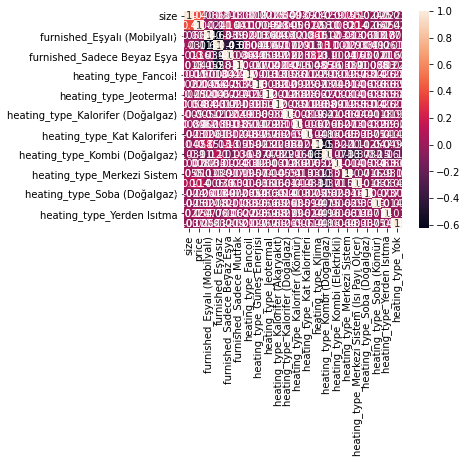

In [212]:
sns.heatmap(cm, cbar=True, annot=True, square=True)

In [213]:
abs(cm["price"])

size                                            0.402853
price                                           1.000000
furnished_Eşyalı (Mobilyalı)                    0.002369
furnished_Eşyasız                               0.106970
furnished_Sadece Beyaz Eşya                     0.164018
furnished_Sadece Mutfak                         0.041434
heating_type_Fancoil                            0.016648
heating_type_Güneş Enerjisi                     0.000451
heating_type_Jeotermal                          0.031646
heating_type_Kalorifer (Akaryakıt)              0.008422
heating_type_Kalorifer (Doğalgaz)               0.004987
heating_type_Kalorifer (Kömür)                  0.006192
heating_type_Kat Kaloriferi                     0.012057
heating_type_Klima                              0.057697
heating_type_Kombi (Doğalgaz)                   0.113474
heating_type_Kombi (Elektrikli)                 0.008182
heating_type_Merkezi Sistem                     0.011163
heating_type_Merkezi Sistem (Is

In [214]:
abs(cm["price"][abs(cm["price"]) > 0.1].drop('price')).index.tolist()

['size',
 'furnished_Eşyasız',
 'furnished_Sadece Beyaz Eşya',
 'heating_type_Kombi (Doğalgaz)',
 'heating_type_Merkezi Sistem (Isı Payı Ölçer)']

In [215]:
vals = [0.001,0.002,0.03,0.04,0.05,0.06,0.1]
for val in vals:
    features = abs(cm["price"][abs(cm["price"]) > val].drop('price')).index.tolist()
    Z = one_hot_encoded_data[features]
    print(features)
    X_train, X_test, Y_train, Y_test = train_test_split(Z,Y,test_size=0.3,random_state=0)
    scaled_x_train = myScaler.fit_transform(X_train)
    scaled_x_test= myScaler.transform(X_test)
    model=LinearRegression()
    model.fit(scaled_x_train,Y_train)
    LinearRegression()
    print(model.score(scaled_x_test,Y_test))
    
    

['size', 'furnished_Eşyalı (Mobilyalı)', 'furnished_Eşyasız', 'furnished_Sadece Beyaz Eşya', 'furnished_Sadece Mutfak', 'heating_type_Fancoil', 'heating_type_Jeotermal', 'heating_type_Kalorifer (Akaryakıt)', 'heating_type_Kalorifer (Doğalgaz)', 'heating_type_Kalorifer (Kömür)', 'heating_type_Kat Kaloriferi', 'heating_type_Klima', 'heating_type_Kombi (Doğalgaz)', 'heating_type_Kombi (Elektrikli)', 'heating_type_Merkezi Sistem', 'heating_type_Merkezi Sistem (Isı Payı Ölçer)', 'heating_type_Soba (Doğalgaz)', 'heating_type_Soba (Kömür)', 'heating_type_Yerden Isıtma', 'heating_type_Yok']
0.20708911017582032
['size', 'furnished_Eşyalı (Mobilyalı)', 'furnished_Eşyasız', 'furnished_Sadece Beyaz Eşya', 'furnished_Sadece Mutfak', 'heating_type_Fancoil', 'heating_type_Jeotermal', 'heating_type_Kalorifer (Akaryakıt)', 'heating_type_Kalorifer (Doğalgaz)', 'heating_type_Kalorifer (Kömür)', 'heating_type_Kat Kaloriferi', 'heating_type_Klima', 'heating_type_Kombi (Doğalgaz)', 'heating_type_Kombi (Elek

In [216]:
features = ['size', 'furnished_Eşyalı (Mobilyalı)', 'furnished_Eşyasız', 'furnished_Sadece Beyaz Eşya', 'furnished_Sadece Mutfak', 'heating_type_Fancoil', 'heating_type_Jeotermal', 'heating_type_Kalorifer (Akaryakıt)', 'heating_type_Kalorifer (Doğalgaz)', 'heating_type_Kalorifer (Kömür)', 'heating_type_Kat Kaloriferi', 'heating_type_Klima', 'heating_type_Kombi (Doğalgaz)', 'heating_type_Kombi (Elektrikli)', 'heating_type_Merkezi Sistem', 'heating_type_Merkezi Sistem (Isı Payı Ölçer)', 'heating_type_Soba (Doğalgaz)', 'heating_type_Soba (Kömür)', 'heating_type_Yerden Isıtma', 'heating_type_Yok']
Z = one_hot_encoded_data[features]
X_train, X_test, Y_train, Y_test = train_test_split(Z,Y,test_size=0.3,random_state=0)
scaled_x_train = myScaler.fit_transform(X_train)
scaled_x_test= myScaler.transform(X_test)
model=LinearRegression()
model.fit(scaled_x_train,Y_train)



LinearRegression()

In [217]:
model.coef_ #coeffients of the model


array([ 9.96968165e+04,  6.64218596e+15,  9.80618444e+15,  4.72857278e+15,
        6.20449291e+15,  5.62476635e+03,  1.02999914e+04,  2.10533889e+03,
        4.25332826e+03, -5.52886954e+02,  4.28470287e+03,  2.55486173e+04,
        1.07811646e+04,  4.14573606e+03,  7.19660281e+03,  3.17431472e+04,
       -1.47818198e+03, -8.48990883e+03,  1.40326531e+04,  2.33081498e+03])

In [218]:
model.intercept_

298504.3649833714

In [219]:
y_predict = model.predict(scaled_x_test)

In [220]:
y_predict[len(y_predict)-1]


315828.50828067766

In [221]:
#print the predicted and actual values of the data in the test set

for i in range(len(y_predict)):
    print("Predicted value:", y_predict[i]," Actual value:",Y_test.values[i])

Predicted value: 459256.20381879667  Actual value: 360000.0
Predicted value: 229703.00828067766  Actual value: 60000.0
Predicted value: 122045.75828067766  Actual value: 160000.0
Predicted value: 305063.00828067766  Actual value: 149000.0
Predicted value: 186640.00828067766  Actual value: 220000.0
Predicted value: 197405.75828067766  Actual value: 230000.0
Predicted value: 200794.9729914493  Actual value: 300000.0
Predicted value: 183863.67120350807  Actual value: 693000.0
Predicted value: 390181.35864598176  Actual value: 165000.0
Predicted value: 240468.50828067763  Actual value: 210000.0
Predicted value: 401954.25828067766  Actual value: 213000.0
Predicted value: 262000.00828067766  Actual value: 430000.0
Predicted value: 251234.25828067763  Actual value: 147000.0
Predicted value: 238063.18795319373  Actual value: 170000.0
Predicted value: 197405.75828067766  Actual value: 410000.0
Predicted value: 240468.50828067763  Actual value: 233000.0
Predicted value: 325463.3166432215  Actual

Predicted value: 391188.75828067766  Actual value: 680000.0
Predicted value: 202316.30663416575  Actual value: 230000.0
Predicted value: 195000.43795319373  Actual value: 165000.0
Predicted value: 175874.25828067766  Actual value: 155000.0
Predicted value: 294297.25828067766  Actual value: 1150000.0
Predicted value: 294297.25828067766  Actual value: 245000.0
Predicted value: 283531.50828067766  Actual value: 385000.0
Predicted value: 305063.00828067766  Actual value: 175000.0
Predicted value: 269989.42120350804  Actual value: 480000.0
Predicted value: 197405.75828067766  Actual value: 140000.0
Predicted value: 584971.5082806776  Actual value: 750000.0
Predicted value: 431891.8334999586  Actual value: 375000.0
Predicted value: 300133.42120350804  Actual value: 535000.0
Predicted value: 199980.43795319373  Actual value: 140000.0
Predicted value: 262000.00828067766  Actual value: 158750.0
Predicted value: 246928.00828067763  Actual value: 1050000.0
Predicted value: 146966.47299144935  Act

Predicted value: 234009.25828067763  Actual value: 320000.0
Predicted value: 348125.75828067766  Actual value: 359000.0
Predicted value: 356486.18795319373  Actual value: 339000.0
Predicted value: 263272.13697070535  Actual value: 120000.0
Predicted value: 272765.75828067766  Actual value: 265000.0
Predicted value: 111280.00828067766  Actual value: 110000.0
Predicted value: 208171.50828067766  Actual value: 235000.0
Predicted value: 197405.75828067766  Actual value: 190000.0
Predicted value: 477314.25828067766  Actual value: 400000.0
Predicted value: 324188.93795319373  Actual value: 139000.0
Predicted value: 394796.2034254756  Actual value: 210000.0
Predicted value: 262000.00828067766  Actual value: 265000.0
Predicted value: 240468.50828067763  Actual value: 298000.0
Predicted value: 485303.67120350804  Actual value: 300000.0
Predicted value: 305063.00828067766  Actual value: 350000.0
Predicted value: 283531.50828067766  Actual value: 157000.0
Predicted value: 197405.75828067766  Actu

Predicted value: 326594.25828067766  Actual value: 360000.0
Predicted value: 186640.00828067766  Actual value: 205000.0
Predicted value: 197405.75828067766  Actual value: 160000.0
Predicted value: 269913.9534254757  Actual value: 375000.0
Predicted value: 143577.25828067766  Actual value: 120000.0
Predicted value: 240468.50828067763  Actual value: 172000.0
Predicted value: 356486.18795319373  Actual value: 250000.0
Predicted value: 218937.25828067766  Actual value: 149999.0
Predicted value: 305063.00828067766  Actual value: 595000.0
Predicted value: 305063.00828067766  Actual value: 223000.0
Predicted value: 366880.92120350804  Actual value: 136000.0
Predicted value: 421080.4379531938  Actual value: 1395520.0
Predicted value: 294297.25828067766  Actual value: 340000.0
Predicted value: 391188.75828067766  Actual value: 310000.0
Predicted value: 132811.50828067766  Actual value: 290000.0
Predicted value: 229703.00828067766  Actual value: 178000.0
Predicted value: 442240.92120350804  Actu

Predicted value: 326594.25828067766  Actual value: 185000.0
Predicted value: 283531.50828067766  Actual value: 310000.0
Predicted value: 356486.18795319373  Actual value: 210000.0
Predicted value: 291891.68795319373  Actual value: 265000.0
Predicted value: 197405.75828067766  Actual value: 125000.0
Predicted value: 214631.00828067766  Actual value: 290000.0
Predicted value: 178289.2608042027  Actual value: 75000.0
Predicted value: 186640.00828067766  Actual value: 230000.0
Predicted value: 294297.25828067766  Actual value: 219000.0
Predicted value: 463772.42120350804  Actual value: 318000.0
Predicted value: 157732.22299144932  Actual value: 120000.0
Predicted value: 218937.25828067766  Actual value: 195000.0
Predicted value: 294297.25828067766  Actual value: 230000.0
Predicted value: 324312.22995595407  Actual value: 275000.0
Predicted value: 571800.4379531938  Actual value: 475000.0
Predicted value: 306517.2034254756  Actual value: 200000.0
Predicted value: 218937.25828067766  Actual 

Predicted value: 711234.6879531937  Actual value: 850000.0
Predicted value: 166249.13211417498  Actual value: 163000.0
Predicted value: 454967.7786579195  Actual value: 275000.0
Predicted value: 262000.00828067766  Actual value: 199000.0
Predicted value: 399548.93795319373  Actual value: 730000.0
Predicted value: 218937.25828067766  Actual value: 125000.0
Predicted value: 186640.00828067766  Actual value: 790000.0
Predicted value: 455783.00828067766  Actual value: 360000.0
Predicted value: 556281.9534254756  Actual value: 390000.0
Predicted value: 240468.50828067763  Actual value: 215000.0
Predicted value: 218937.25828067766  Actual value: 205000.0
Predicted value: 248828.93795319373  Actual value: 170000.0
Predicted value: 197405.75828067766  Actual value: 267000.0
Predicted value: 369657.25828067766  Actual value: 219000.0
Predicted value: 218937.25828067766  Actual value: 145000.0
Predicted value: 251234.25828067763  Actual value: 164000.0
Predicted value: 356115.17120350804  Actual

Predicted value: 251234.25828067763  Actual value: 335000.0
Predicted value: 434251.50828067766  Actual value: 370000.0
Predicted value: 360164.13697070535  Actual value: 265000.0
Predicted value: 249081.25828067763  Actual value: 188000.0
Predicted value: 393805.5834999586  Actual value: 265000.0
Predicted value: 284804.13697070535  Actual value: 118000.0
Predicted value: 272765.75828067766  Actual value: 215000.0
Predicted value: 370932.13697070535  Actual value: 1375000.0
Predicted value: 391188.75828067766  Actual value: 600000.0
Predicted value: 186640.00828067766  Actual value: 188000.0
Predicted value: 305063.00828067766  Actual value: 495000.0
Predicted value: 175874.25828067766  Actual value: 180000.0
Predicted value: 528737.4379531938  Actual value: 640000.0
Predicted value: 240468.50828067763  Actual value: 430000.0
Predicted value: 175874.25828067766  Actual value: 155000.0
Predicted value: 218937.25828067766  Actual value: 169000.0
Predicted value: 416327.4534254756  Actua

Predicted value: 218937.25828067766  Actual value: 235000.0
Predicted value: 262000.00828067766  Actual value: 185000.0
Predicted value: 309973.55663416575  Actual value: 250000.0
Predicted value: 154342.75828067766  Actual value: 185000.0
Predicted value: 165108.50828067766  Actual value: 159000.0
Predicted value: 262000.00828067766  Actual value: 263000.0
Predicted value: 295572.13697070535  Actual value: 165000.0
Predicted value: 162494.88903835395  Actual value: 205000.0
Predicted value: 216323.38903835393  Actual value: 122000.0
Predicted value: 485674.6879531938  Actual value: 800000.0
Predicted value: 649565.7582806776  Actual value: 460000.0
Predicted value: 318400.43795319373  Actual value: 2564100.0
Predicted value: 337360.00828067766  Actual value: 780000.0
Predicted value: 218937.25828067766  Actual value: 159000.0
Predicted value: 186640.00828067766  Actual value: 169000.0
Predicted value: 218937.25828067766  Actual value: 165000.0
Predicted value: 262000.00828067766  Actu

Predicted value: 218937.25828067766  Actual value: 360000.0
Predicted value: 186640.00828067766  Actual value: 285000.0
Predicted value: 480921.9534254756  Actual value: 243000.0
Predicted value: 262000.00828067766  Actual value: 243000.0
Predicted value: 221508.43795319373  Actual value: 564480.0
Predicted value: 240468.50828067763  Actual value: 185000.0
Predicted value: 459256.20381879667  Actual value: 345000.0
Predicted value: 262000.00828067766  Actual value: 165000.0
Predicted value: 369657.25828067766  Actual value: 295000.0
Predicted value: 358891.50828067766  Actual value: 238000.0
Predicted value: 295572.13697070535  Actual value: 159000.0
Predicted value: 519855.50828067766  Actual value: 460000.0
Predicted value: 226926.67120350804  Actual value: 80000.0
Predicted value: 220838.18795319373  Actual value: 239000.0
Predicted value: 122045.75828067766  Actual value: 79000.0
Predicted value: 270360.43795319373  Actual value: 325000.0
Predicted value: 280755.17120350804  Actual

Predicted value: 259594.68795319373  Actual value: 270000.0
Predicted value: 442611.9379531938  Actual value: 399000.0
Predicted value: 378017.43795319373  Actual value: 138000.0
Predicted value: 582046.6879531938  Actual value: 1070000.0
Predicted value: 506686.6879531938  Actual value: 250000.0
Predicted value: 197405.75828067766  Actual value: 240000.0
Predicted value: 325093.5498935358  Actual value: 170000.0
Predicted value: 502453.2034254756  Actual value: 299000.0
Predicted value: 326594.25828067766  Actual value: 445000.0
Predicted value: 288509.25828067766  Actual value: 85000.0
Predicted value: 226926.67120350804  Actual value: 152000.0
Predicted value: 485674.6879531938  Actual value: 255000.0
Predicted value: 326594.25828067766  Actual value: 315000.0
Predicted value: 417630.55663416575  Actual value: 305000.0
Predicted value: 186640.00828067766  Actual value: 250000.0
Predicted value: 326594.25828067766  Actual value: 355000.0
Predicted value: 502453.2034254756  Actual val

Predicted value: 218937.25828067766  Actual value: 410000.0
Predicted value: 318400.43795319373  Actual value: 450000.0
Predicted value: 218937.25828067766  Actual value: 208000.0
Predicted value: 162748.83349995865  Actual value: 195000.0
Predicted value: 251234.25828067763  Actual value: 155000.0
Predicted value: 252508.13697070535  Actual value: 208000.0
Predicted value: 317104.13697070535  Actual value: 240000.0
Predicted value: 412720.00828067766  Actual value: 329000.0
Predicted value: 262000.00828067766  Actual value: 135000.0
Predicted value: 218937.25828067766  Actual value: 112000.0
Predicted value: 240468.50828067763  Actual value: 235000.0
Predicted value: 130035.17120350804  Actual value: 160000.0
Predicted value: 369657.25828067766  Actual value: 480000.0
Predicted value: 380170.68795319373  Actual value: 430000.0
Predicted value: 320739.05663416575  Actual value: 720000.0
Predicted value: 610287.5082806776  Actual value: 2150000.0
Predicted value: 480921.9534254756  Actu

Predicted value: 315828.50828067766  Actual value: 155000.0
Predicted value: 197405.75828067766  Actual value: 375000.0
Predicted value: 401954.25828067766  Actual value: 369000.0
Predicted value: 302703.3334999586  Actual value: 165000.0
Predicted value: 464143.1879531938  Actual value: 345000.0
Predicted value: 137117.75828067766  Actual value: 183000.0
Predicted value: 657926.1879531937  Actual value: 575000.0
Predicted value: 251234.25828067763  Actual value: 180000.0
Predicted value: 368527.3166432214  Actual value: 290000.0
Predicted value: 272765.75828067766  Actual value: 154000.0
Predicted value: 216531.68795319373  Actual value: 175000.0
Predicted value: 197405.75828067766  Actual value: 125000.0
Predicted value: 186640.00828067766  Actual value: 261000.0
Predicted value: 216531.68795319373  Actual value: 185000.0
Predicted value: 469120.4379531938  Actual value: 390000.0
Predicted value: 399548.93795319373  Actual value: 192500.0
Predicted value: 272765.75828067766  Actual v

Predicted value: 197405.75828067766  Actual value: 600000.0
Predicted value: 401954.25828067766  Actual value: 235000.0
Predicted value: 186640.00828067766  Actual value: 285000.0
Predicted value: 358891.50828067766  Actual value: 380000.0
Predicted value: 434251.50828067766  Actual value: 670000.0
Predicted value: 606503.0082806776  Actual value: 1250000.0
Predicted value: 262000.00828067766  Actual value: 155000.0
Predicted value: 154342.75828067766  Actual value: 210000.0
Predicted value: 222544.70342547563  Actual value: 210000.0
Predicted value: 348986.0997292013  Actual value: 347000.0
Predicted value: 274040.13697070535  Actual value: 119000.0
Predicted value: 294297.25828067766  Actual value: 150000.0
Predicted value: 266910.55663416575  Actual value: 235000.0
Predicted value: 261301.20342547563  Actual value: 169000.0
Predicted value: 213082.05663416575  Actual value: 175000.0
Predicted value: 236162.25828067763  Actual value: 345000.0
Predicted value: 272765.75828067766  Actu

Predicted value: 313675.50828067766  Actual value: 270000.0
Predicted value: 480921.9534254756  Actual value: 239000.0
Predicted value: 317104.13697070535  Actual value: 230000.0
Predicted value: 143577.25828067766  Actual value: 168000.0
Predicted value: 345972.50828067766  Actual value: 264000.0
Predicted value: 173514.58349995865  Actual value: 350000.0
Predicted value: 315828.50828067766  Actual value: 200000.0
Predicted value: 424760.1369707054  Actual value: 335000.0
Predicted value: 197405.75828067766  Actual value: 135000.0
Predicted value: 537326.6853241934  Actual value: 495000.0
Predicted value: 277676.30663416575  Actual value: 238000.0
Predicted value: 208171.50828067766  Actual value: 275000.0
Predicted value: 262000.00828067766  Actual value: 190000.0
Predicted value: 154342.75828067766  Actual value: 285000.0
Predicted value: 593331.9379531938  Actual value: 750000.0
Predicted value: 326594.25828067766  Actual value: 268000.0
Predicted value: 309369.25828067766  Actual 

Predicted value: 197405.75828067766  Actual value: 354000.0
Predicted value: 528737.4379531938  Actual value: 265000.0
Predicted value: 111280.00828067766  Actual value: 150000.0
Predicted value: 227297.43795319373  Actual value: 164000.0
Predicted value: 412720.00828067766  Actual value: 315000.0
Predicted value: 272765.75828067766  Actual value: 175000.0
Predicted value: 369657.25828067766  Actual value: 500000.0
Predicted value: 186640.00828067766  Actual value: 215000.0
Predicted value: 339932.43795319373  Actual value: 210000.0
Predicted value: 448624.7034254756  Actual value: 215000.0
Predicted value: 401954.25828067766  Actual value: 288000.0
Predicted value: 356039.4534254756  Actual value: 143000.0
Predicted value: 348125.75828067766  Actual value: 165000.0
Predicted value: 326594.25828067766  Actual value: 350000.0
Predicted value: 281126.18795319373  Actual value: 340000.0
Predicted value: 208171.50828067766  Actual value: 180000.0
Predicted value: 348125.75828067766  Actual

Predicted value: 334954.68795319373  Actual value: 385000.0
Predicted value: 317104.13697070535  Actual value: 175000.0
Predicted value: 347873.43795319373  Actual value: 160000.0
Predicted value: 208171.50828067766  Actual value: 460000.0
Predicted value: 562919.5082806776  Actual value: 195000.0
Predicted value: 347231.65909006447  Actual value: 158000.0
Predicted value: 348125.75828067766  Actual value: 285000.0
Predicted value: 407536.13697070535  Actual value: 205000.0
Predicted value: 326342.18795319373  Actual value: 1075000.0
Predicted value: 218937.25828067766  Actual value: 245000.0
Predicted value: 374539.0821155033  Actual value: 170000.0
Predicted value: 389685.5498935358  Actual value: 375000.0
Predicted value: 369657.25828067766  Actual value: 173000.0
Predicted value: 323817.92120350804  Actual value: 435000.0
Predicted value: 218937.25828067766  Actual value: 139000.0
Predicted value: 197405.75828067766  Actual value: 295000.0
Predicted value: 200794.9729914493  Actual

Predicted value: 434251.50828067766  Actual value: 275000.0
Predicted value: 262000.00828067766  Actual value: 240000.0
Predicted value: 377570.9534254756  Actual value: 203000.0
Predicted value: 175874.25828067766  Actual value: 152000.0
Predicted value: 205772.2229914493  Actual value: 85000.0
Predicted value: 498845.75828067766  Actual value: 699000.0
Predicted value: 294297.25828067766  Actual value: 165000.0
Predicted value: 192758.382114175  Actual value: 200000.0
Predicted value: 154342.75828067766  Actual value: 185000.0
Predicted value: 313423.18795319373  Actual value: 192000.0
Predicted value: 197405.75828067766  Actual value: 179000.0
Predicted value: 505846.4799559541  Actual value: 640000.0
Predicted value: 240468.50828067763  Actual value: 375000.0
Predicted value: 126352.00828067766  Actual value: 137000.0
Predicted value: 168497.72299144932  Actual value: 130000.0
Predicted value: 201570.7786579195  Actual value: 195000.0
Predicted value: 412720.00828067766  Actual val

Predicted value: 186640.00828067766  Actual value: 100000.0
Predicted value: 470156.2034254756  Actual value: 220000.0
Predicted value: 322014.6853241935  Actual value: 323000.0
Predicted value: 294297.25828067766  Actual value: 235000.0
Predicted value: 228571.31664322145  Actual value: 110000.0
Predicted value: 391188.75828067766  Actual value: 470000.0
Predicted value: 222326.4729914493  Actual value: 235000.0
Predicted value: 305063.00828067766  Actual value: 170000.0
Predicted value: 197405.75828067766  Actual value: 164000.0
Predicted value: 227297.43795319373  Actual value: 325000.0
Predicted value: 377124.92120350804  Actual value: 165000.0
Predicted value: 197405.75828067766  Actual value: 81000.0
Predicted value: 245379.05663416575  Actual value: 225000.0
Predicted value: 122045.75828067766  Actual value: 240000.0
Predicted value: 197405.75828067766  Actual value: 155000.0
Predicted value: 345766.0834999586  Actual value: 420000.0
Predicted value: 218937.25828067766  Actual v

Predicted value: 207277.15909006447  Actual value: 205000.0
Predicted value: 356486.18795319373  Actual value: 183000.0
Predicted value: 197405.75828067766  Actual value: 210000.0
Predicted value: 305063.00828067766  Actual value: 230000.0
Predicted value: 262000.00828067766  Actual value: 375000.0
Predicted value: 436275.47995595407  Actual value: 750000.0
Predicted value: 270360.43795319373  Actual value: 180000.0
Predicted value: 240468.50828067763  Actual value: 132000.0
Predicted value: 240468.50828067763  Actual value: 130000.0
Predicted value: 87388.83349995862  Actual value: 96000.0
Predicted value: 391188.75828067766  Actual value: 335000.0
Predicted value: 324188.93795319373  Actual value: 450000.0
Predicted value: 411905.0286579195  Actual value: 784000.0
Predicted value: 283531.50828067766  Actual value: 270000.0
Predicted value: 283531.50828067766  Actual value: 203000.0
Predicted value: 326594.25828067766  Actual value: 210000.0
Predicted value: 186640.00828067766  Actual

Predicted value: 143577.25828067766  Actual value: 400000.0
Predicted value: 283531.50828067766  Actual value: 210000.0
Predicted value: 111280.00828067766  Actual value: 155000.0
Predicted value: 132811.50828067766  Actual value: 125000.0
Predicted value: 373264.7034254756  Actual value: 282000.0
Predicted value: 369657.25828067766  Actual value: 315000.0
Predicted value: 227297.43795319373  Actual value: 185000.0
Predicted value: 218937.25828067766  Actual value: 150000.0
Predicted value: 348125.75828067766  Actual value: 630000.0
Predicted value: 216160.92120350804  Actual value: 60000.0
Predicted value: 361094.67120350804  Actual value: 380000.0
Predicted value: 288509.25828067766  Actual value: 265000.0
Predicted value: 399548.93795319373  Actual value: 525000.0
Predicted value: 470156.2034254756  Actual value: 260000.0
Predicted value: 229703.00828067766  Actual value: 180000.0
Predicted value: 423485.7582806777  Actual value: 865000.0
Predicted value: 270360.43795319373  Actual 

Predicted value: 208171.50828067766  Actual value: 147000.0
Predicted value: 567047.7034254756  Actual value: 315000.0
Predicted value: 223243.50828067766  Actual value: 420000.0
Predicted value: 197405.75828067766  Actual value: 145000.0
Predicted value: 283531.50828067766  Actual value: 320000.0
Predicted value: 262000.00828067766  Actual value: 159000.0
Predicted value: 122045.75828067766  Actual value: 168500.0
Predicted value: 470156.2034254756  Actual value: 380000.0
Predicted value: 358891.50828067766  Actual value: 380000.0
Predicted value: 186640.00828067766  Actual value: 116000.0
Predicted value: 186640.00828067766  Actual value: 310000.0
Predicted value: 208171.50828067766  Actual value: 410000.0
Predicted value: 233310.45342547563  Actual value: 295000.0
Predicted value: 657406.6879531937  Actual value: 700000.0
Predicted value: 216160.92120350804  Actual value: 80000.0
Predicted value: 480921.9534254756  Actual value: 255000.0
Predicted value: 334583.67120350804  Actual v

Predicted value: 272765.75828067766  Actual value: 270000.0
Predicted value: 528737.4379531938  Actual value: 295000.0
Predicted value: 434251.50828067766  Actual value: 268000.0
Predicted value: 240468.50828067763  Actual value: 155000.0
Predicted value: 463622.6879531938  Actual value: 325000.0
Predicted value: 240468.50828067763  Actual value: 159000.0
Predicted value: 262000.00828067766  Actual value: 190000.0
Predicted value: 400823.3166432214  Actual value: 300000.0
Predicted value: 305063.00828067766  Actual value: 465000.0
Predicted value: 227297.43795319373  Actual value: 210000.0
Predicted value: 859354.4534254756  Actual value: 1270480.0
Predicted value: 227297.43795319373  Actual value: 220000.0
Predicted value: 175874.25828067766  Actual value: 152000.0
Predicted value: 431846.1879531938  Actual value: 268000.0
Predicted value: 164485.42120350804  Actual value: 142000.0
Predicted value: 541209.9534254756  Actual value: 950000.0
Predicted value: 178448.43795319373  Actual v

Predicted value: 491687.7034254756  Actual value: 470000.0
Predicted value: 334954.68795319373  Actual value: 240000.0
Predicted value: 240468.50828067763  Actual value: 147000.0
Predicted value: 665873.9729914493  Actual value: 650000.0
Predicted value: 465849.9534254756  Actual value: 120000.0
Predicted value: 240468.50828067763  Actual value: 360000.0
Predicted value: 305063.00828067766  Actual value: 119000.0
Predicted value: 218937.25828067766  Actual value: 115000.0
Predicted value: 475032.22995595407  Actual value: 290000.0
Predicted value: 221557.58349995862  Actual value: 225000.0
Predicted value: 279225.25828067766  Actual value: 180000.0
Predicted value: 334583.67120350804  Actual value: 135000.0
Predicted value: 283531.50828067766  Actual value: 205000.0
Predicted value: 378017.43795319373  Actual value: 450000.0
Predicted value: 168497.72299144932  Actual value: 165000.0
Predicted value: 191617.25828067766  Actual value: 174000.0
Predicted value: 251234.25828067763  Actual

Predicted value: 283531.50828067766  Actual value: 142000.0
Predicted value: 513218.9534254756  Actual value: 330000.0
Predicted value: 175874.25828067766  Actual value: 99000.0
Predicted value: 226926.67120350804  Actual value: 85000.0
Predicted value: 391188.75828067766  Actual value: 670000.0
Predicted value: 326594.25828067766  Actual value: 220000.0
Predicted value: 240468.50828067763  Actual value: 125000.0
Predicted value: 231856.00828067763  Actual value: 345000.0
Predicted value: 218937.25828067766  Actual value: 125000.0
Predicted value: 299207.80663416575  Actual value: 360000.0
Predicted value: 154342.75828067766  Actual value: 155000.0
Predicted value: 369657.25828067766  Actual value: 315000.0
Predicted value: 175874.25828067766  Actual value: 275000.0
Predicted value: 305063.00828067766  Actual value: 390000.0
Predicted value: 534750.4534254756  Actual value: 535000.0
Predicted value: 259594.68795319373  Actual value: 450000.0
Predicted value: 183863.67120350807  Actual 

Predicted value: 226926.67120350804  Actual value: 190000.0
Predicted value: 381696.13697070535  Actual value: 245000.0
Predicted value: 315828.50828067766  Actual value: 377900.0
Predicted value: 122045.75828067766  Actual value: 76500.0
Predicted value: 446157.882114175  Actual value: 375000.0
Predicted value: 283531.50828067766  Actual value: 175000.0
Predicted value: 421080.4379531938  Actual value: 360000.0
Predicted value: 272765.75828067766  Actual value: 148000.0
Predicted value: 342270.5566341658  Actual value: 275000.0
Predicted value: 356486.18795319373  Actual value: 150000.0
Predicted value: 363869.25828067766  Actual value: 215000.0
Predicted value: 337360.00828067766  Actual value: 299000.0
Predicted value: 299277.25828067766  Actual value: 160000.0
Predicted value: 382626.67120350804  Actual value: 365000.0
Predicted value: 334583.67120350804  Actual value: 245000.0
Predicted value: 492257.2299559541  Actual value: 630000.0
Predicted value: 541908.7582806777  Actual val

Predicted value: 326594.25828067766  Actual value: 265000.0
Predicted value: 245379.05663416575  Actual value: 460000.0
Predicted value: 305063.00828067766  Actual value: 400000.0
Predicted value: 592960.921203508  Actual value: 700000.0
Predicted value: 337360.00828067766  Actual value: 215000.0
Predicted value: 396099.3066341658  Actual value: 355000.0
Predicted value: 369657.25828067766  Actual value: 389000.0
Predicted value: 434251.50828067766  Actual value: 400000.0
Predicted value: 251234.25828067763  Actual value: 124500.0
Predicted value: 485154.6879531938  Actual value: 370000.0
Predicted value: 272765.75828067766  Actual value: 469900.0
Predicted value: 296868.43795319373  Actual value: 350000.0
Predicted value: 162332.17120350804  Actual value: 144500.0
Predicted value: 165108.50828067766  Actual value: 105000.0
Predicted value: 256144.80663416575  Actual value: 158000.0
Predicted value: 380423.00828067766  Actual value: 310000.0
Predicted value: 291520.92120350804  Actual 

Predicted value: 197405.75828067766  Actual value: 134000.0
Predicted value: 373340.42120350804  Actual value: 315000.0
Predicted value: 649565.7582806776  Actual value: 265000.0
Predicted value: 136200.72299144932  Actual value: 149000.0
Predicted value: 197405.75828067766  Actual value: 190000.0
Predicted value: 251234.25828067763  Actual value: 228000.0
Predicted value: 337360.00828067766  Actual value: 3326400.0
Predicted value: 378017.43795319373  Actual value: 350000.0
Predicted value: 294297.25828067766  Actual value: 800000.0
Predicted value: 401954.25828067766  Actual value: 220000.0
Predicted value: 287837.75828067766  Actual value: 495000.0
Predicted value: 186640.00828067766  Actual value: 465000.0
Predicted value: 137789.25828067766  Actual value: 118000.0
Predicted value: 237692.42120350804  Actual value: 280000.0
Predicted value: 262000.00828067766  Actual value: 265000.0
Predicted value: 221508.43795319373  Actual value: 225000.0
Predicted value: 262000.00828067766  Act

Predicted value: 240468.50828067763  Actual value: 172000.0
Predicted value: 558434.9534254756  Actual value: 150000.0
Predicted value: 240468.50828067763  Actual value: 340000.0
Predicted value: 302657.43795319373  Actual value: 255000.0
Predicted value: 422967.5082806777  Actual value: 290000.0
Predicted value: 156496.00828067766  Actual value: 190000.0
Predicted value: 89748.50828067766  Actual value: 120000.0
Predicted value: 369657.25828067766  Actual value: 630000.0
Predicted value: 391188.75828067766  Actual value: 190000.0
Predicted value: 348125.75828067766  Actual value: 299000.0
Predicted value: 197405.75828067766  Actual value: 177000.0
Predicted value: 251234.25828067763  Actual value: 230000.0
Predicted value: 186640.00828067766  Actual value: 165000.0
Predicted value: 130035.17120350804  Actual value: 93000.0
Predicted value: 262000.00828067766  Actual value: 137000.0
Predicted value: 434251.50828067766  Actual value: 320000.0
Predicted value: 326594.25828067766  Actual 

Predicted value: 262000.00828067766  Actual value: 290000.0
Predicted value: 205395.17120350804  Actual value: 225000.0
Predicted value: 460663.0821155034  Actual value: 2200000.0
Predicted value: 340967.4534254756  Actual value: 589000.0
Predicted value: 326594.25828067766  Actual value: 395000.0
Predicted value: 281126.18795319373  Actual value: 169000.0
Predicted value: 197405.75828067766  Actual value: 185000.0
Predicted value: 216531.68795319373  Actual value: 165000.0
Predicted value: 186640.00828067766  Actual value: 123000.0
Predicted value: 218937.25828067766  Actual value: 60000.0
Predicted value: 218937.25828067766  Actual value: 85000.0
Predicted value: 197405.75828067766  Actual value: 470000.0
Predicted value: 356039.4534254756  Actual value: 175000.0
Predicted value: 312976.7034254756  Actual value: 360000.0
Predicted value: 197405.75828067766  Actual value: 365000.0
Predicted value: 254623.4729914493  Actual value: 215000.0
Predicted value: 251234.25828067763  Actual va

Predicted value: 197405.75828067766  Actual value: 500000.0
Predicted value: 319301.95381879667  Actual value: 550000.0
Predicted value: 348125.75828067766  Actual value: 230000.0
Predicted value: 323817.92120350804  Actual value: 415000.0
Predicted value: 182333.75828067766  Actual value: 200000.0
Predicted value: 442611.9379531938  Actual value: 205000.0
Predicted value: 348125.75828067766  Actual value: 270000.0
Predicted value: 294297.25828067766  Actual value: 700000.0
Predicted value: 426959.20381879667  Actual value: 450000.0
Predicted value: 165108.50828067766  Actual value: 125000.0
Predicted value: 287138.9534254756  Actual value: 110000.0
Predicted value: 212477.75828067766  Actual value: 122000.0
Predicted value: 208171.50828067766  Actual value: 178000.0
Predicted value: 283531.50828067766  Actual value: 390000.0
Predicted value: 208171.50828067766  Actual value: 140000.0
Predicted value: 143577.25828067766  Actual value: 155000.0
Predicted value: 218684.93795319373  Actua

Predicted value: 146966.47299144935  Actual value: 132000.0
Predicted value: 477314.25828067766  Actual value: 585000.0
Predicted value: 208171.50828067766  Actual value: 118000.0
Predicted value: 202316.30663416575  Actual value: 105000.0
Predicted value: 464368.2034254756  Actual value: 213000.0
Predicted value: 122045.75828067766  Actual value: 115000.0
Predicted value: 455263.50828067766  Actual value: 199000.0
Predicted value: 227297.43795319373  Actual value: 320000.0
Predicted value: 302909.75828067766  Actual value: 305000.0
Predicted value: 463696.7034254756  Actual value: 359000.0
Predicted value: 259640.33349995862  Actual value: 220000.0
Predicted value: 166249.13211417498  Actual value: 96000.0
Predicted value: 142699.8066341658  Actual value: 110000.0
Predicted value: 291520.92120350804  Actual value: 270000.0
Predicted value: 111280.00828067766  Actual value: 118000.0
Predicted value: 262000.00828067766  Actual value: 150000.0
Predicted value: 348125.75828067766  Actual 

Predicted value: 218937.25828067766  Actual value: 163000.0
Predicted value: 143577.25828067766  Actual value: 118000.0
Predicted value: 283531.50828067766  Actual value: 225000.0
Predicted value: 272765.75828067766  Actual value: 325000.0
Predicted value: 302286.67120350804  Actual value: 475000.0
Predicted value: 294297.25828067766  Actual value: 185000.0
Predicted value: 270360.43795319373  Actual value: 180000.0
Predicted value: 346995.3166432214  Actual value: 189000.0
Predicted value: 218937.25828067766  Actual value: 140000.0
Predicted value: 317104.13697070535  Actual value: 210000.0
Predicted value: 313423.18795319373  Actual value: 235000.0
Predicted value: 208171.50828067766  Actual value: 149000.0
Predicted value: 197405.75828067766  Actual value: 164000.0
Predicted value: 251234.25828067763  Actual value: 299000.0
Predicted value: 132811.50828067766  Actual value: 159000.0
Predicted value: 319217.9729914493  Actual value: 185000.0
Predicted value: 326594.25828067766  Actua

Predicted value: 307758.47995595407  Actual value: 189999.0
Predicted value: 262000.00828067766  Actual value: 235000.0
Predicted value: 262000.00828067766  Actual value: 330000.0
Predicted value: 349400.13697070535  Actual value: 128000.0
Predicted value: 223098.7786579195  Actual value: 115000.0
Predicted value: 208171.50828067766  Actual value: 200000.0
Predicted value: 525259.0821155034  Actual value: 345000.0
Predicted value: 195000.43795319373  Actual value: 170000.0
Predicted value: 263272.13697070535  Actual value: 185000.0
Predicted value: 197405.75828067766  Actual value: 390000.0
Predicted value: 227297.43795319373  Actual value: 185000.0
Predicted value: 283531.50828067766  Actual value: 370000.0
Predicted value: 417630.55663416575  Actual value: 680000.0
Predicted value: 106973.75828067766  Actual value: 75000.0
Predicted value: 358891.50828067766  Actual value: 197500.0
Predicted value: 197405.75828067766  Actual value: 125000.0
Predicted value: 208171.50828067766  Actual

Predicted value: 275340.43795319373  Actual value: 275000.0
Predicted value: 143577.25828067766  Actual value: 83000.0
Predicted value: 197405.75828067766  Actual value: 210000.0
Predicted value: 208171.50828067766  Actual value: 130000.0
Predicted value: 270360.43795319373  Actual value: 450000.0
Predicted value: 175874.25828067766  Actual value: 300000.0
Predicted value: 358891.50828067766  Actual value: 499000.0
Predicted value: 262000.00828067766  Actual value: 248000.0
Predicted value: 261105.90909006447  Actual value: 175000.0
Predicted value: 283531.50828067766  Actual value: 163000.0
Predicted value: 298603.50828067766  Actual value: 285000.0
Predicted value: 137789.25828067766  Actual value: 60000.0
Predicted value: 101654.88211417498  Actual value: 65000.0
Predicted value: 425386.6879531938  Actual value: 640000.0
Predicted value: 253930.47995595407  Actual value: 234999.0
Predicted value: 345720.43795319373  Actual value: 285000.0
Predicted value: 175874.25828067766  Actual 

Predicted value: 390667.50828067766  Actual value: 135000.0
Predicted value: 485228.2034254756  Actual value: 140000.0
Predicted value: 208171.50828067766  Actual value: 154000.0
Predicted value: 262000.00828067766  Actual value: 400000.0
Predicted value: 259594.68795319373  Actual value: 205000.0
Predicted value: 197405.75828067766  Actual value: 128000.0
Predicted value: 442611.9379531938  Actual value: 265000.0
Predicted value: 251234.25828067763  Actual value: 315000.0
Predicted value: 165108.50828067766  Actual value: 180000.0
Predicted value: 345720.43795319373  Actual value: 210000.0
Predicted value: 197405.75828067766  Actual value: 170000.0
Predicted value: 197405.75828067766  Actual value: 115000.0
Predicted value: 259594.68795319373  Actual value: 185000.0
Predicted value: 197405.75828067766  Actual value: 230000.0
Predicted value: 272765.75828067766  Actual value: 138000.0
Predicted value: 365351.00828067766  Actual value: 317000.0
Predicted value: 227297.43795319373  Actua

Predicted value: 410314.68795319373  Actual value: 360000.0
Predicted value: 272765.75828067766  Actual value: 209000.0
Predicted value: 369657.25828067766  Actual value: 495000.0
Predicted value: 245445.25828067763  Actual value: 145000.0
Predicted value: 319436.2034254756  Actual value: 200000.0
Predicted value: 399548.93795319373  Actual value: 779000.0
Predicted value: 412720.00828067766  Actual value: 315000.0
Predicted value: 208171.50828067766  Actual value: 240000.0
Predicted value: 429423.50828067766  Actual value: 164000.0
Predicted value: 259594.68795319373  Actual value: 1598000.0
Predicted value: 305063.00828067766  Actual value: 920000.0
Predicted value: 243040.43795319373  Actual value: 280000.0
Predicted value: 208171.50828067766  Actual value: 249500.0
Predicted value: 214378.68795319373  Actual value: 477000.0
Predicted value: 305063.00828067766  Actual value: 178000.0
Predicted value: 130035.17120350804  Actual value: 164000.0
Predicted value: 358891.50828067766  Act

Predicted value: 294297.25828067766  Actual value: 239000.0
Predicted value: 334954.68795319373  Actual value: 200000.0
Predicted value: 197405.75828067766  Actual value: 190000.0
Predicted value: 434251.50828067766  Actual value: 230000.0
Predicted value: 269989.42120350804  Actual value: 80000.0
Predicted value: 326594.25828067766  Actual value: 349000.0
Predicted value: 240468.50828067763  Actual value: 170000.0
Predicted value: 528737.4379531938  Actual value: 465000.0
Predicted value: 127025.25828067766  Actual value: 82500.0
Predicted value: 143577.25828067766  Actual value: 305000.0
Predicted value: 358891.50828067766  Actual value: 475000.0
Predicted value: 305063.00828067766  Actual value: 385000.0
Predicted value: 455783.00828067766  Actual value: 570000.0
Predicted value: 442734.97995595407  Actual value: 540000.0
Predicted value: 455783.00828067766  Actual value: 820000.0
Predicted value: 556281.9534254756  Actual value: 415000.0
Predicted value: 171568.00828067766  Actual 

Predicted value: 186640.00828067766  Actual value: 294000.0
Predicted value: 122045.75828067766  Actual value: 79999.0
Predicted value: 251234.25828067763  Actual value: 389000.0
Predicted value: 195000.43795319373  Actual value: 139000.0
Predicted value: 208171.50828067766  Actual value: 185000.0
Predicted value: 262000.00828067766  Actual value: 220000.0
Predicted value: 477314.25828067766  Actual value: 220000.0
Predicted value: 116190.55663416578  Actual value: 113000.0
Predicted value: 406260.75828067766  Actual value: 240000.0
Predicted value: 227297.43795319373  Actual value: 300000.0
Predicted value: 323817.92120350804  Actual value: 470000.0
Predicted value: 359495.80663416575  Actual value: 315000.0
Predicted value: 371858.67120350804  Actual value: 210000.0
Predicted value: 218937.25828067766  Actual value: 99000.0
Predicted value: 445017.25828067766  Actual value: 220000.0
Predicted value: 238063.18795319373  Actual value: 480000.0
Predicted value: 229703.00828067766  Actua

Predicted value: 240468.50828067763  Actual value: 900000.0
Predicted value: 372354.47995595407  Actual value: 319000.0
Predicted value: 216160.92120350804  Actual value: 195000.0
Predicted value: 337360.00828067766  Actual value: 365000.0
Predicted value: 270360.43795319373  Actual value: 225000.0
Predicted value: 337360.00828067766  Actual value: 205000.0
Predicted value: 545442.6879531938  Actual value: 429000.0
Predicted value: 173468.93795319373  Actual value: 210000.0
Predicted value: 229703.00828067766  Actual value: 99000.0
Predicted value: 377751.50828067766  Actual value: 599000.0
Predicted value: 197405.75828067766  Actual value: 220000.0
Predicted value: 262000.00828067766  Actual value: 185000.0
Predicted value: 218937.25828067766  Actual value: 112000.0
Predicted value: 252508.13697070535  Actual value: 153000.0
Predicted value: 259594.68795319373  Actual value: 125000.0
Predicted value: 305063.00828067766  Actual value: 195000.0
Predicted value: 197405.75828067766  Actua

Predicted value: 348125.75828067766  Actual value: 185000.0
Predicted value: 229703.00828067766  Actual value: 215000.0
Predicted value: 358891.50828067766  Actual value: 272000.0
Predicted value: 317981.75828067766  Actual value: 268000.0
Predicted value: 175874.25828067766  Actual value: 128000.0
Predicted value: 504086.4534254756  Actual value: 260000.0
Predicted value: 373264.7034254756  Actual value: 445000.0
Predicted value: 208171.50828067766  Actual value: 182000.0
Predicted value: 803893.4534254756  Actual value: 1350000.0
Predicted value: 324234.5834999586  Actual value: 270000.0
Predicted value: 205765.93795319373  Actual value: 95000.0
Predicted value: 319436.2034254756  Actual value: 200000.0
Predicted value: 283531.50828067766  Actual value: 485000.0
Predicted value: 326594.25828067766  Actual value: 1350000.0
Predicted value: 245379.05663416575  Actual value: 350000.0
Predicted value: 240468.50828067763  Actual value: 280000.0
Predicted value: 405561.9534254756  Actual v

Predicted value: 227297.43795319373  Actual value: 163000.0
Predicted value: 193099.50828067766  Actual value: 248000.0
Predicted value: 778235.5082806776  Actual value: 325000.0
Predicted value: 197405.75828067766  Actual value: 175000.0
Predicted value: 283531.50828067766  Actual value: 250000.0
Predicted value: 305063.00828067766  Actual value: 335000.0
Predicted value: 208171.50828067766  Actual value: 420000.0
Predicted value: 1034328.729955954  Actual value: 1200000.0
Predicted value: 218937.25828067766  Actual value: 165000.0
Predicted value: 197405.75828067766  Actual value: 189000.0
Predicted value: 274666.68795319373  Actual value: 158000.0
Predicted value: 310041.25828067766  Actual value: 147500.0
Predicted value: 186640.00828067766  Actual value: 189000.0
Predicted value: 367251.68795319373  Actual value: 285000.0
Predicted value: 260867.31664322145  Actual value: 138000.0
Predicted value: 240468.50828067763  Actual value: 225000.0
Predicted value: 208171.50828067766  Actu

Predicted value: 337360.00828067766  Actual value: 288000.0
Predicted value: 305063.00828067766  Actual value: 188000.0
Predicted value: 186640.00828067766  Actual value: 117000.0
Predicted value: 326342.18795319373  Actual value: 238500.0
Predicted value: 472755.9379531938  Actual value: 660000.0
Predicted value: 297904.7034254756  Actual value: 220000.0
Predicted value: 283531.50828067766  Actual value: 265000.0
Predicted value: 356486.18795319373  Actual value: 175000.0
Predicted value: 262000.00828067766  Actual value: 104500.0
Predicted value: 240468.50828067763  Actual value: 405000.0
Predicted value: 470156.2034254756  Actual value: 237000.0
Predicted value: 197405.75828067766  Actual value: 175000.0
Predicted value: 252508.13697070535  Actual value: 225000.0
Predicted value: 229703.00828067766  Actual value: 140000.0
Predicted value: 240468.50828067763  Actual value: 725000.0
Predicted value: 183863.67120350807  Actual value: 187000.0
Predicted value: 288509.25828067766  Actual

Predicted value: 562919.5082806776  Actual value: 325000.0
Predicted value: 229703.00828067766  Actual value: 120000.0
Predicted value: 197405.75828067766  Actual value: 350000.0
Predicted value: 340967.4534254756  Actual value: 432000.0
Predicted value: 218937.25828067766  Actual value: 160000.0
Predicted value: 240468.50828067763  Actual value: 345000.0
Predicted value: 315828.50828067766  Actual value: 348000.0
Predicted value: 401954.25828067766  Actual value: 565000.0
Predicted value: 208171.50828067766  Actual value: 190000.0
Predicted value: 262000.00828067766  Actual value: 245000.0
Predicted value: 305063.00828067766  Actual value: 260000.0
Predicted value: 412021.2034254756  Actual value: 123000.0
Predicted value: 240468.50828067763  Actual value: 163333.0
Predicted value: 334954.68795319373  Actual value: 110000.0
Predicted value: 270360.43795319373  Actual value: 265000.0
Predicted value: 485674.6879531938  Actual value: 400000.0
Predicted value: 175874.25828067766  Actual 

Predicted value: 180180.50828067766  Actual value: 208000.0
Predicted value: 305063.00828067766  Actual value: 175000.0
Predicted value: 184234.68795319373  Actual value: 165000.0
Predicted value: 197405.75828067766  Actual value: 180000.0
Predicted value: 197405.75828067766  Actual value: 182000.0
Predicted value: 236162.25828067763  Actual value: 230000.0
Predicted value: 313423.18795319373  Actual value: 215000.0
Predicted value: 291891.68795319373  Actual value: 175000.0
Predicted value: 228785.9729914493  Actual value: 165000.0
Predicted value: 284804.13697070535  Actual value: 292000.0
Predicted value: 324188.93795319373  Actual value: 159000.0
Predicted value: 229703.00828067766  Actual value: 120000.0
Predicted value: 577813.2034254756  Actual value: 510000.0
Predicted value: 477314.25828067766  Actual value: 430000.0
Predicted value: 175874.25828067766  Actual value: 260000.0
Predicted value: 186640.00828067766  Actual value: 280000.0
Predicted value: 313423.18795319373  Actua

Predicted value: 305063.00828067766  Actual value: 183000.0
Predicted value: 240468.50828067763  Actual value: 475000.0
Predicted value: 238063.18795319373  Actual value: 230000.0
Predicted value: 218937.25828067766  Actual value: 130000.0
Predicted value: 240468.50828067763  Actual value: 199000.0
Predicted value: 240468.50828067763  Actual value: 350000.0
Predicted value: 229703.00828067766  Actual value: 139000.0
Predicted value: 292014.97995595407  Actual value: 850000.0
Predicted value: 165108.50828067766  Actual value: 155000.0
Predicted value: 264572.43795319373  Actual value: 255000.0
Predicted value: 320805.25828067766  Actual value: 550000.0
Predicted value: 324188.93795319373  Actual value: 238000.0
Predicted value: 197405.75828067766  Actual value: 233000.0
Predicted value: 262000.00828067766  Actual value: 430000.0
Predicted value: 197405.75828067766  Actual value: 325000.0
Predicted value: 498146.9534254756  Actual value: 650000.0
Predicted value: 240468.50828067763  Actu

Predicted value: 539503.1879531938  Actual value: 825000.0
Predicted value: 173514.58349995865  Actual value: 145000.0
Predicted value: 356486.18795319373  Actual value: 209000.0
Predicted value: 442611.9379531938  Actual value: 2000000.0
Predicted value: 445689.25828067766  Actual value: 625000.0
Predicted value: 206018.25828067766  Actual value: 192000.0
Predicted value: 348125.75828067766  Actual value: 450000.0
Predicted value: 310644.13697070535  Actual value: 175000.0
Predicted value: 272765.75828067766  Actual value: 235000.0
Predicted value: 175874.25828067766  Actual value: 270000.0
Predicted value: 477314.25828067766  Actual value: 465000.0
Predicted value: 197405.75828067766  Actual value: 465000.0
Predicted value: 358891.50828067766  Actual value: 895000.0
Predicted value: 356738.25828067766  Actual value: 625000.0
Predicted value: 294297.25828067766  Actual value: 600000.0
Predicted value: 272765.75828067766  Actual value: 200000.0
Predicted value: 358891.50828067766  Actu

Predicted value: 337360.00828067766  Actual value: 252000.0
Predicted value: 186640.00828067766  Actual value: 145000.0
Predicted value: 284804.13697070535  Actual value: 129000.0
Predicted value: 197405.75828067766  Actual value: 260000.0
Predicted value: 151566.67120350804  Actual value: 110000.0
Predicted value: 262000.00828067766  Actual value: 125000.0
Predicted value: 262000.00828067766  Actual value: 125000.0
Predicted value: 249056.20342547563  Actual value: 105000.0
Predicted value: 208171.50828067766  Actual value: 205000.0
Predicted value: 313423.18795319373  Actual value: 295000.0
Predicted value: 283279.18795319373  Actual value: 270000.0
Predicted value: 186640.00828067766  Actual value: 237000.0
Predicted value: 186640.00828067766  Actual value: 239000.0
Predicted value: 470156.2034254756  Actual value: 239000.0
Predicted value: 427093.2034254756  Actual value: 550000.0
Predicted value: 283531.50828067766  Actual value: 190000.0
Predicted value: 324188.93795319373  Actua

Predicted value: 175874.25828067766  Actual value: 133000.0
Predicted value: 205765.93795319373  Actual value: 452000.0
Predicted value: 165108.50828067766  Actual value: 250000.0
Predicted value: 302657.43795319373  Actual value: 290000.0
Predicted value: 283531.50828067766  Actual value: 325000.0
Predicted value: 427792.00828067766  Actual value: 320000.0
Predicted value: 251234.25828067763  Actual value: 129000.0
Predicted value: 431475.17120350804  Actual value: 300000.0
Predicted value: 296450.25828067766  Actual value: 325000.0
Predicted value: 227297.43795319373  Actual value: 185000.0
Predicted value: 154342.75828067766  Actual value: 158000.0
Predicted value: 197405.75828067766  Actual value: 259000.0
Predicted value: 263272.13697070535  Actual value: 120000.0
Predicted value: 305063.00828067766  Actual value: 220000.0
Predicted value: 197405.75828067766  Actual value: 225000.0
Predicted value: 208171.50828067766  Actual value: 190000.0
Predicted value: 227297.43795319373  Act

Predicted value: 326594.25828067766  Actual value: 258000.0
Predicted value: 218937.25828067766  Actual value: 205000.0
Predicted value: 406864.80663416575  Actual value: 300000.0
Predicted value: 218937.25828067766  Actual value: 309000.0
Predicted value: 210683.101681477  Actual value: 232000.0
Predicted value: 154342.75828067766  Actual value: 215000.0
Predicted value: 358891.50828067766  Actual value: 195000.0
Predicted value: 294297.25828067766  Actual value: 415000.0
Predicted value: 197405.75828067766  Actual value: 155000.0
Predicted value: 283531.50828067766  Actual value: 185000.0
Predicted value: 294297.25828067766  Actual value: 100000.0
Predicted value: 239845.42120350804  Actual value: 985000.0
Predicted value: 577738.6879531938  Actual value: 1400000.0
Predicted value: 317104.13697070535  Actual value: 120000.0
Predicted value: 170085.25828067766  Actual value: 128000.0
Predicted value: 348125.75828067766  Actual value: 290000.0
Predicted value: 191550.55663416578  Actua

Predicted value: 205395.17120350804  Actual value: 435000.0
Predicted value: 326594.25828067766  Actual value: 269000.0
Predicted value: 334954.68795319373  Actual value: 133000.0
Predicted value: 238063.18795319373  Actual value: 134000.0
Predicted value: 104614.08349995862  Actual value: 100000.0
Predicted value: 197405.75828067766  Actual value: 185000.0
Predicted value: 240468.50828067763  Actual value: 230000.0
Predicted value: 262000.00828067766  Actual value: 225000.0
Predicted value: 283531.50828067766  Actual value: 670000.0
Predicted value: 262000.00828067766  Actual value: 220000.0
Predicted value: 218937.25828067766  Actual value: 365000.0
Predicted value: 283531.50828067766  Actual value: 142000.0
Predicted value: 421981.5498935358  Actual value: 365000.0
Predicted value: 326594.25828067766  Actual value: 220000.0
Predicted value: 245445.25828067763  Actual value: 200000.0
Predicted value: 287138.9534254756  Actual value: 360000.0
Predicted value: 399178.17120350804  Actua

Predicted value: 140800.92120350804  Actual value: 178000.0
Predicted value: 165108.50828067766  Actual value: 142000.0
Predicted value: 326594.25828067766  Actual value: 225000.0
Predicted value: 294297.25828067766  Actual value: 267000.0
Predicted value: 173468.93795319373  Actual value: 160000.0
Predicted value: 197405.75828067766  Actual value: 159000.0
Predicted value: 410314.68795319373  Actual value: 215000.0
Predicted value: 434251.50828067766  Actual value: 470000.0
Predicted value: 175874.25828067766  Actual value: 152000.0
Predicted value: 208171.50828067766  Actual value: 189000.0
Predicted value: 294297.25828067766  Actual value: 238000.0
Predicted value: 549750.6879531938  Actual value: 450000.0
Predicted value: 315828.50828067766  Actual value: 240000.0
Predicted value: 269989.42120350804  Actual value: 307000.0
Predicted value: 205395.17120350804  Actual value: 60000.0
Predicted value: 262000.00828067766  Actual value: 330000.0
Predicted value: 444318.4534254756  Actual

Predicted value: 238063.18795319373  Actual value: 130000.0
Predicted value: 283531.50828067766  Actual value: 240000.0
Predicted value: 305063.00828067766  Actual value: 235000.0
Predicted value: 434251.50828067766  Actual value: 695000.0
Predicted value: 197405.75828067766  Actual value: 215000.0
Predicted value: 384207.50828067766  Actual value: 152000.0
Predicted value: 262000.00828067766  Actual value: 365000.0
Predicted value: 240468.50828067763  Actual value: 110000.0
Predicted value: 165108.50828067766  Actual value: 208000.0
Predicted value: 330201.9534254756  Actual value: 200000.0
Predicted value: 442611.9379531938  Actual value: 292000.0
Predicted value: 208171.50828067766  Actual value: 189000.0
Predicted value: 307758.47995595407  Actual value: 189999.0
Predicted value: 423485.7582806777  Actual value: 308000.0
Predicted value: 218937.25828067766  Actual value: 168500.0
Predicted value: 208171.50828067766  Actual value: 186000.0
Predicted value: 388412.42120350804  Actual

Predicted value: 222544.70342547563  Actual value: 330000.0
Predicted value: 218937.25828067766  Actual value: 255000.0
Predicted value: 287837.75828067766  Actual value: 136000.0
Predicted value: 369657.25828067766  Actual value: 520000.0
Predicted value: 294297.25828067766  Actual value: 388900.0
Predicted value: 305063.00828067766  Actual value: 365000.0
Predicted value: 227297.43795319373  Actual value: 235000.0
Predicted value: 300756.50828067766  Actual value: 780000.0
Predicted value: 480921.9534254756  Actual value: 800000.0
Predicted value: 295572.13697070535  Actual value: 107000.0
Predicted value: 353036.3066341658  Actual value: 190000.0
Predicted value: 412720.00828067766  Actual value: 340000.0
Predicted value: 240468.50828067763  Actual value: 119000.0
Predicted value: 296450.25828067766  Actual value: 235000.0
Predicted value: 154342.75828067766  Actual value: 219000.0
Predicted value: 191550.55663416578  Actual value: 135000.0
Predicted value: 240468.50828067763  Actua

Predicted value: 186640.00828067766  Actual value: 197000.0
Predicted value: 401954.25828067766  Actual value: 1500000.0
Predicted value: 240468.50828067763  Actual value: 157000.0
Predicted value: 180180.50828067766  Actual value: 230000.0
Predicted value: 233092.2229914493  Actual value: 245000.0
Predicted value: 262000.00828067766  Actual value: 173000.0
Predicted value: 251234.25828067763  Actual value: 190000.0
Predicted value: 216531.68795319373  Actual value: 168000.0
Predicted value: 331573.25828067766  Actual value: 209000.0
Predicted value: 592885.2034254756  Actual value: 590000.0
Predicted value: 218937.25828067766  Actual value: 117000.0
Predicted value: 262000.00828067766  Actual value: 157000.0
Predicted value: 396099.3066341658  Actual value: 500000.0
Predicted value: 313423.18795319373  Actual value: 287000.0
Predicted value: 240468.50828067763  Actual value: 167000.0
Predicted value: 496664.2034254756  Actual value: 200000.0
Predicted value: 485154.6879531938  Actual 

Predicted value: 197405.75828067766  Actual value: 330000.0
Predicted value: 111280.00828067766  Actual value: 119000.0
Predicted value: 317104.13697070535  Actual value: 185000.0
Predicted value: 240468.50828067763  Actual value: 300000.0
Predicted value: 111280.00828067766  Actual value: 105000.0
Predicted value: 130035.17120350804  Actual value: 160000.0
Predicted value: 240468.50828067763  Actual value: 300000.0
Predicted value: 262000.00828067766  Actual value: 230000.0
Predicted value: 216531.68795319373  Actual value: 260000.0
Predicted value: 283531.50828067766  Actual value: 185000.0
Predicted value: 410314.68795319373  Actual value: 265000.0
Predicted value: 197405.75828067766  Actual value: 185000.0
Predicted value: 240468.50828067763  Actual value: 111000.0
Predicted value: 208171.50828067766  Actual value: 190000.0
Predicted value: 326594.25828067766  Actual value: 550000.0
Predicted value: 405561.9534254756  Actual value: 228000.0
Predicted value: 283531.50828067766  Actu

Predicted value: 482224.8066341658  Actual value: 299000.0
Predicted value: 272765.75828067766  Actual value: 259000.0
Predicted value: 326594.25828067766  Actual value: 350000.0
Predicted value: 338632.13697070535  Actual value: 280000.0
Predicted value: 399548.93795319373  Actual value: 195000.0
Predicted value: 169415.00828067766  Actual value: 145000.0
Predicted value: 337360.00828067766  Actual value: 330000.0
Predicted value: 296868.43795319373  Actual value: 600000.0
Predicted value: 326594.25828067766  Actual value: 480000.0
Predicted value: 319436.2034254756  Actual value: 200000.0
Predicted value: 327868.13697070535  Actual value: 335000.0
Predicted value: 391188.75828067766  Actual value: 167000.0
Predicted value: 592960.921203508  Actual value: 465000.0
Predicted value: 248457.92120350804  Actual value: 260000.0
Predicted value: 218937.25828067766  Actual value: 95000.0
Predicted value: 186640.00828067766  Actual value: 305000.0
Predicted value: 218937.25828067766  Actual v

Predicted value: 434251.50828067766  Actual value: 325000.0
Predicted value: 636394.6879531937  Actual value: 190000.0
Predicted value: 227297.43795319373  Actual value: 190000.0
Predicted value: 431399.4534254756  Actual value: 115000.0
Predicted value: 293598.4534254756  Actual value: 230000.0
Predicted value: 200025.58349995862  Actual value: 220000.0
Predicted value: 277676.30663416575  Actual value: 295000.0
Predicted value: 218937.25828067766  Actual value: 140000.0
Predicted value: 240468.50828067763  Actual value: 210000.0
Predicted value: 123186.38211417498  Actual value: 145000.0
Predicted value: 434251.50828067766  Actual value: 325000.0
Predicted value: 294297.25828067766  Actual value: 185000.0
Predicted value: 399030.68795319373  Actual value: 150000.0
Predicted value: 186640.00828067766  Actual value: 125000.0
Predicted value: 391188.75828067766  Actual value: 215000.0
Predicted value: 272765.75828067766  Actual value: 235000.0
Predicted value: 186640.00828067766  Actual

In [222]:
model.score(scaled_x_train,Y_train)

0.21054535464005575

In [223]:
model.score(scaled_x_test,Y_test)

0.20708911017582032

In [224]:
mse=mean_squared_error(Y_test, y_predict)
mse


53395264149.32889

In [225]:
mae=mean_absolute_error(Y_test, y_predict)
mae


124226.78242094706

In [226]:
rmse = math.sqrt(mse)
rmse

231074.15292353425

In [227]:
r2_score(Y_test, y_predict)

0.20708911017582032

In [228]:
from sklearn.ensemble import RandomForestRegressor
myforest=RandomForestRegressor(n_estimators=100, random_state=0)
myforest.fit(X_train,Y_train)
y_predict = myforest.predict(X_test)
y_predict

array([300477.63176736, 217086.12315613, 144834.79351929, ...,
       333300.90060783, 365284.6458711 , 309841.94655181])

In [229]:
model.score(X_train,Y_train)

-1.3744982452573123e+21

In [230]:
model.score(X_test,Y_test)

-1.3178761530053343e+21

In [231]:
mse=mean_squared_error(Y_test, y_predict)
mse

53143704526.03356

In [232]:
mae=mean_absolute_error(Y_test, y_predict)
mae

120522.80843057459

In [233]:
rmse = math.sqrt(mse)
rmse

230529.18367537236

In [234]:
r2_score(Y_test, y_predict)

0.21082472920362583